<a href="https://colab.research.google.com/github/neuralcollapse/neuralcollapse/blob/main/neuralcollapse.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Neural Collapse Examples

Code demonstrating Neural Collapse on Cross-Entropy [1] and MSE Loss [2].
Notebook is designed to be short, easy-to-interpret, and executable
from the browser using Google Colab.

MNIST-ResNet18 was chosen because it ran most reliably within the in-browser
memory constraints of Google Colab.
If you are *still* getting out-of-memory errors, try clicking
"Runtime"->"Factory Reset Runtime" on the menu bar.

It should be clear how to adapt the code to other networks-dataset combinations
to be run on local clusters with more memory.

### References:

[1] V. Papyan, X.Y. Han, and D.L. Donoho. "[Prevalence of Neural Collapse During the Terminal Phase of Deep Learning Training.](https://www.pnas.org/content/117/40/24652)" *Proceedings of the National Academy of Sciences (PNAS)* 117, no. 40 (2020): 24652-24663.

[2] X.Y. Han, V. Papyan, and D.L. Donoho. [“Neural Collapse Under MSE Loss: Proximity to and Dynamics on the Central Path.”](https://openreview.net/forum?id=w1UbdvWH_R3) *International Conference on Learning Representations (ICLR)*, 2022.


In [1]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

import gc
import numpy as np
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torchvision.models as models

from tqdm import tqdm
from collections import OrderedDict
from scipy.sparse.linalg import svds
from torchvision import datasets, transforms
from IPython import embed

debug = False # Only runs 20 batches per epoch for debugging

# dataset parameters
im_size             = 28
padded_im_size      = 32
C                   = 10
input_ch            = 1

# Optimization Criterion
loss_name = 'CrossEntropyLoss'
# loss_name = 'MSELoss'

# Optimization hyperparameters
lr_decay            = 0.1

# Best lr after hyperparameter tuning
if loss_name == 'CrossEntropyLoss':
  lr = 0.0679
elif loss_name == 'MSELoss':
  lr = 0.0184

epochs              = 350
epochs_lr_decay     = [epochs//3, epochs*2//3]

batch_size          = 128

momentum            = 0.9
weight_decay        = 5e-4

# analysis parameters
epoch_list          = [1,   2,   3,   4,   5,   6,   7,   8,   9,   10,   11,
                       12,  13,  14,  16,  17,  19,  20,  22,  24,  27,   29,
                       32,  35,  38,  42,  45,  50,  54,  59,  65,  71,   77,
                       85,  92,  101, 110, 121, 132, 144, 158, 172, 188,  206,
                       225, 245, 268, 293, 320, 350]

In [2]:
def train(model, criterion, device, num_classes, train_loader, optimizer, epoch):
    model.train()
    
    pbar = tqdm(total=len(train_loader), position=0, leave=True)
    for batch_idx, (data, target) in enumerate(train_loader, start=1):
        if data.shape[0] != batch_size:
            continue
        
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        out = model(data)
        if str(criterion) == 'CrossEntropyLoss()':
          loss = criterion(out, target)
        elif str(criterion) == 'MSELoss()':
          loss = criterion(out, F.one_hot(target, num_classes=num_classes).float()) 
        
        loss.backward()
        optimizer.step()

        accuracy = torch.mean((torch.argmax(out,dim=1)==target).float()).item()

        pbar.update(1)
        pbar.set_description(
            'Train\t\tEpoch: {} [{}/{} ({:.0f}%)] \t'
            'Batch Loss: {:.6f} \t'
            'Batch Accuracy: {:.6f}'.format(
                epoch,
                batch_idx,
                len(train_loader),
                100. * batch_idx / len(train_loader),
                loss.item(),
                accuracy))
        
        if debug and batch_idx > 20:
          break
    pbar.close()

In [3]:
def analysis(graphs, model, criterion_summed, device, num_classes, loader):
    model.eval()

    N             = [0 for _ in range(C)]
    mean          = [0 for _ in range(C)]
    Sw            = 0

    loss          = 0
    net_correct   = 0
    NCC_match_net = 0

    for computation in ['Mean','Cov']:
        pbar = tqdm(total=len(loader), position=0, leave=True)
        for batch_idx, (data, target) in enumerate(loader, start=1):

            data, target = data.to(device), target.to(device)

            output = model(data)
            h = features.value.data.view(data.shape[0],-1) # B CHW
            
            # during calculation of class means, calculate loss
            if computation == 'Mean':
                if str(criterion_summed) == 'CrossEntropyLoss()':
                  loss += criterion_summed(output, target).item()
                elif str(criterion_summed) == 'MSELoss()':
                  loss += criterion_summed(output, F.one_hot(target, num_classes=num_classes).float()).item()

            for c in range(C):
                # features belonging to class c
                idxs = (target == c).nonzero(as_tuple=True)[0]
                
                if len(idxs) == 0: # If no class-c in this batch
                  continue

                h_c = h[idxs,:] # B CHW

                if computation == 'Mean':
                    # update class means
                    mean[c] += torch.sum(h_c, dim=0) # CHW
                    N[c] += h_c.shape[0]
                    
                elif computation == 'Cov':
                    # update within-class cov

                    z = h_c - mean[c].unsqueeze(0) # B CHW
                    cov = torch.matmul(z.unsqueeze(-1), # B CHW 1
                                       z.unsqueeze(1))  # B 1 CHW
                    Sw += torch.sum(cov, dim=0)

                    # during calculation of within-class covariance, calculate:
                    # 1) network's accuracy
                    net_pred = torch.argmax(output[idxs,:], dim=1)
                    net_correct += sum(net_pred==target[idxs]).item()

                    # 2) agreement between prediction and nearest class center
                    NCC_scores = torch.stack([torch.norm(h_c[i,:] - M.T,dim=1) \
                                              for i in range(h_c.shape[0])])
                    NCC_pred = torch.argmin(NCC_scores, dim=1)
                    NCC_match_net += sum(NCC_pred==net_pred).item()

            pbar.update(1)
            pbar.set_description(
                'Analysis {}\t'
                'Epoch: {} [{}/{} ({:.0f}%)]'.format(
                    computation,
                    epoch,
                    batch_idx,
                    len(loader),
                    100. * batch_idx/ len(loader)))
            
            if debug and batch_idx > 20:
                break
        pbar.close()
        
        if computation == 'Mean':
            for c in range(C):
                mean[c] /= N[c]
                M = torch.stack(mean).T
            loss /= sum(N)
        elif computation == 'Cov':
            Sw /= sum(N)
    
    graphs.loss.append(loss)
    graphs.accuracy.append(net_correct/sum(N))
    graphs.NCC_mismatch.append(1-NCC_match_net/sum(N))

    # loss with weight decay
    reg_loss = loss
    for param in model.parameters():
        reg_loss += 0.5 * weight_decay * torch.sum(param**2).item()
    graphs.reg_loss.append(reg_loss)

    # global mean
    muG = torch.mean(M, dim=1, keepdim=True) # CHW 1
    
    # between-class covariance
    M_ = M - muG
    Sb = torch.matmul(M_, M_.T) / C

    # avg norm
    W  = classifier.weight
    M_norms = torch.norm(M_,  dim=0)
    W_norms = torch.norm(W.T, dim=0)

    graphs.norm_M_CoV.append((torch.std(M_norms)/torch.mean(M_norms)).item())
    graphs.norm_W_CoV.append((torch.std(W_norms)/torch.mean(W_norms)).item())

    # Decomposition of MSE #
    if loss_name == 'MSELoss':

      wd = 0.5 * weight_decay # "\lambda" in manuscript, so this is halved
      St = Sw+Sb
      size_last_layer = Sb.shape[0]
      eye_P = torch.eye(size_last_layer).to(device)
      eye_C = torch.eye(C).to(device)

      St_inv = torch.inverse(St + (wd/(wd+1))*(muG @ muG.T) + wd*eye_P)

      w_LS = 1 / C * (M.T - 1 / (1 + wd) * muG.T) @ St_inv
      b_LS = (1/C * torch.ones(C).to(device) - w_LS @ muG.T.squeeze(0)) / (1+wd)
      w_LS_ = torch.cat([w_LS, b_LS.unsqueeze(-1)], dim=1)  # c x n
      b  = classifier.bias
      w_ = torch.cat([W, b.unsqueeze(-1)], dim=1)  # c x n

      LNC1 = 0.5 * (torch.trace(w_LS @ (Sw + wd*eye_P) @ w_LS.T) + wd*torch.norm(b_LS)**2)
      LNC23 = 0.5/C * torch.norm(w_LS @ M + b_LS.unsqueeze(1) - eye_C) ** 2

      A1 = torch.cat([St + muG @ muG.T + wd*eye_P, muG], dim=1)
      A2 = torch.cat([muG.T, torch.ones([1,1]).to(device) + wd], dim=1)
      A = torch.cat([A1, A2], dim=0)
      Lperp = 0.5 * torch.trace((w_ - w_LS_) @ A @ (w_ - w_LS_).T)

      MSE_wd_features = loss + 0.5* weight_decay * (torch.norm(W)**2 + torch.norm(b)**2).item()
      MSE_wd_features *= 0.5

      graphs.MSE_wd_features.append(MSE_wd_features)
      graphs.LNC1.append(LNC1.item())
      graphs.LNC23.append(LNC23.item())
      graphs.Lperp.append(Lperp.item())

    # tr{Sw Sb^-1}
    Sw = Sw.cpu().numpy()
    Sb = Sb.cpu().numpy()
    eigvec, eigval, _ = svds(Sb, k=C-1)
    inv_Sb = eigvec @ np.diag(eigval**(-1)) @ eigvec.T 
    graphs.Sw_invSb.append(np.trace(Sw @ inv_Sb))

    # ||W^T - M_||
    normalized_M = M_ / torch.norm(M_,'fro')
    normalized_W = W.T / torch.norm(W.T,'fro')
    graphs.W_M_dist.append((torch.norm(normalized_W - normalized_M)**2).item())

    # mutual coherence
    def coherence(V): 
        G = V.T @ V
        G += torch.ones((C,C),device=device) / (C-1)
        G -= torch.diag(torch.diag(G))
        return torch.norm(G,1).item() / (C*(C-1))

    graphs.cos_M.append(coherence(M_/M_norms))
    graphs.cos_W.append(coherence(W.T/W_norms))

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:00<00:00, 12902391.39it/s]


Extracting ../data/MNIST/raw/train-images-idx3-ubyte.gz to ../data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 340722.46it/s]


Extracting ../data/MNIST/raw/train-labels-idx1-ubyte.gz to ../data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:00<00:00, 3195229.16it/s]


Extracting ../data/MNIST/raw/t10k-images-idx3-ubyte.gz to ../data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 2089561.12it/s]


Extracting ../data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ../data/MNIST/raw



Train		Epoch: 1 [468/469 (100%)] 	Batch Loss: 0.025298 	Batch Accuracy: 0.984375: 100%|█████████▉| 468/469 [00:45<00:00, 10.36it/s]
Analysis Cov	Epoch: 1 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.29it/s]


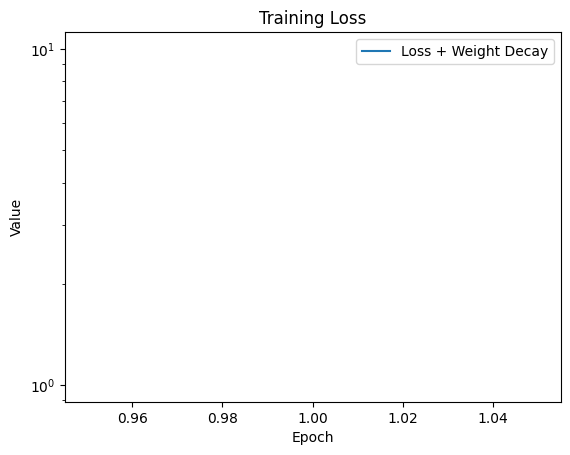

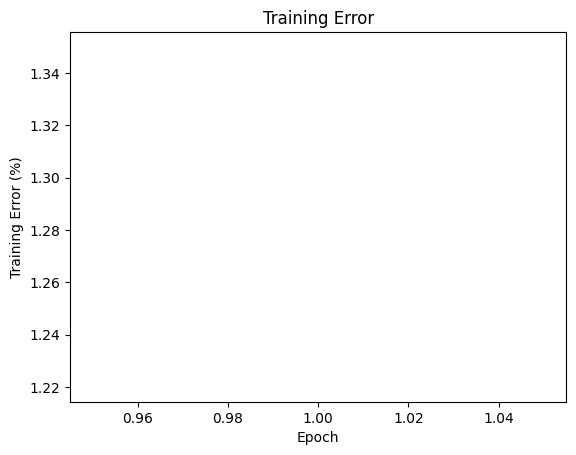

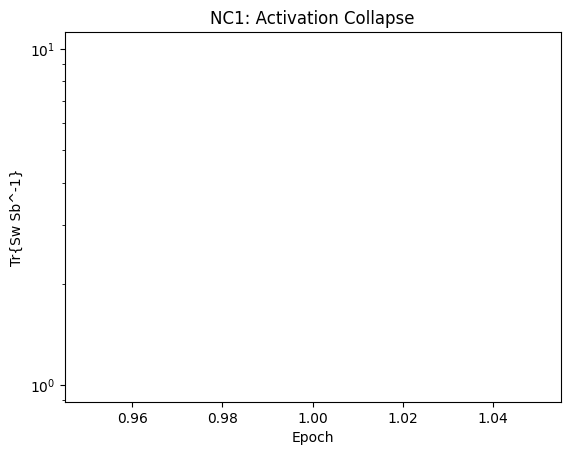

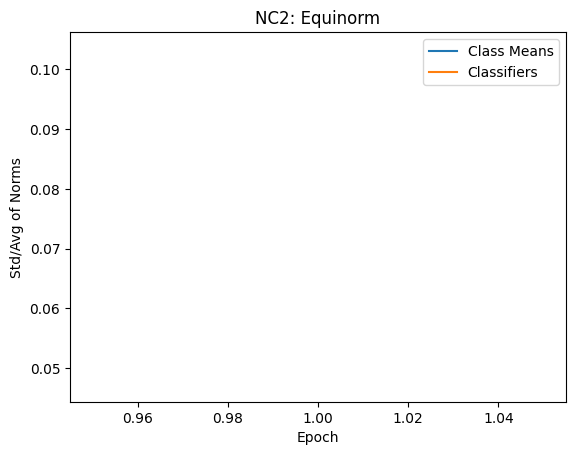

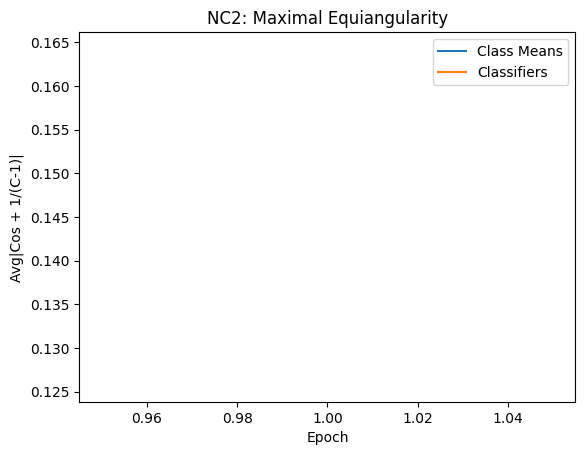

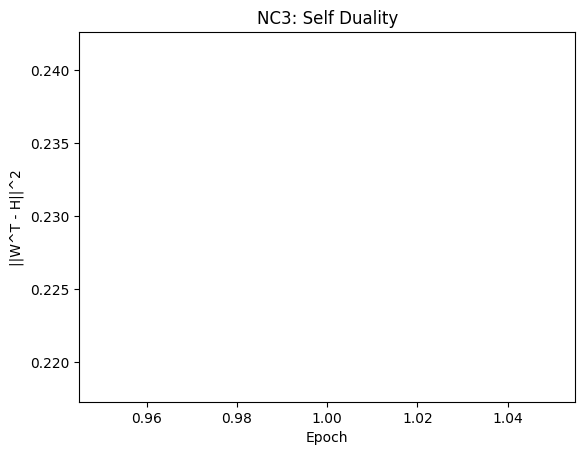

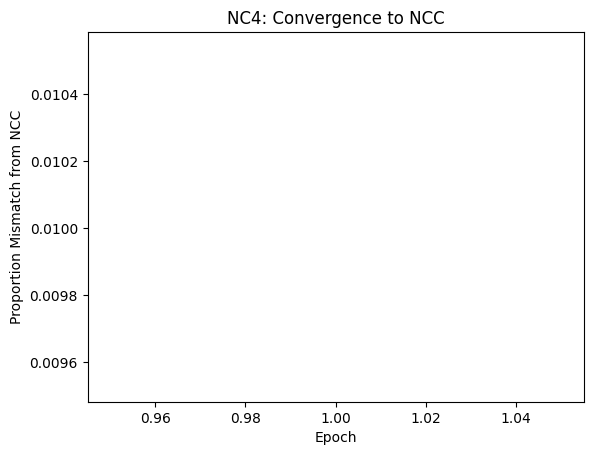

Train		Epoch: 2 [468/469 (100%)] 	Batch Loss: 0.020114 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.78it/s]
Analysis Cov	Epoch: 2 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.24it/s]


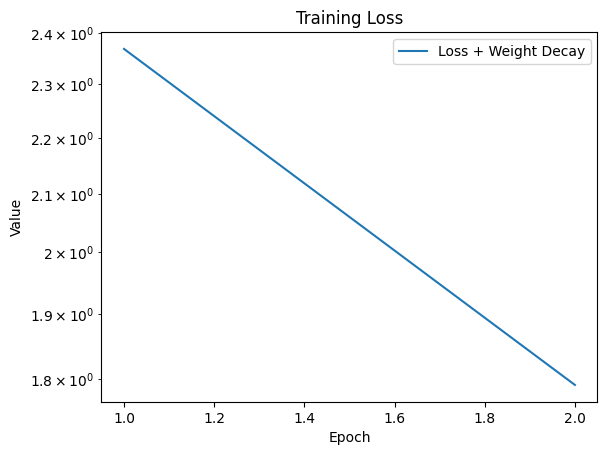

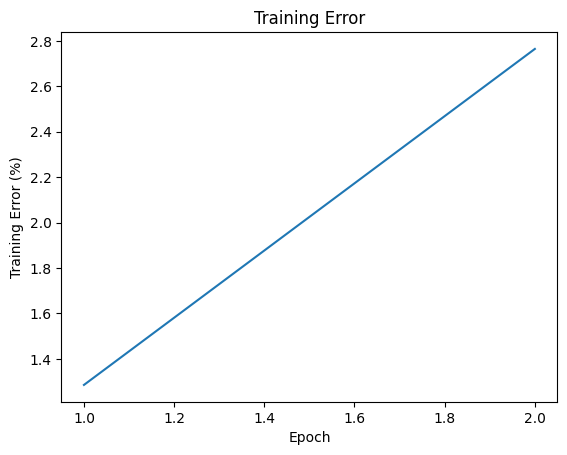

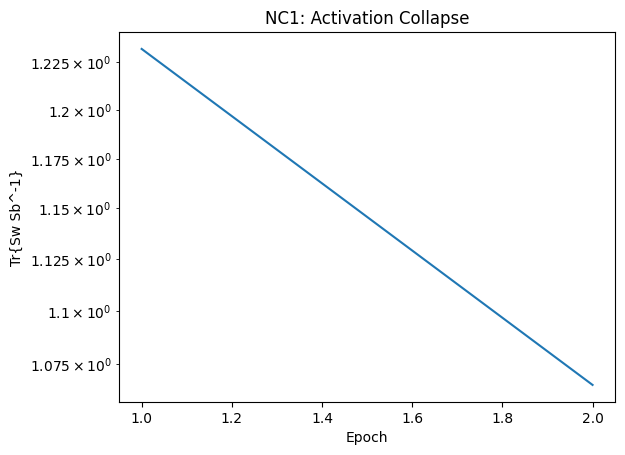

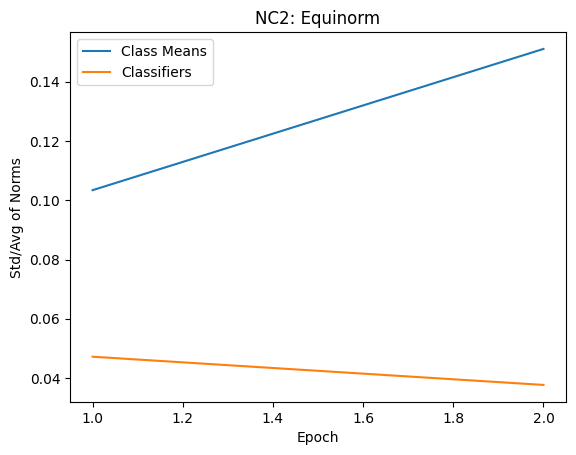

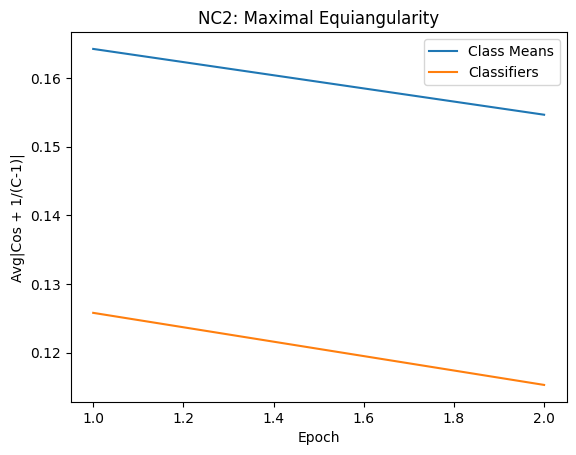

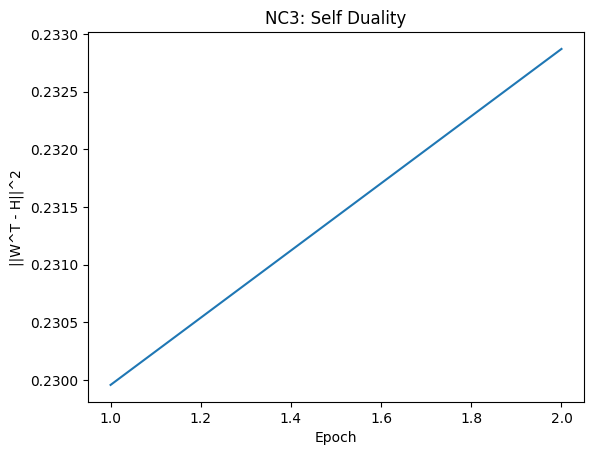

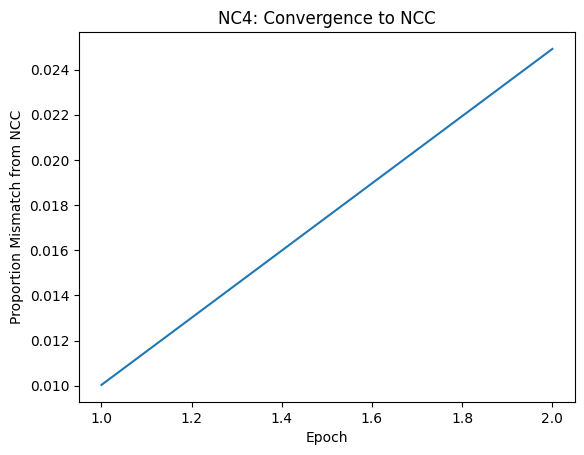

Train		Epoch: 3 [468/469 (100%)] 	Batch Loss: 0.010671 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.83it/s]
Analysis Cov	Epoch: 3 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.29it/s]


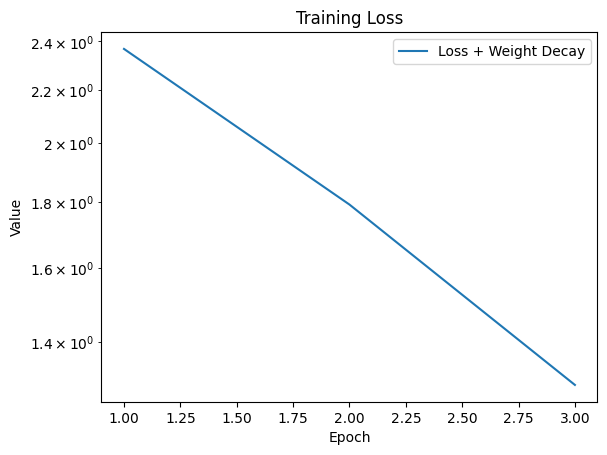

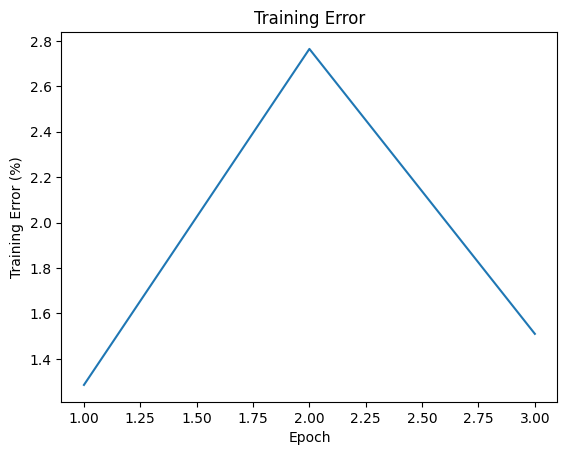

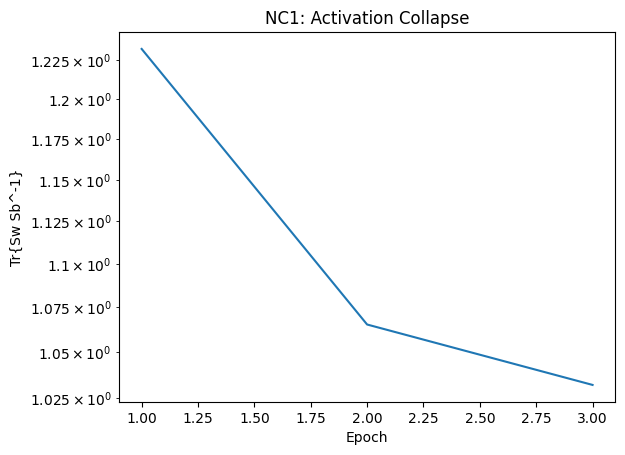

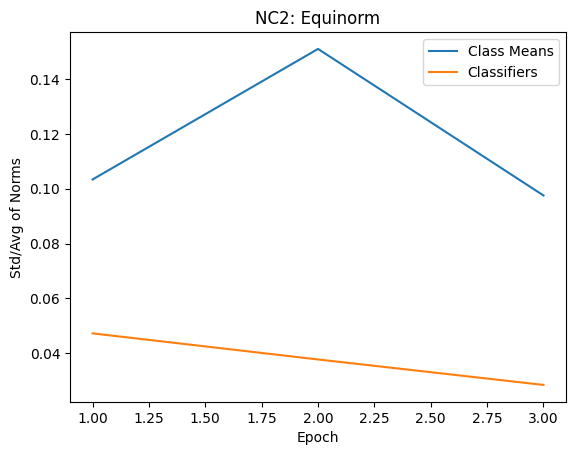

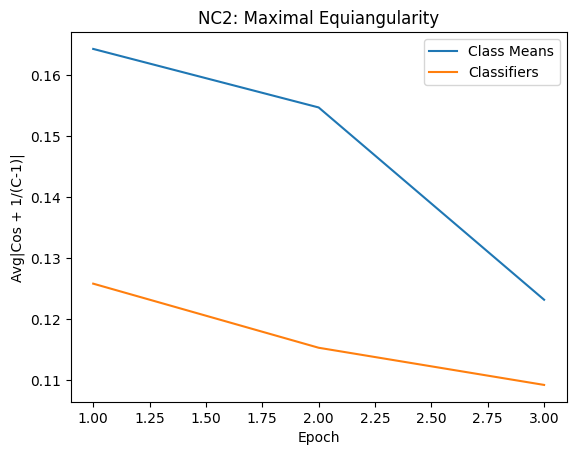

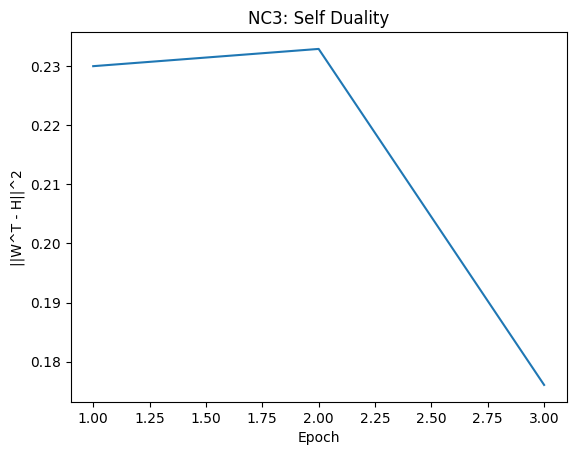

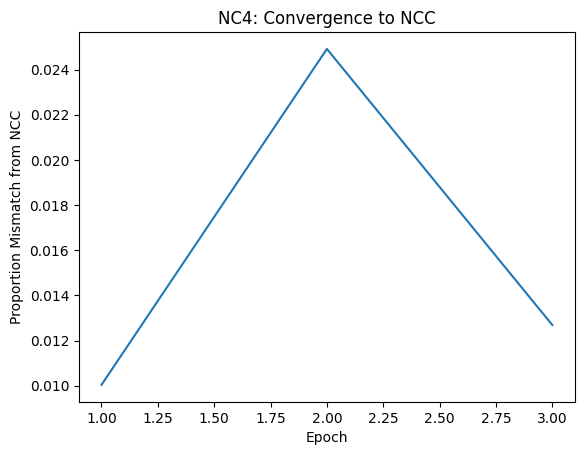

Train		Epoch: 4 [468/469 (100%)] 	Batch Loss: 0.001542 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.75it/s]
Analysis Cov	Epoch: 4 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.21it/s]


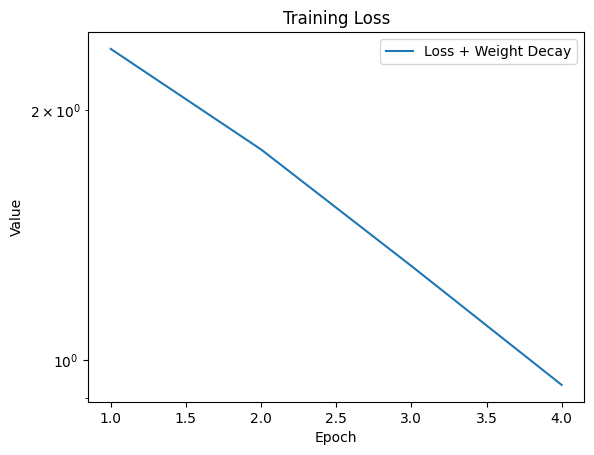

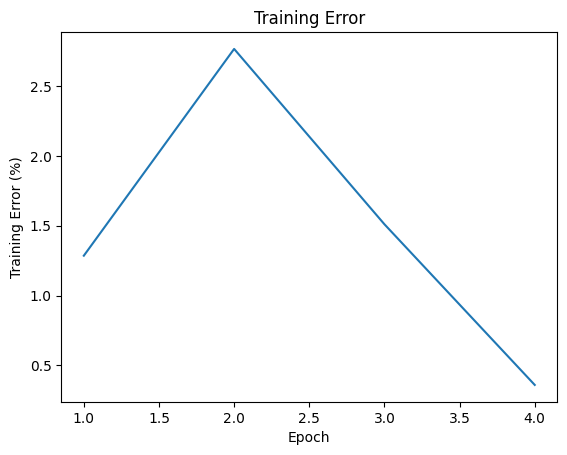

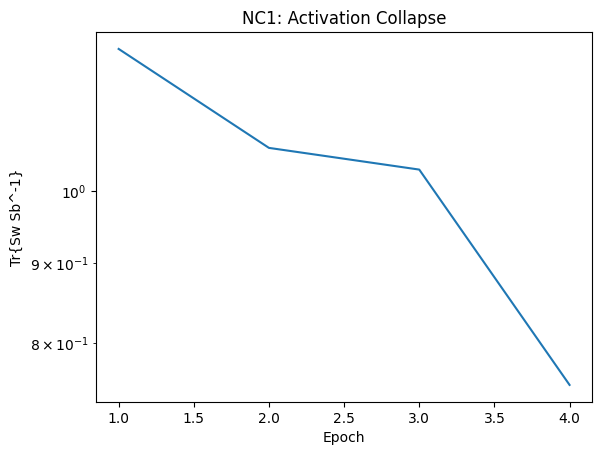

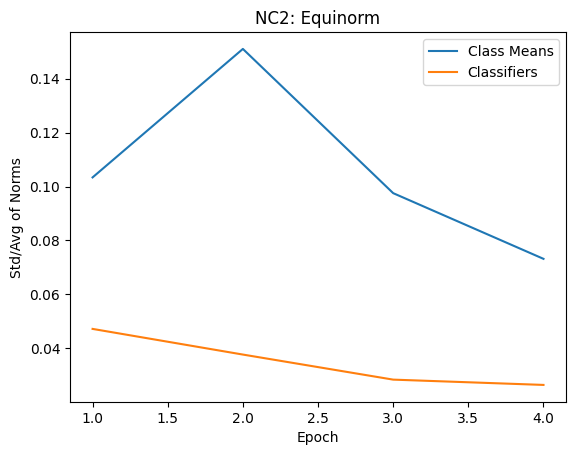

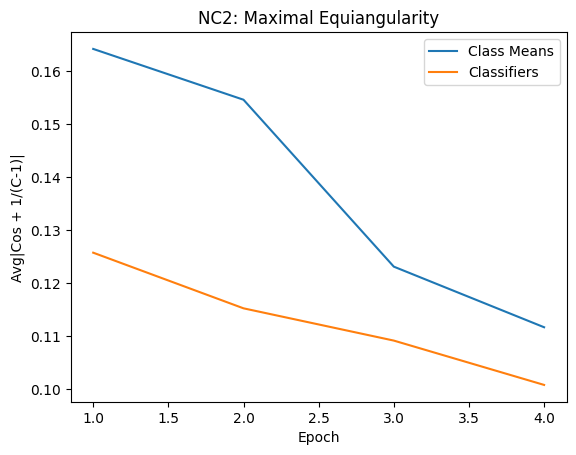

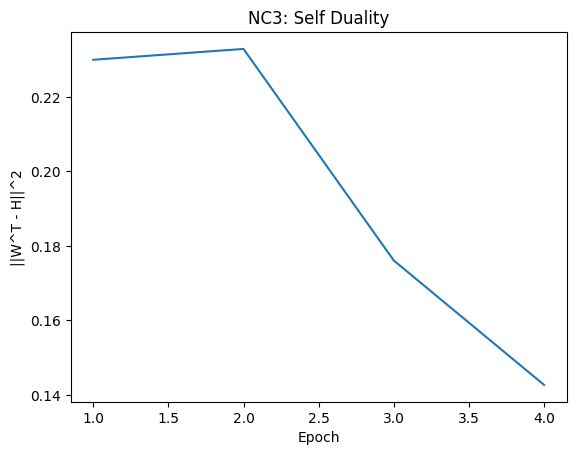

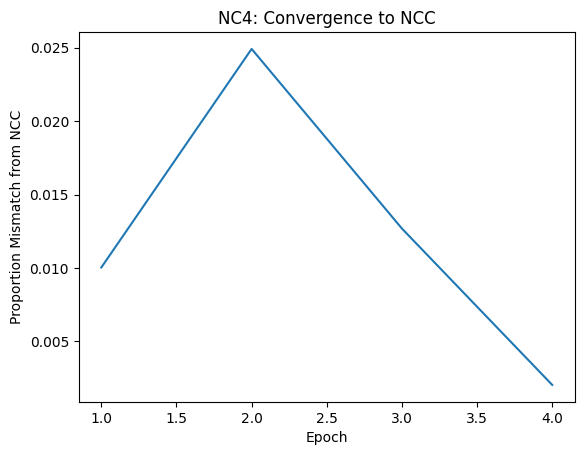

Train		Epoch: 5 [468/469 (100%)] 	Batch Loss: 0.035536 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.68it/s]
Analysis Cov	Epoch: 5 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.23it/s]


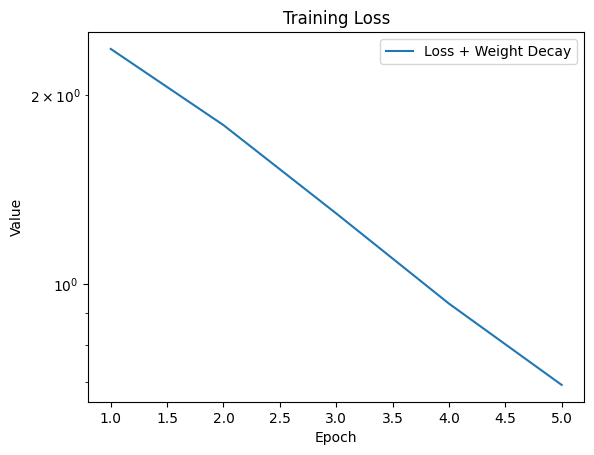

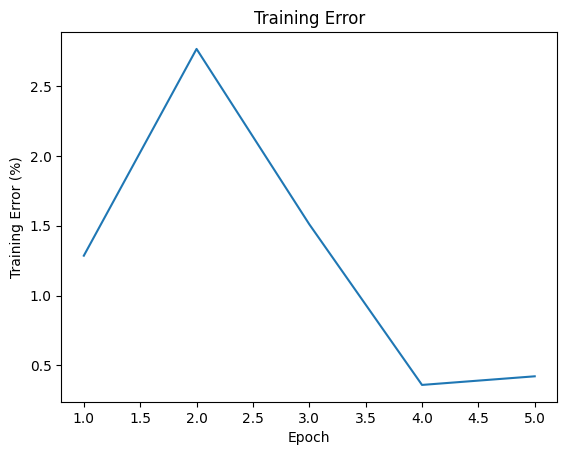

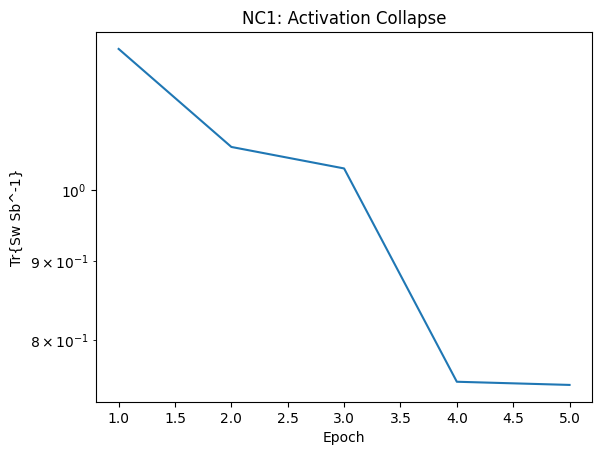

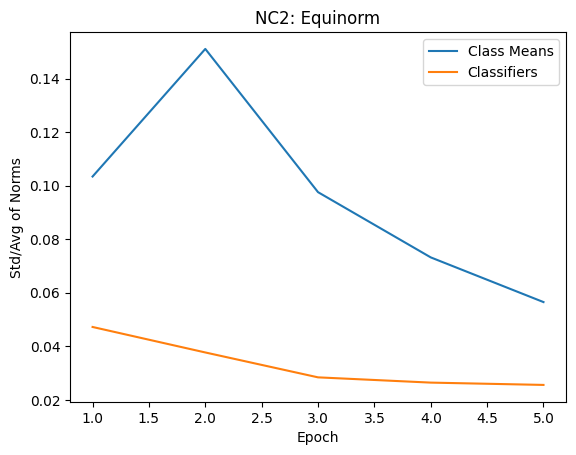

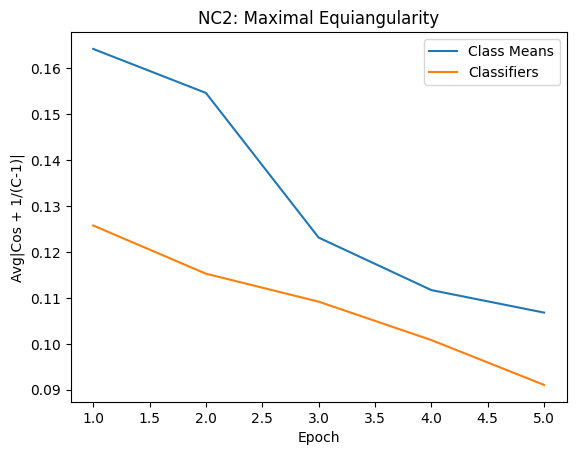

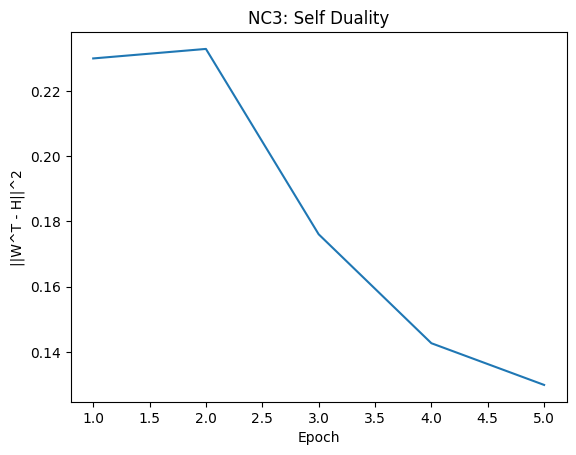

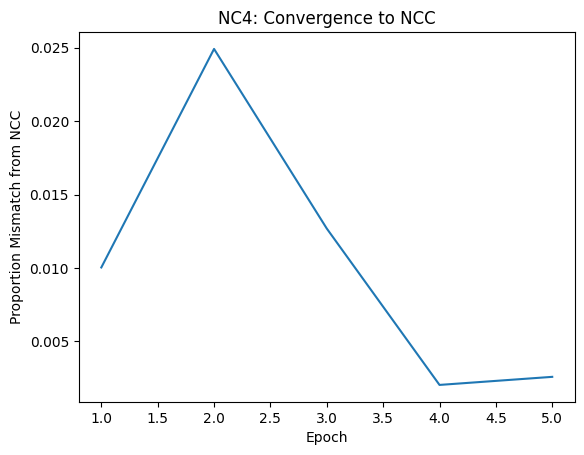

Train		Epoch: 6 [468/469 (100%)] 	Batch Loss: 0.024764 	Batch Accuracy: 0.984375: 100%|█████████▉| 468/469 [00:43<00:00, 10.73it/s]
Analysis Cov	Epoch: 6 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.13it/s]


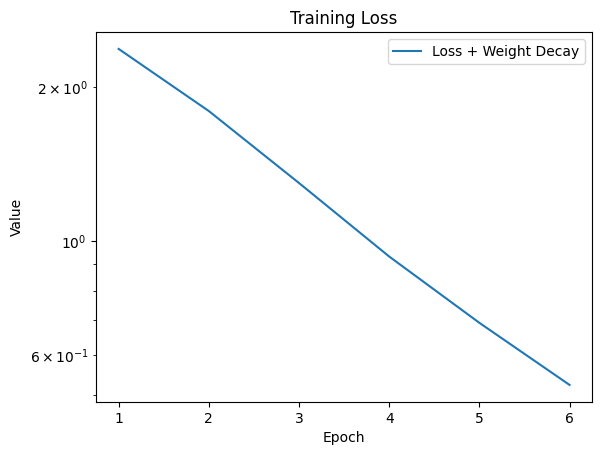

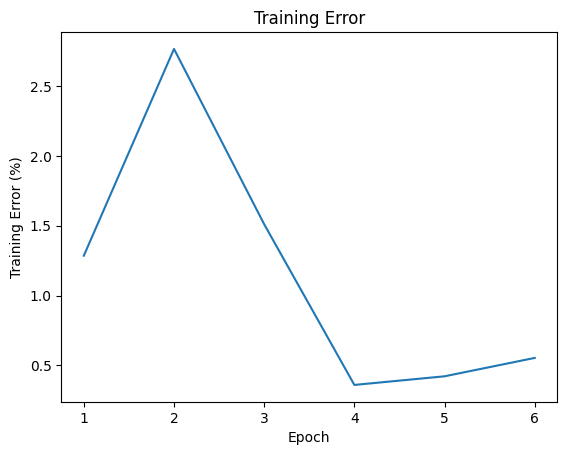

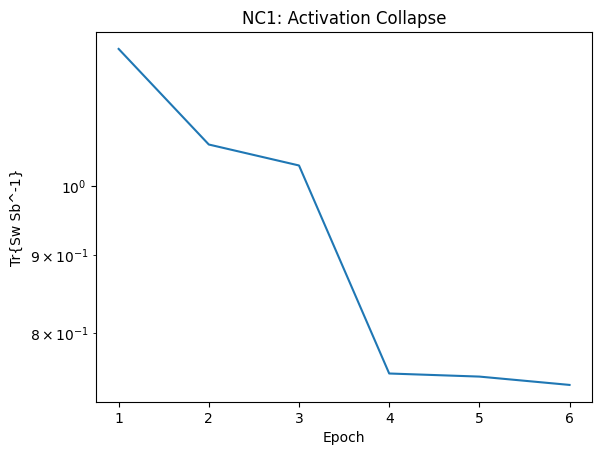

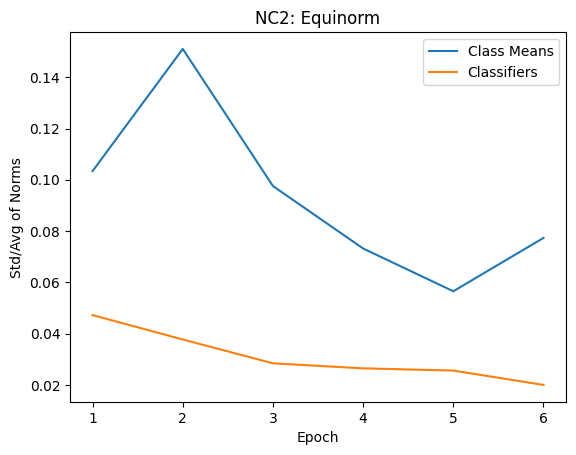

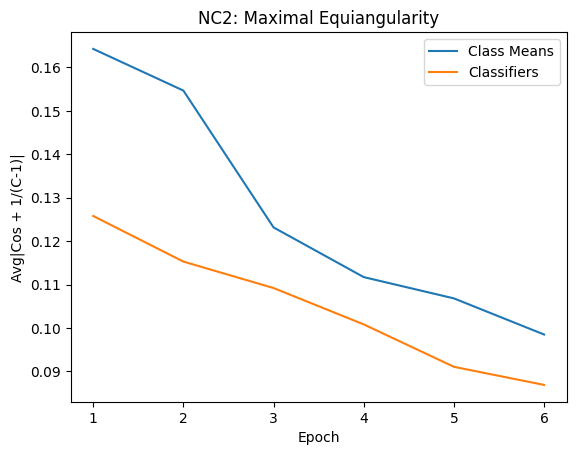

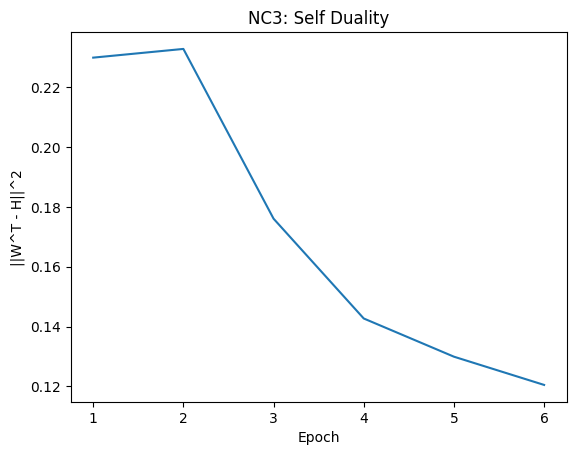

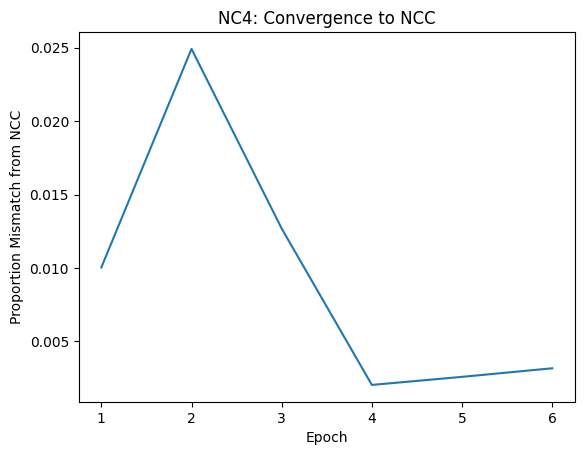

Train		Epoch: 7 [468/469 (100%)] 	Batch Loss: 0.006738 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Analysis Cov	Epoch: 7 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.23it/s]


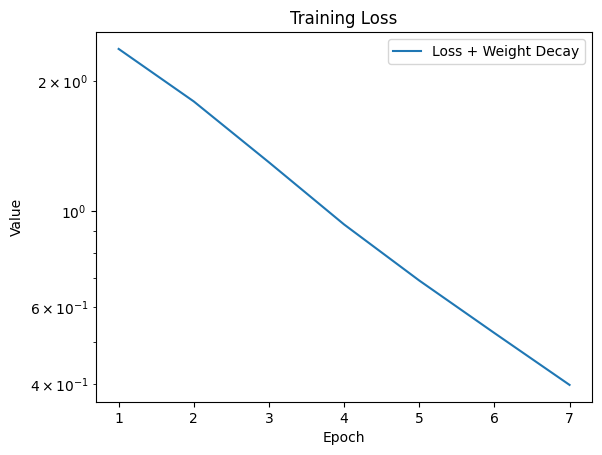

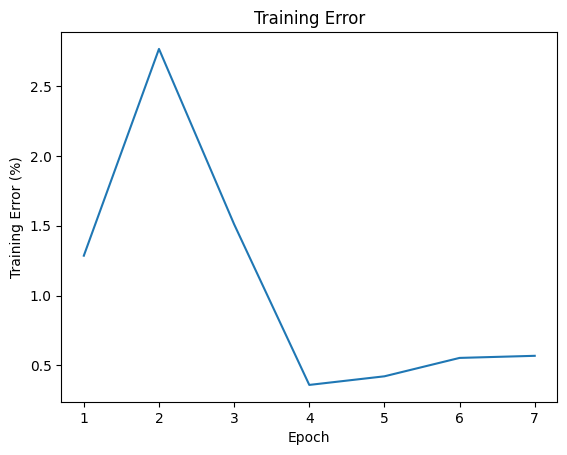

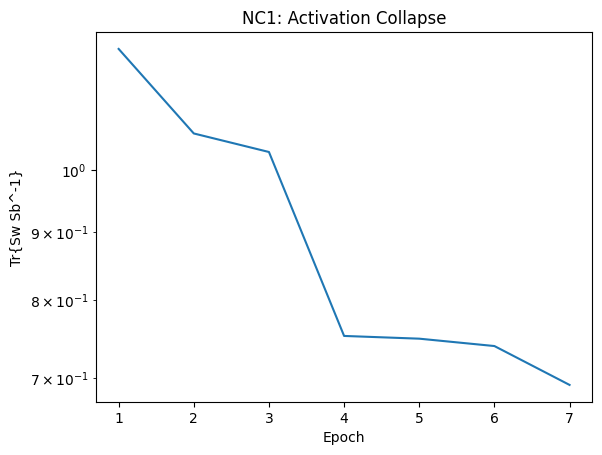

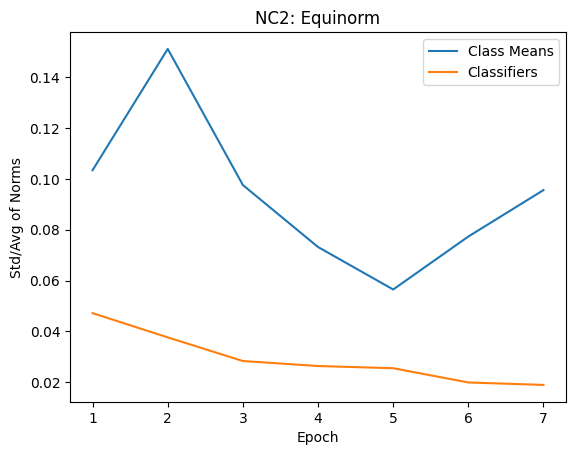

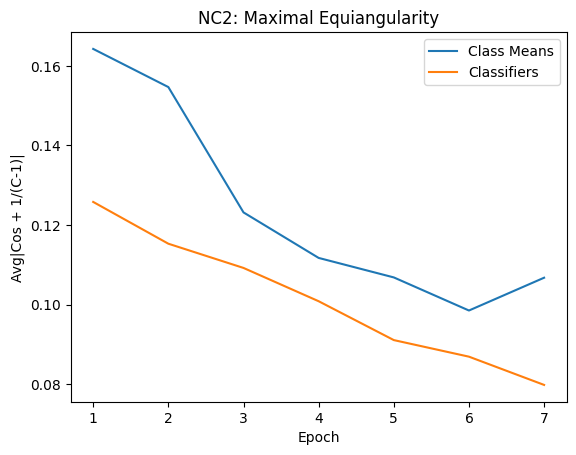

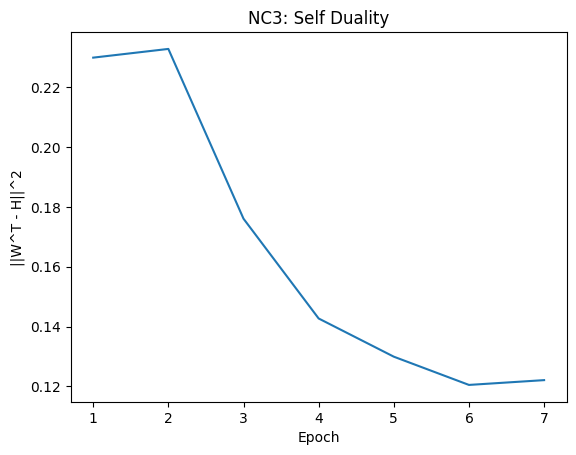

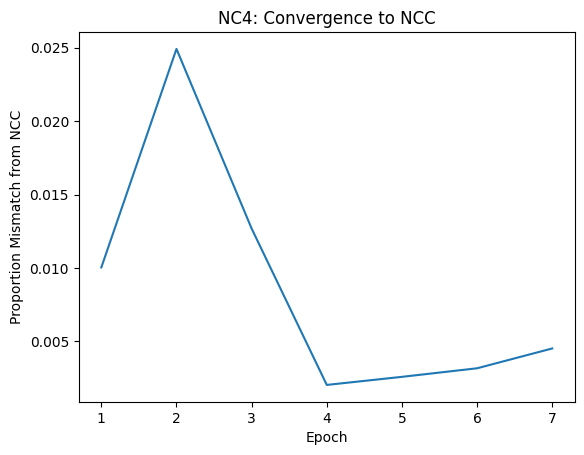

Train		Epoch: 8 [468/469 (100%)] 	Batch Loss: 0.011998 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Analysis Cov	Epoch: 8 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.29it/s]


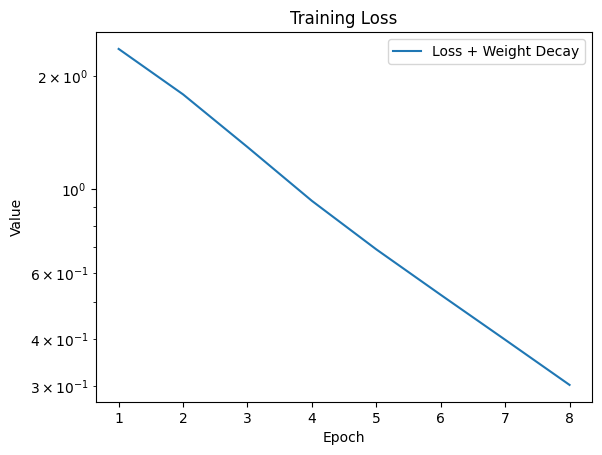

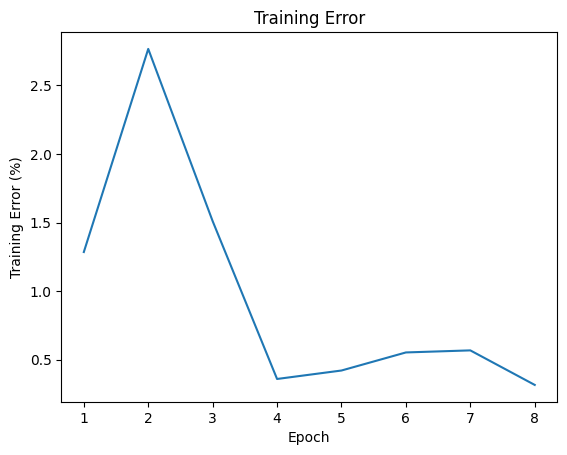

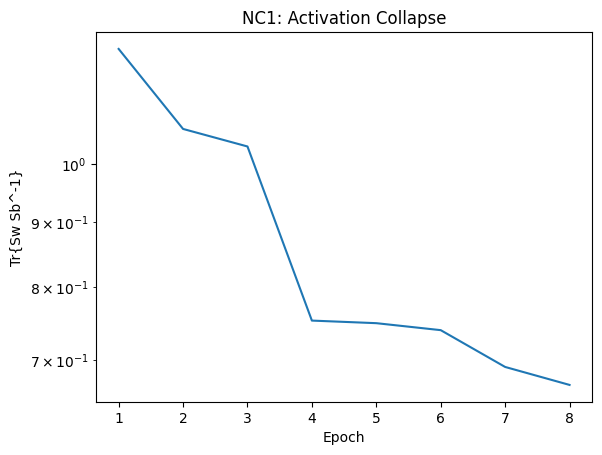

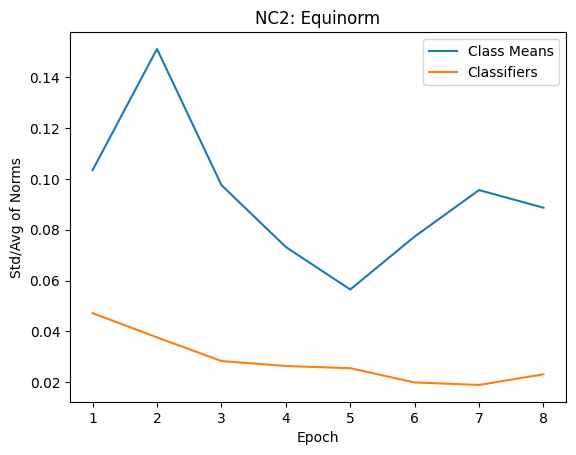

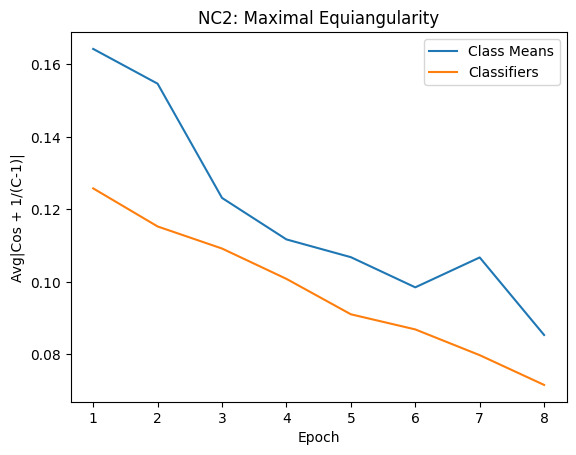

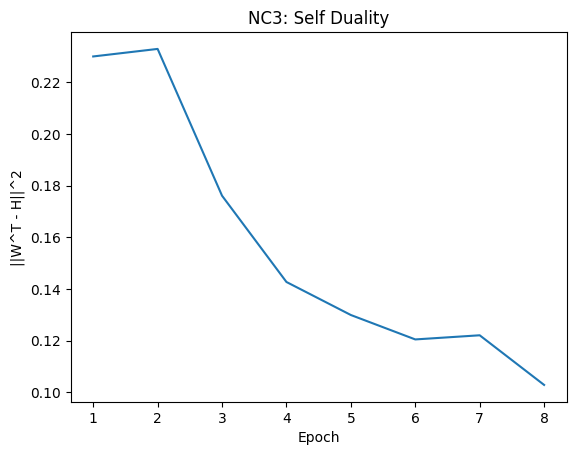

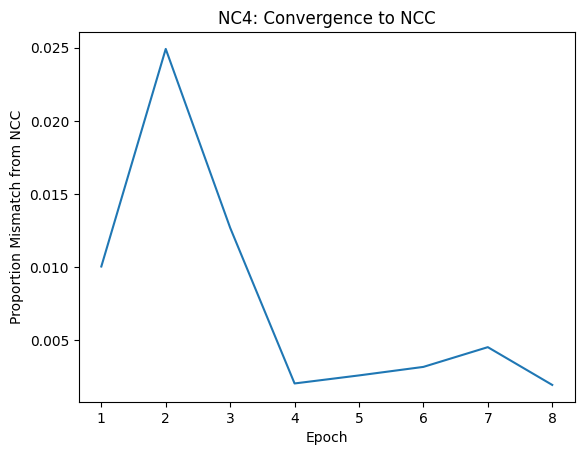

Train		Epoch: 9 [468/469 (100%)] 	Batch Loss: 0.032573 	Batch Accuracy: 0.984375: 100%|█████████▉| 468/469 [00:43<00:00, 10.74it/s]
Analysis Cov	Epoch: 9 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.16it/s]


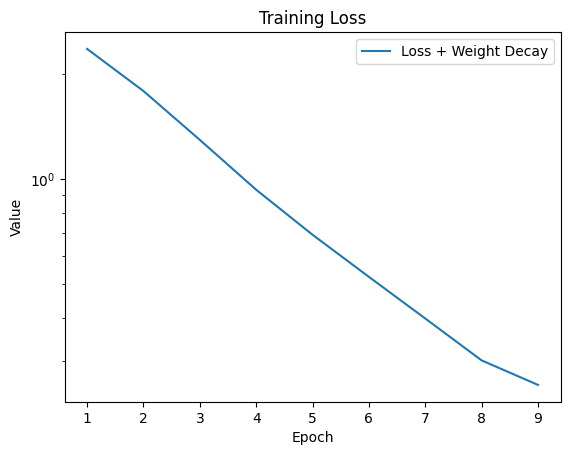

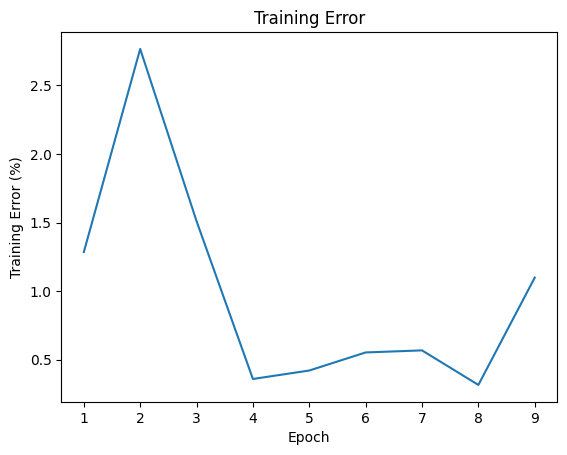

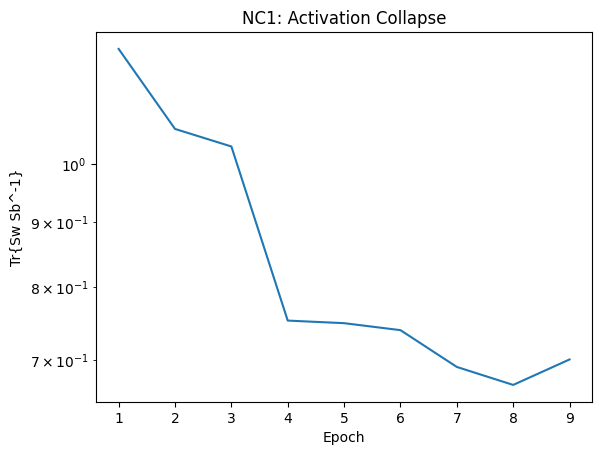

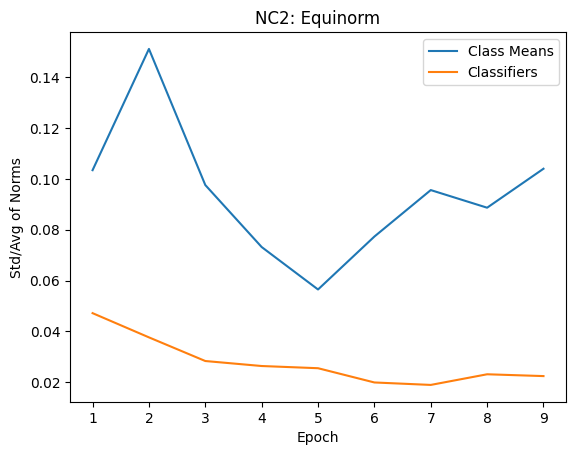

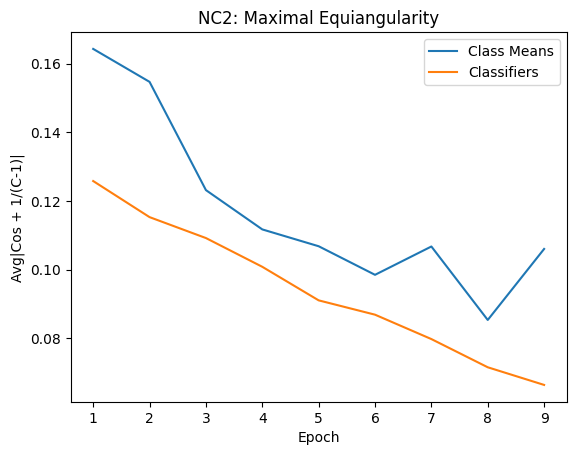

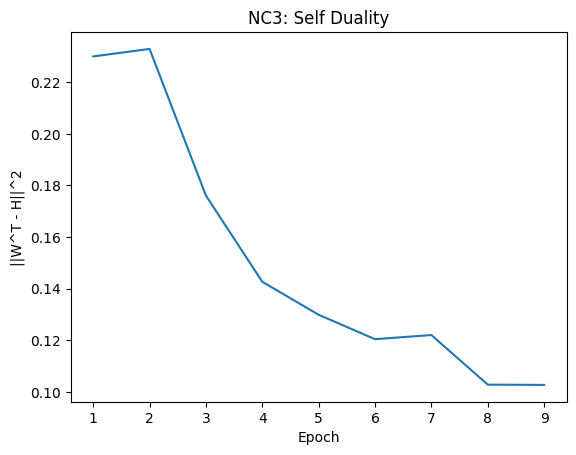

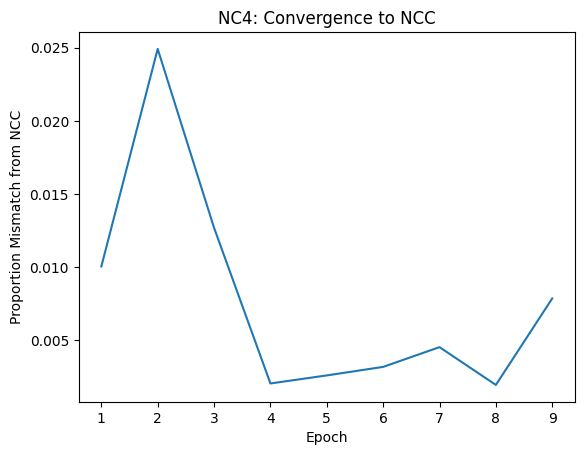

Train		Epoch: 10 [468/469 (100%)] 	Batch Loss: 0.013903 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Analysis Cov	Epoch: 10 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.14it/s]


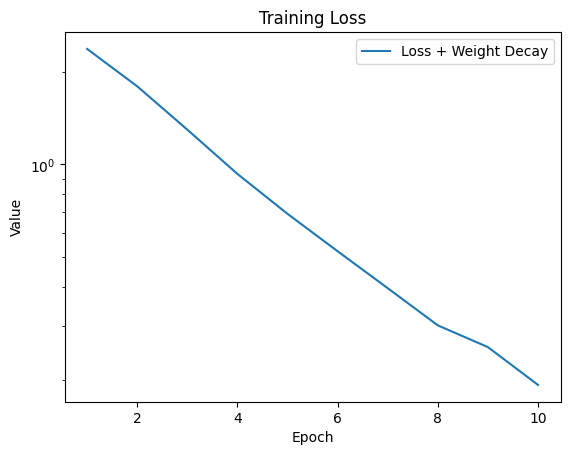

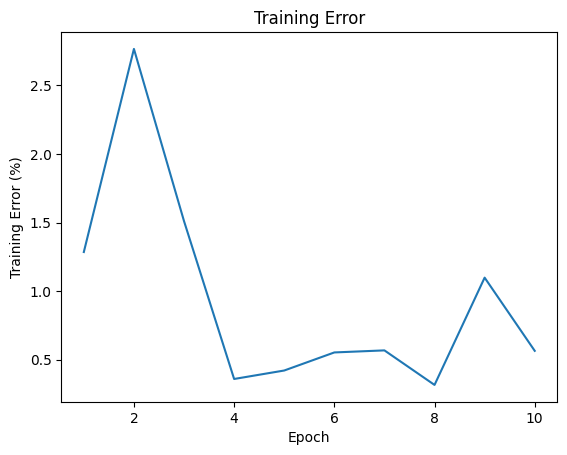

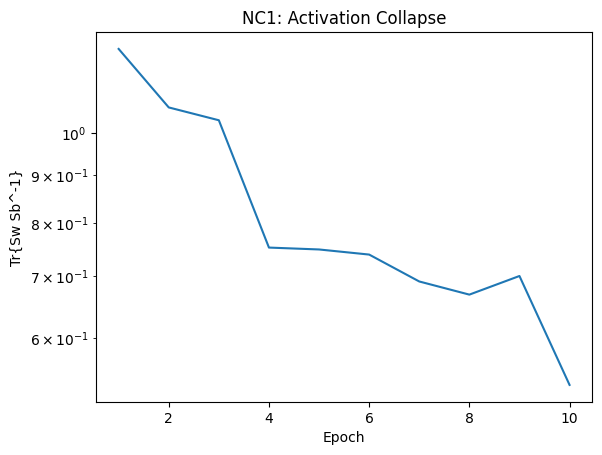

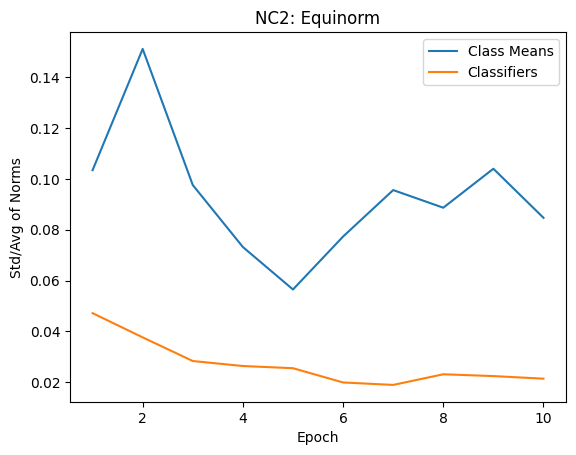

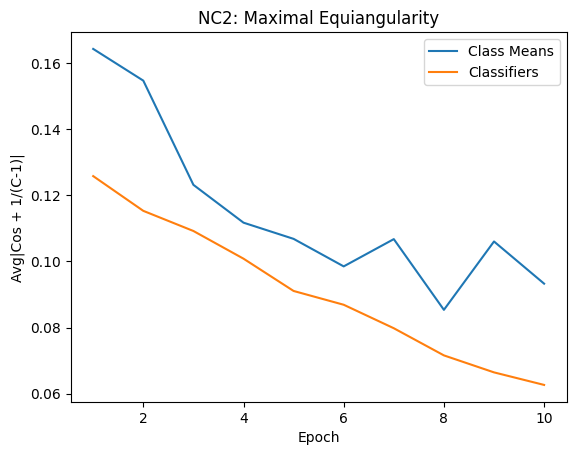

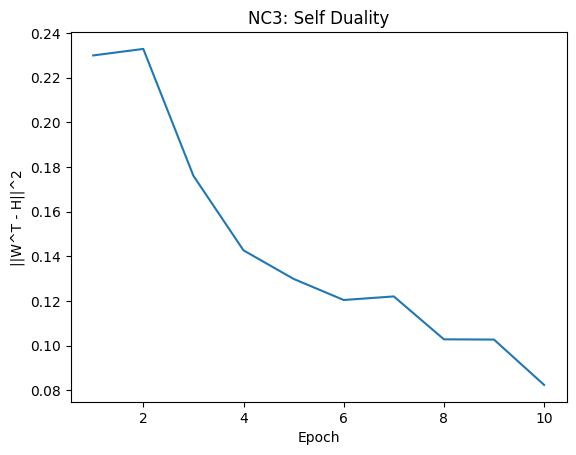

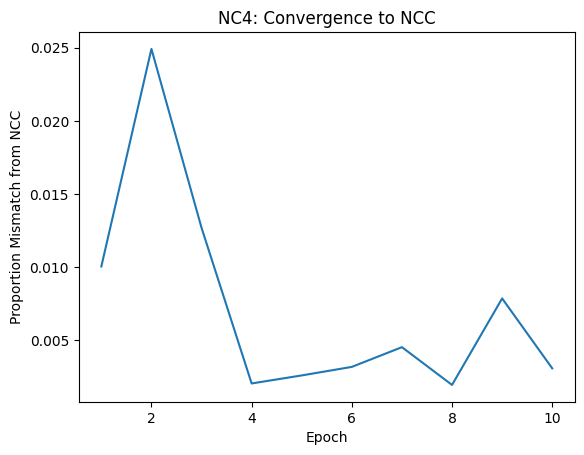

Train		Epoch: 11 [468/469 (100%)] 	Batch Loss: 0.023450 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.75it/s]
Analysis Cov	Epoch: 11 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.22it/s]


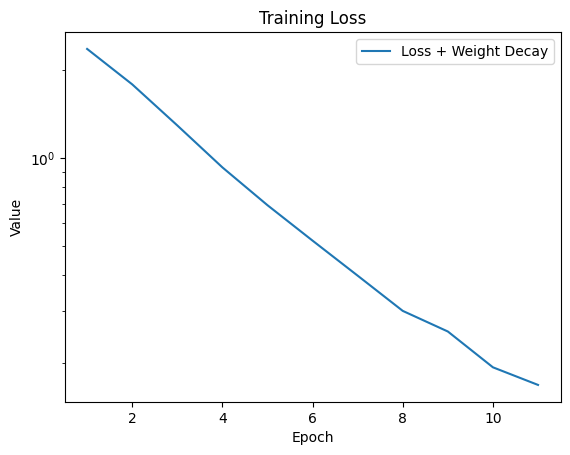

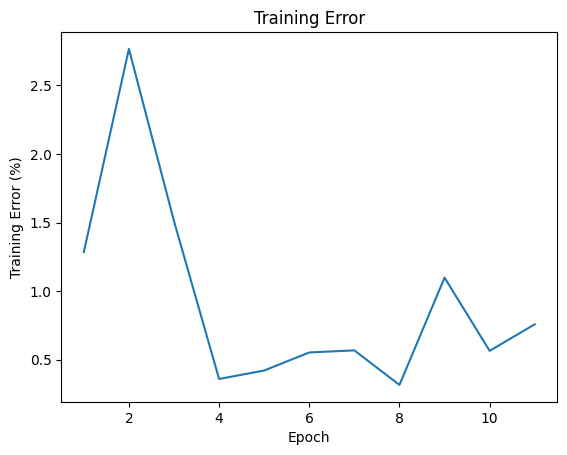

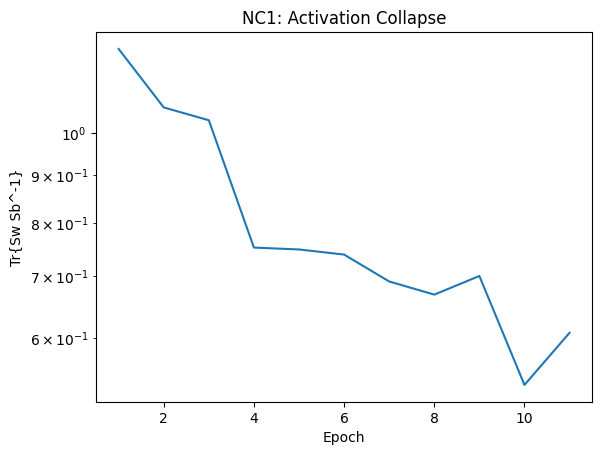

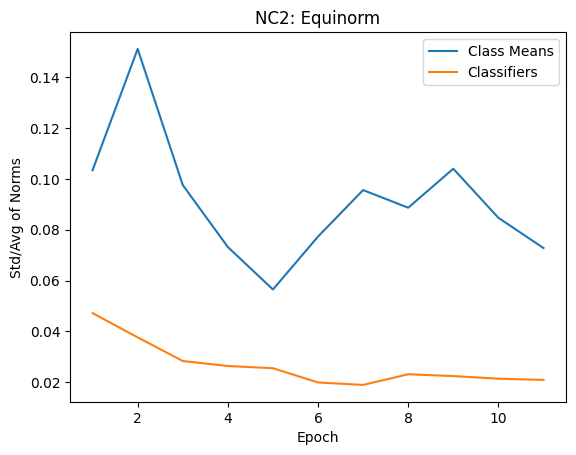

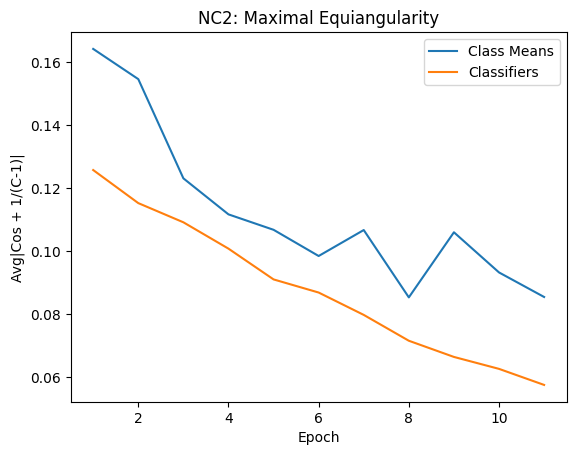

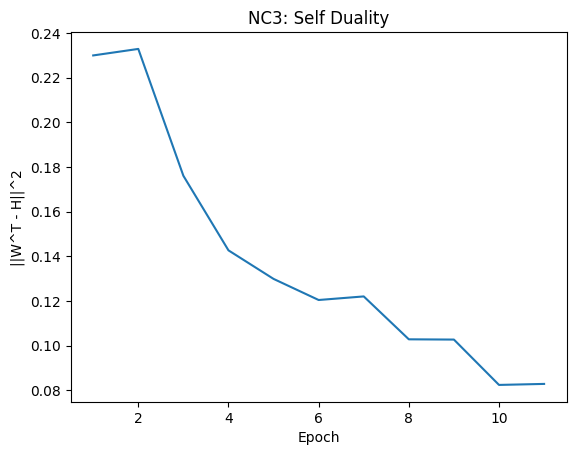

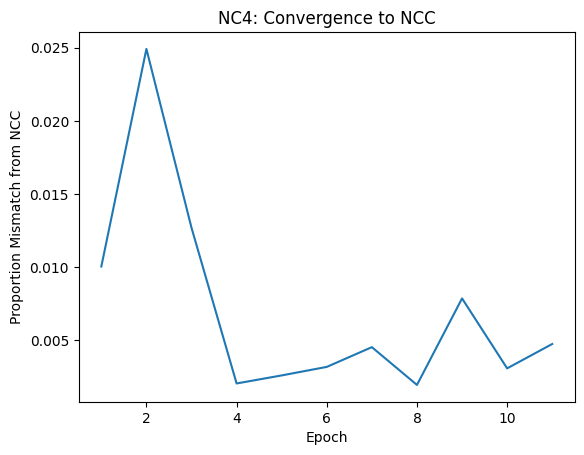

Train		Epoch: 12 [468/469 (100%)] 	Batch Loss: 0.005377 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Analysis Cov	Epoch: 12 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.18it/s]


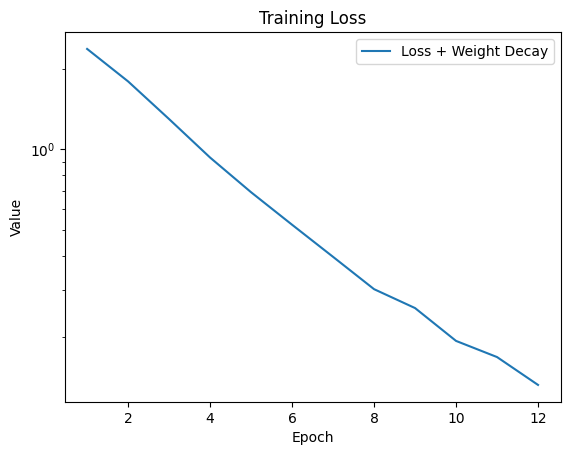

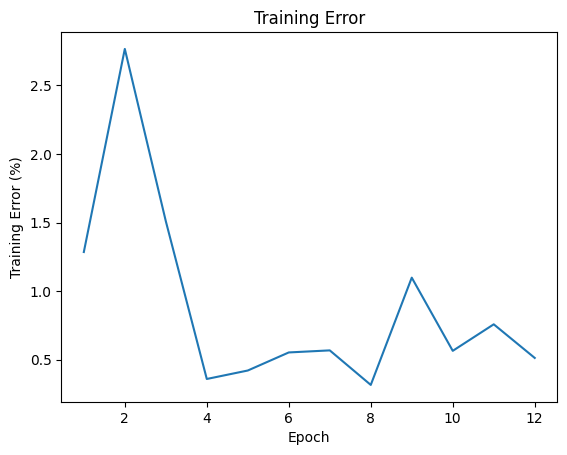

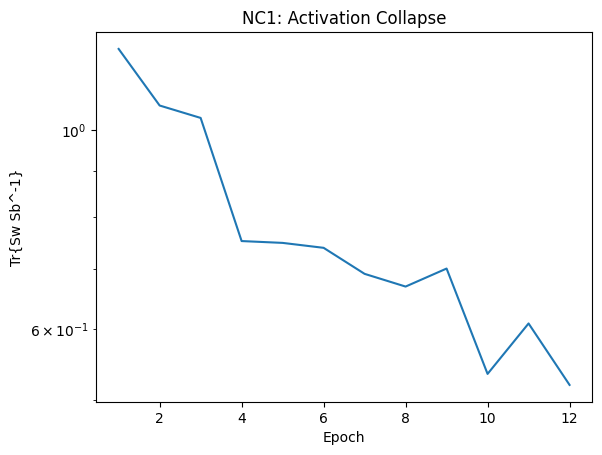

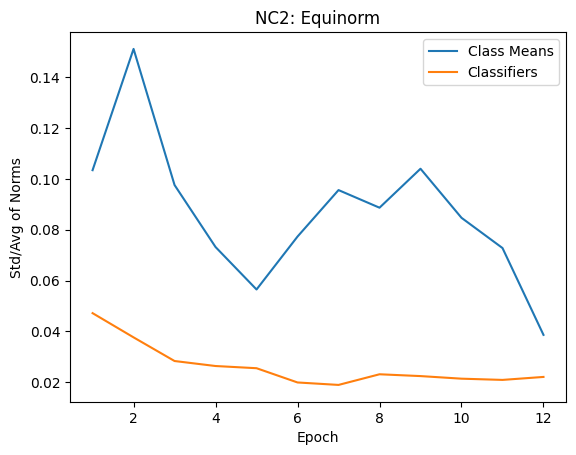

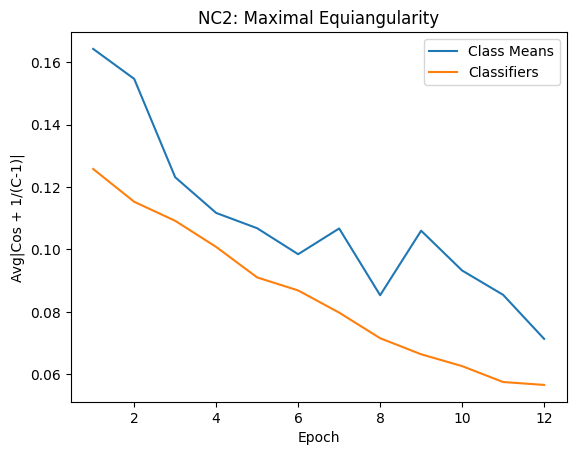

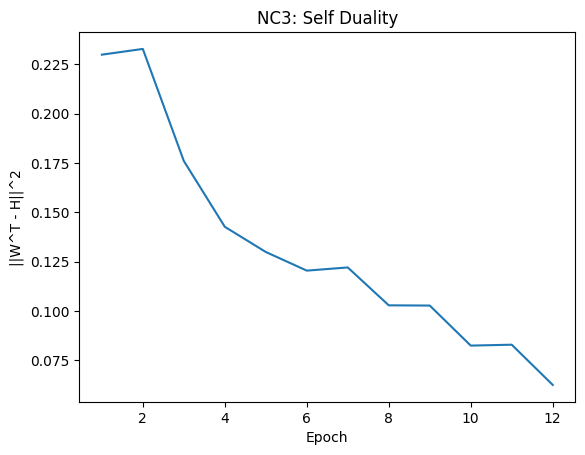

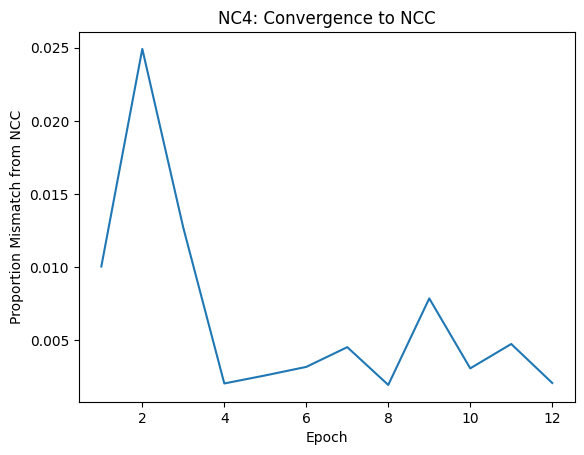

Train		Epoch: 13 [468/469 (100%)] 	Batch Loss: 0.005438 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.74it/s]
Analysis Cov	Epoch: 13 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.20it/s]


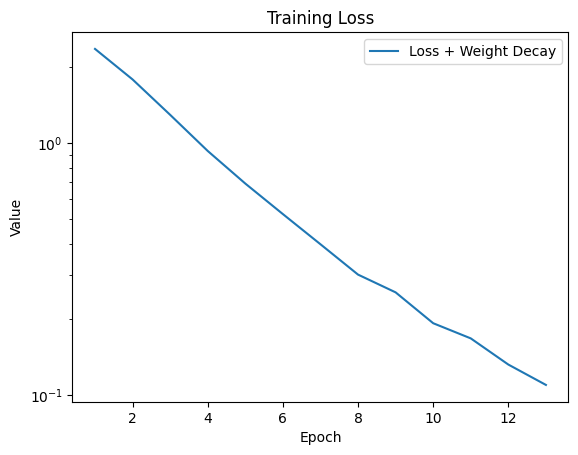

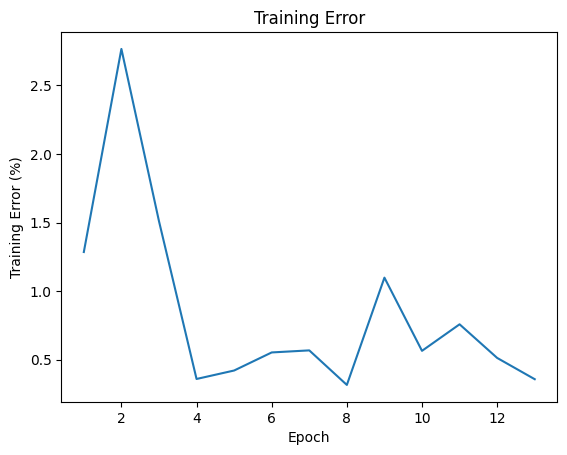

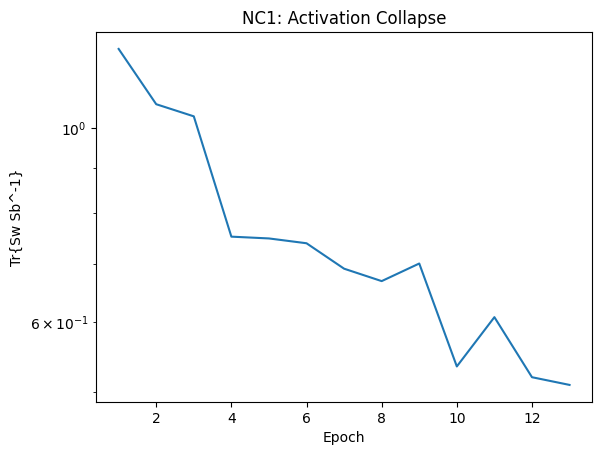

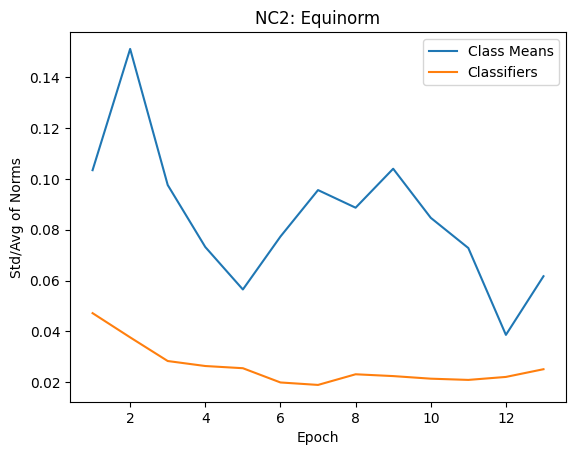

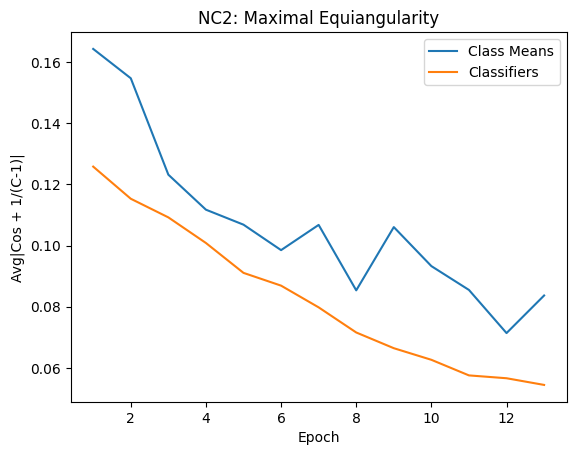

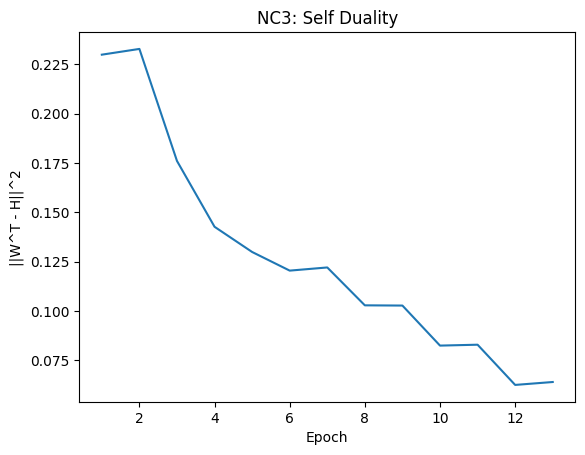

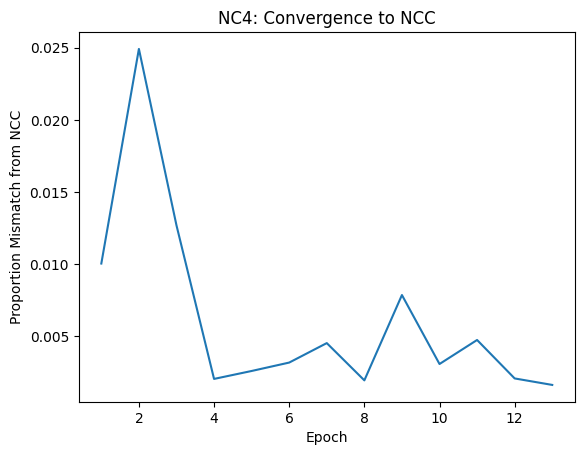

Train		Epoch: 14 [468/469 (100%)] 	Batch Loss: 0.011691 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.71it/s]
Analysis Cov	Epoch: 14 [469/469 (100%)]: 100%|██████████| 469/469 [00:31<00:00, 15.04it/s]


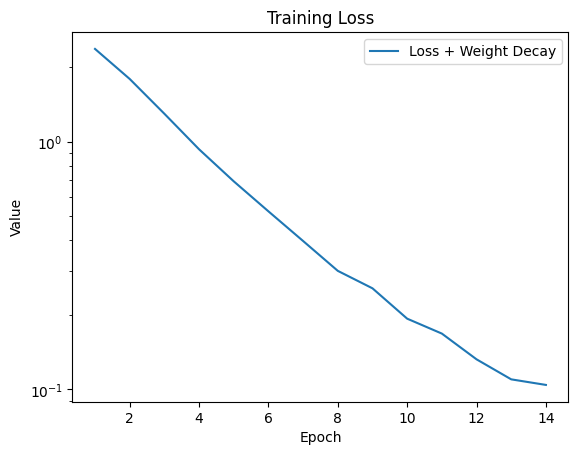

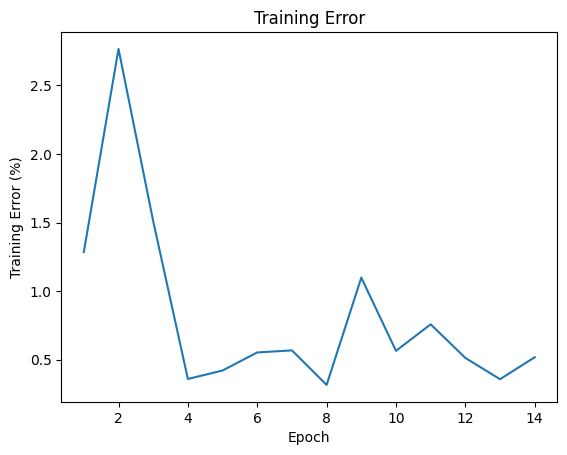

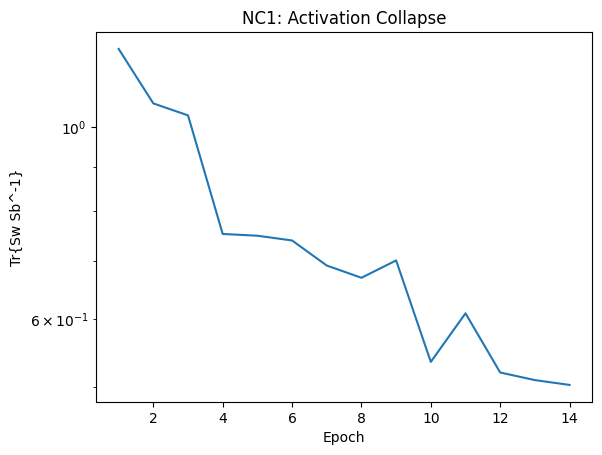

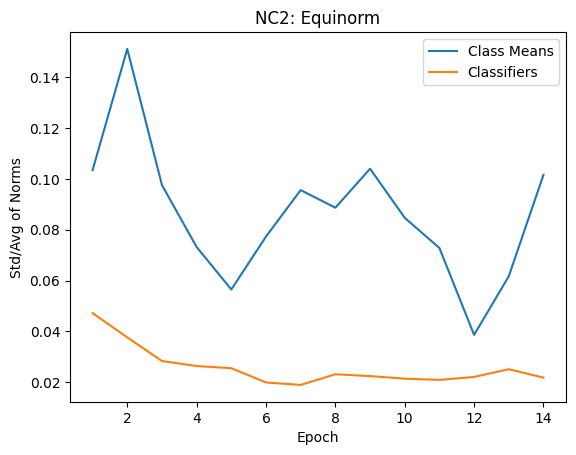

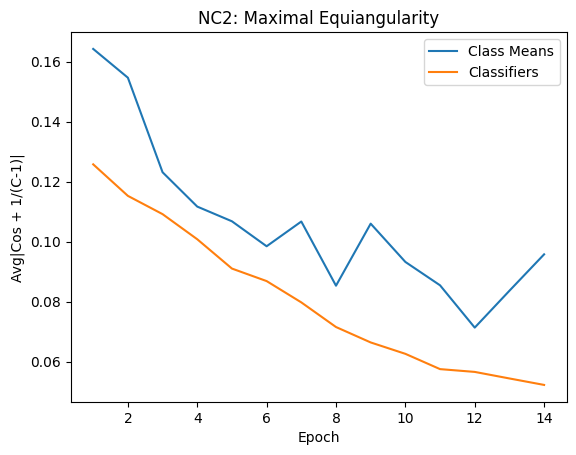

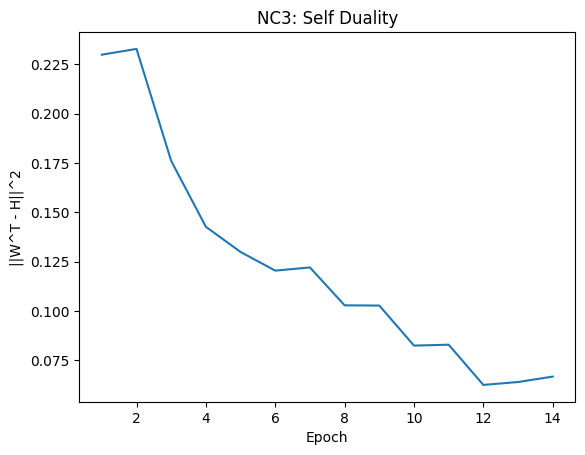

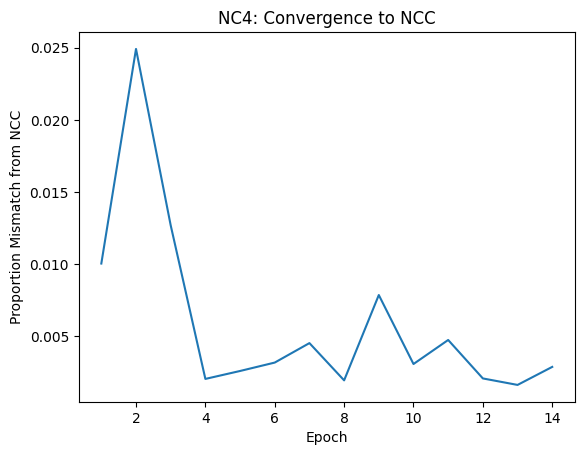

Train		Epoch: 15 [468/469 (100%)] 	Batch Loss: 0.014201 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.74it/s]
Train		Epoch: 16 [468/469 (100%)] 	Batch Loss: 0.007411 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Analysis Cov	Epoch: 16 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.18it/s]


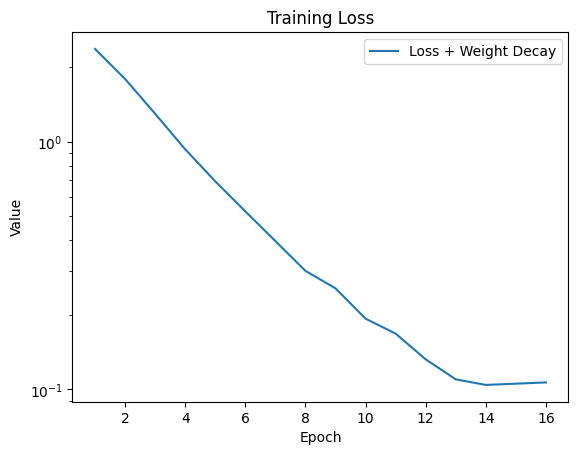

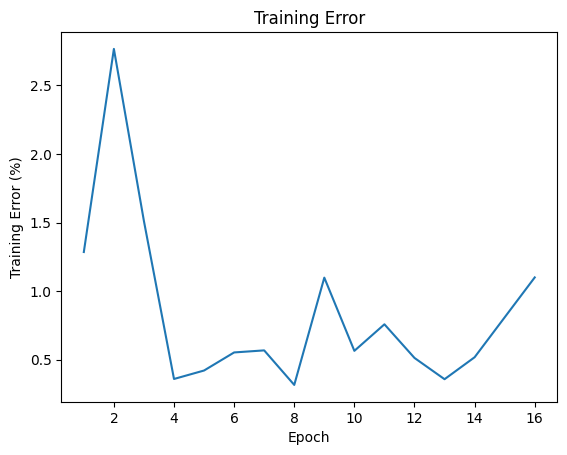

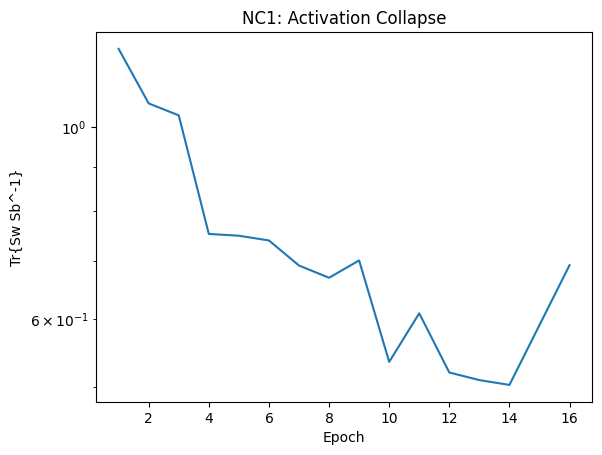

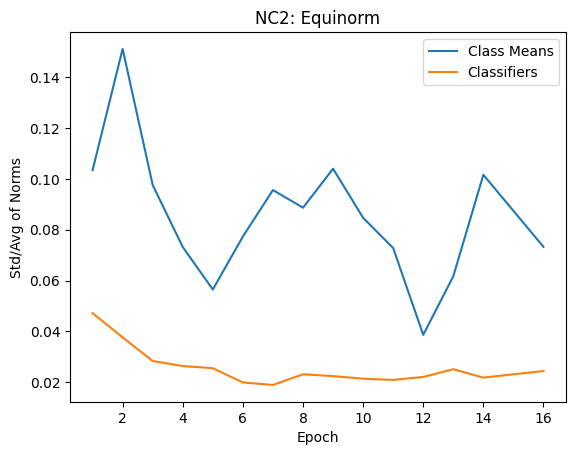

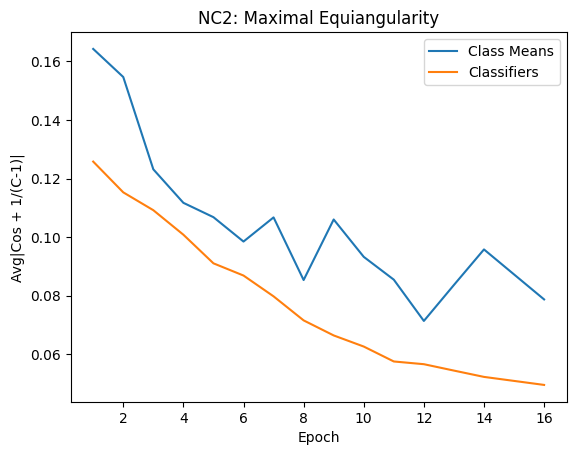

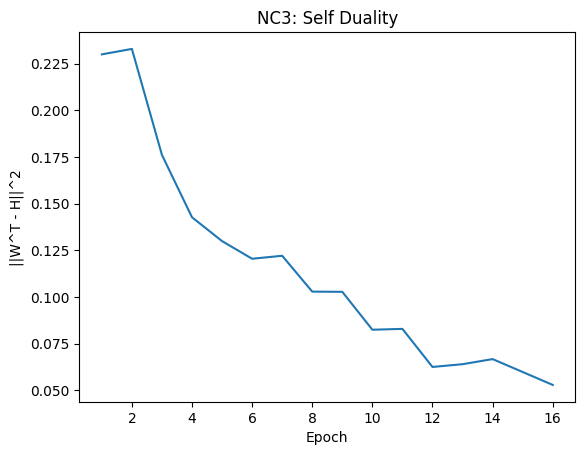

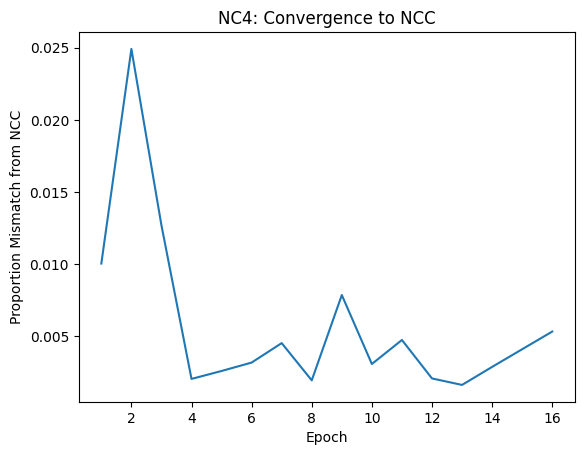

Train		Epoch: 17 [468/469 (100%)] 	Batch Loss: 0.002873 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.74it/s]
Analysis Cov	Epoch: 17 [469/469 (100%)]: 100%|██████████| 469/469 [00:31<00:00, 15.09it/s]


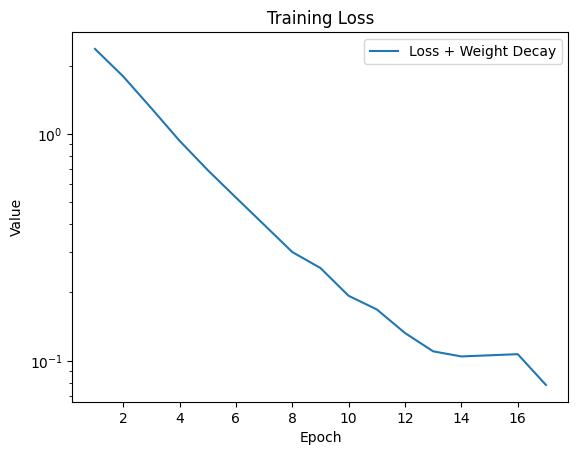

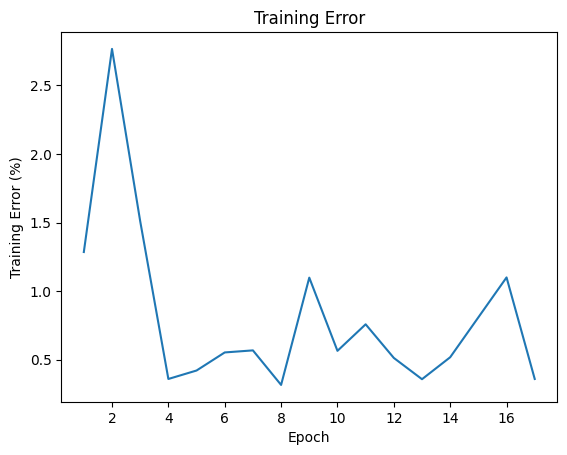

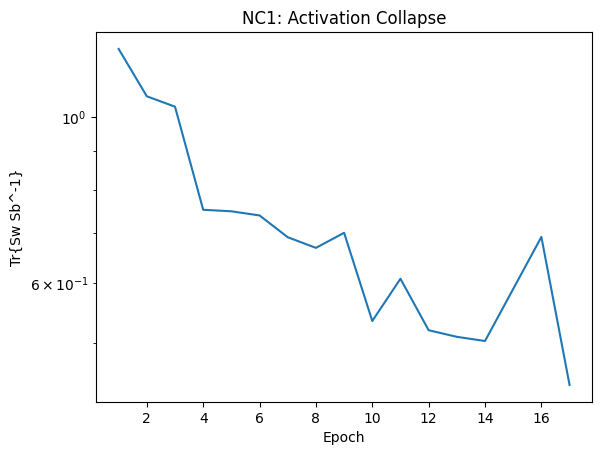

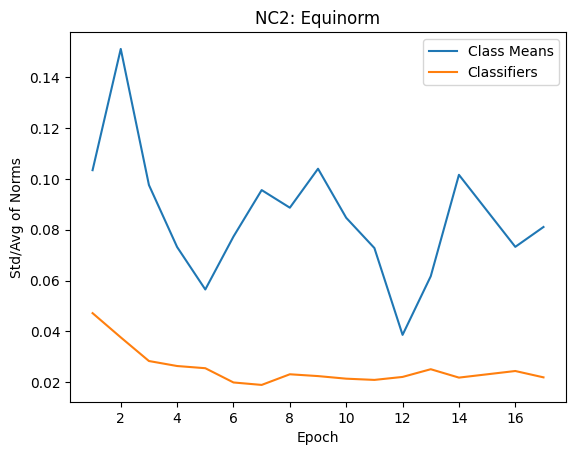

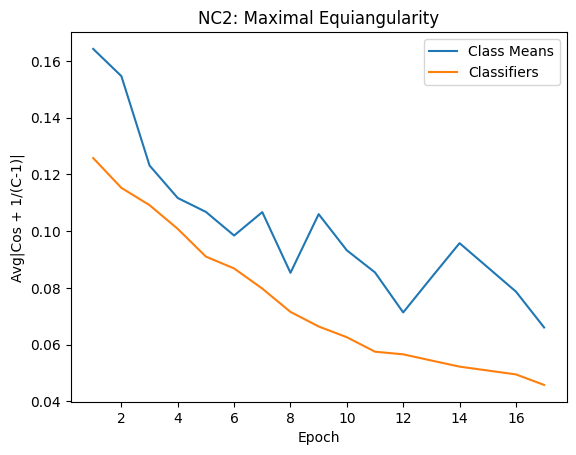

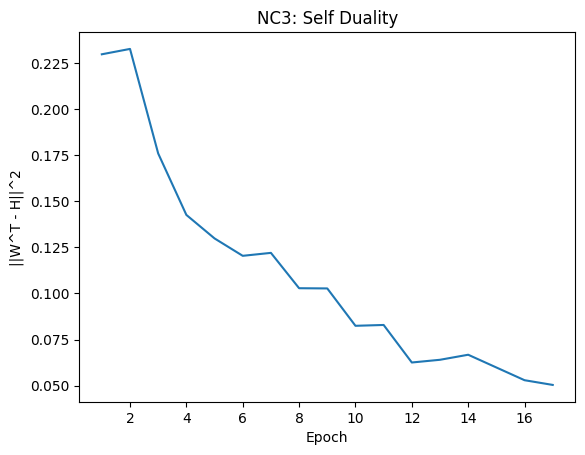

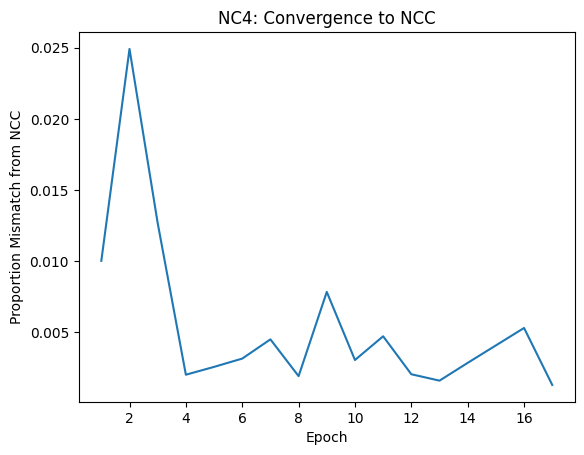

Train		Epoch: 18 [468/469 (100%)] 	Batch Loss: 0.008292 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.70it/s]
Train		Epoch: 19 [468/469 (100%)] 	Batch Loss: 0.007375 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.74it/s]
Analysis Cov	Epoch: 19 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.22it/s]


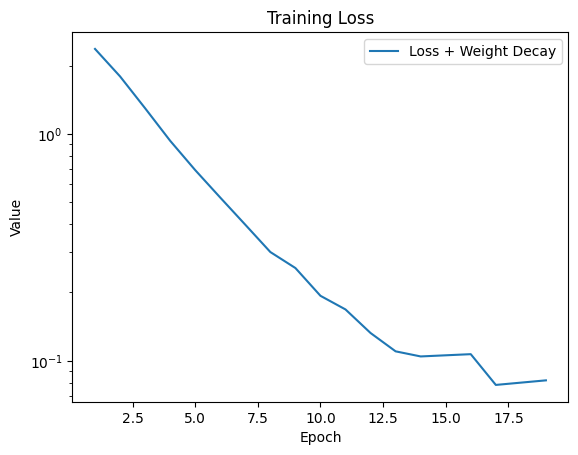

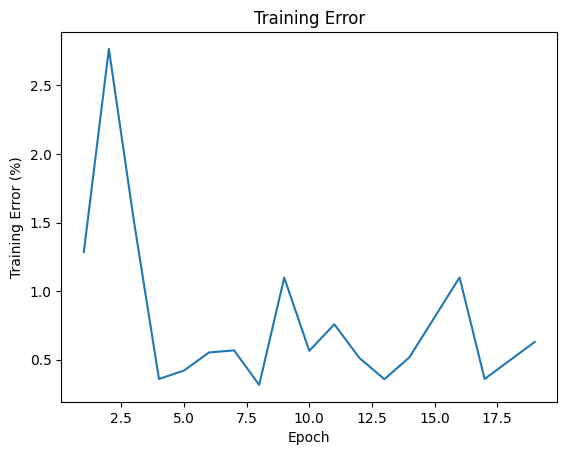

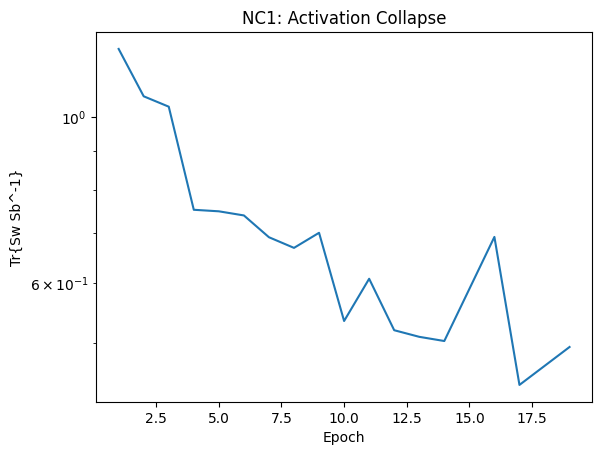

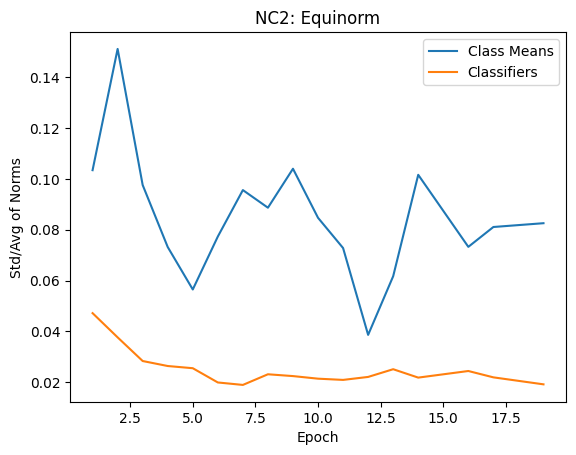

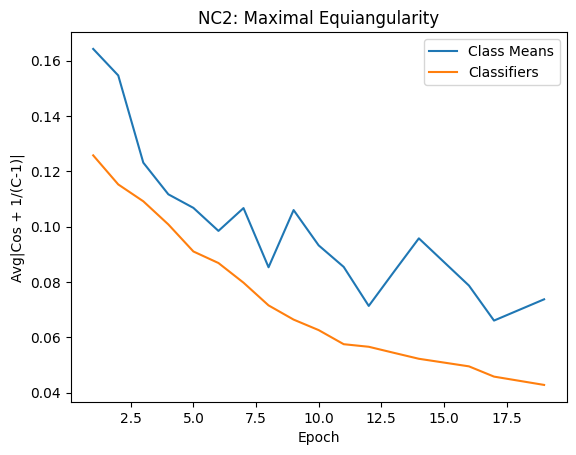

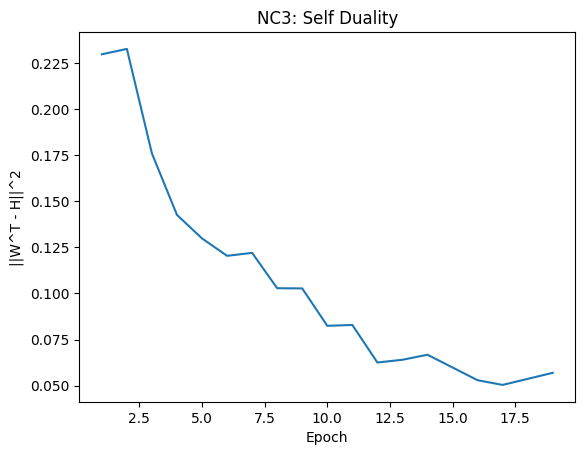

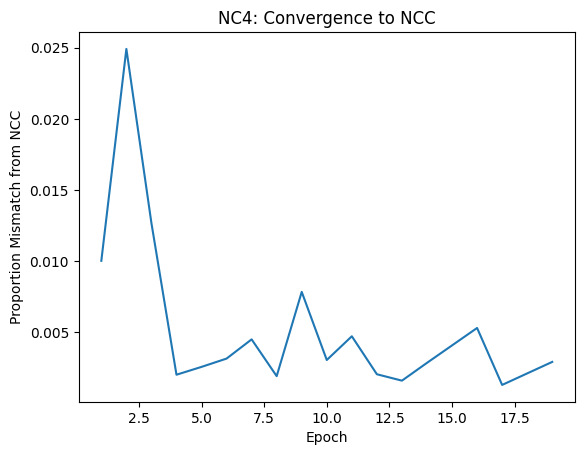

Train		Epoch: 20 [468/469 (100%)] 	Batch Loss: 0.012219 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.81it/s]
Analysis Cov	Epoch: 20 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.33it/s]


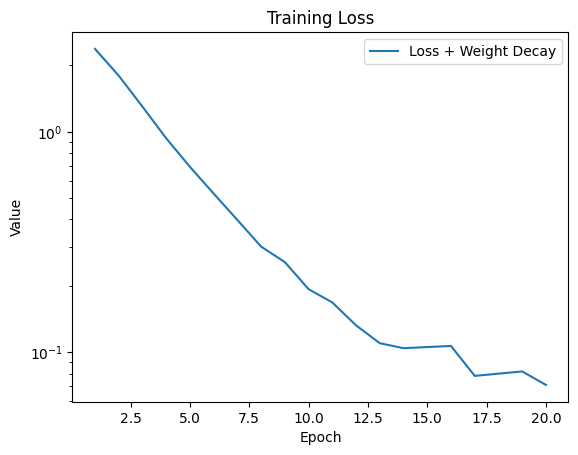

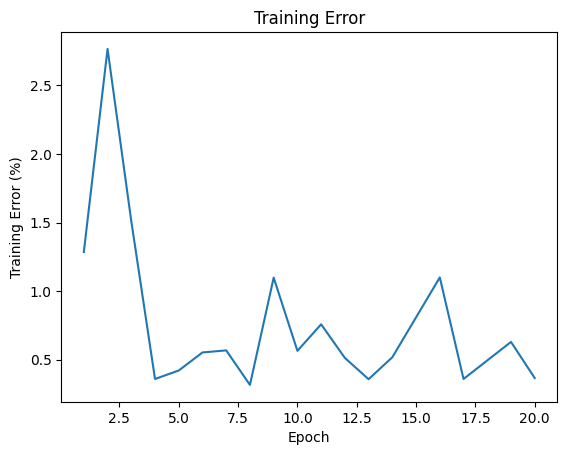

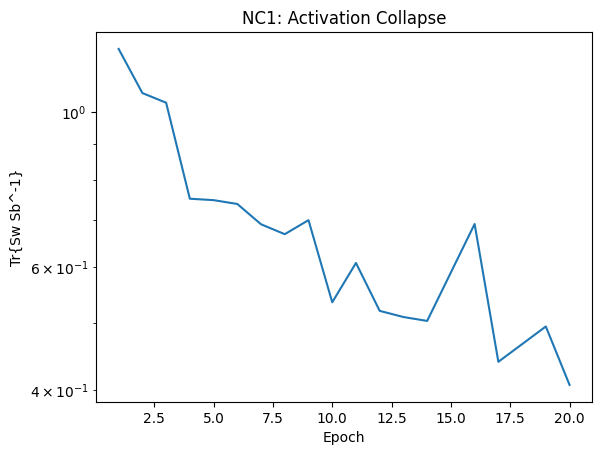

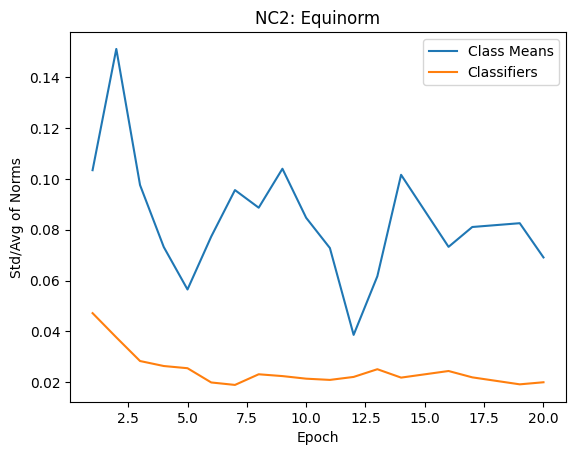

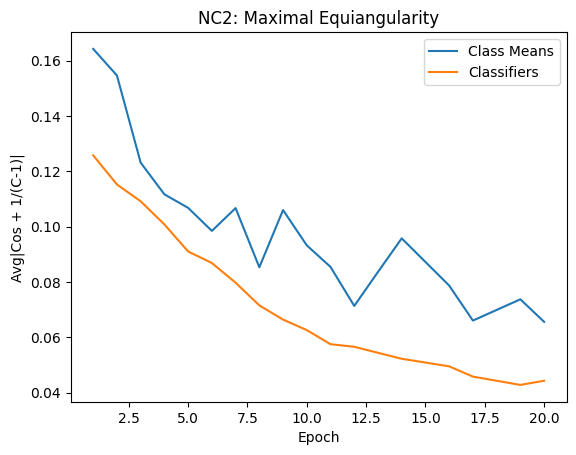

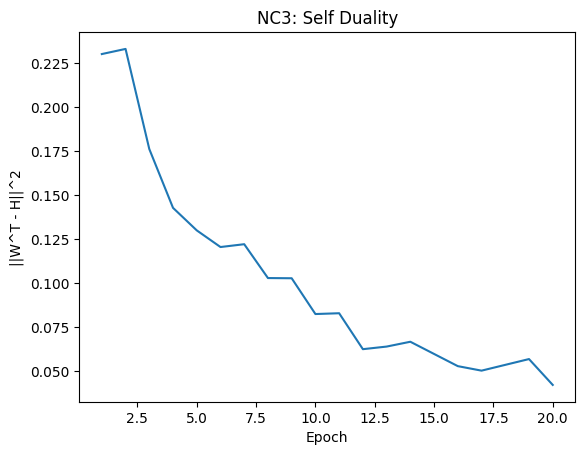

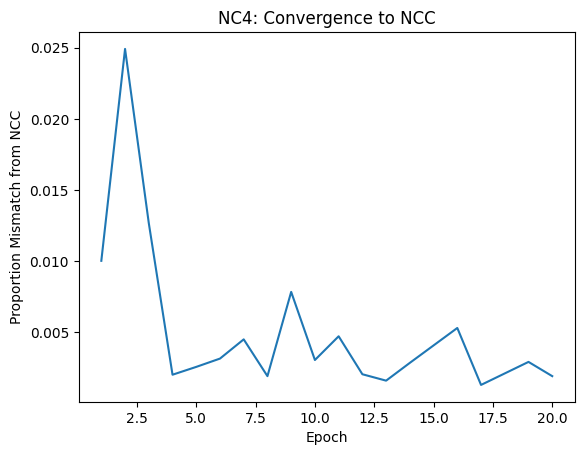

Train		Epoch: 21 [468/469 (100%)] 	Batch Loss: 0.011237 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Train		Epoch: 22 [468/469 (100%)] 	Batch Loss: 0.039409 	Batch Accuracy: 0.984375: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Analysis Cov	Epoch: 22 [469/469 (100%)]: 100%|██████████| 469/469 [00:31<00:00, 15.08it/s]


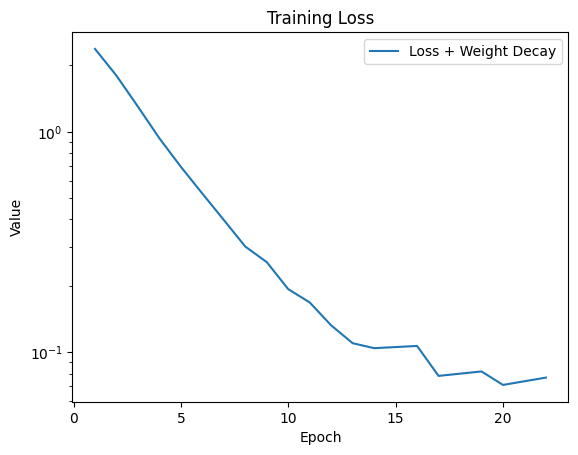

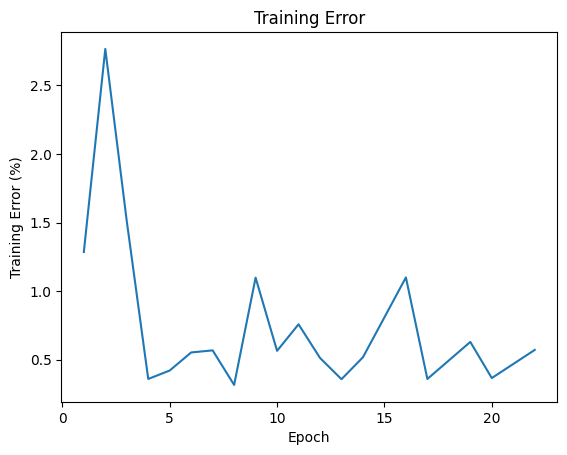

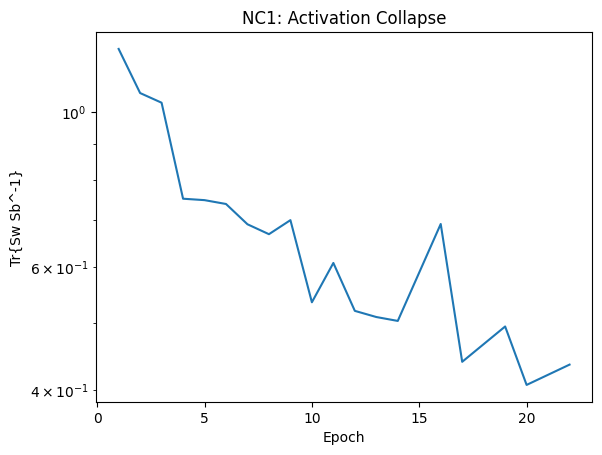

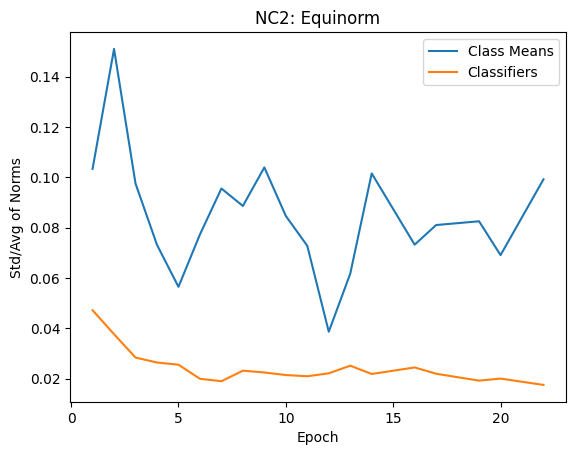

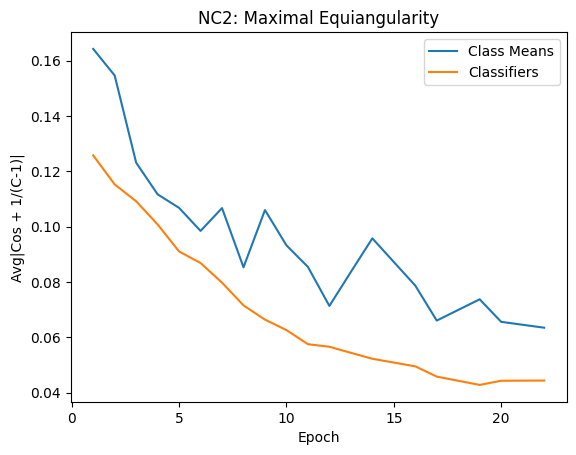

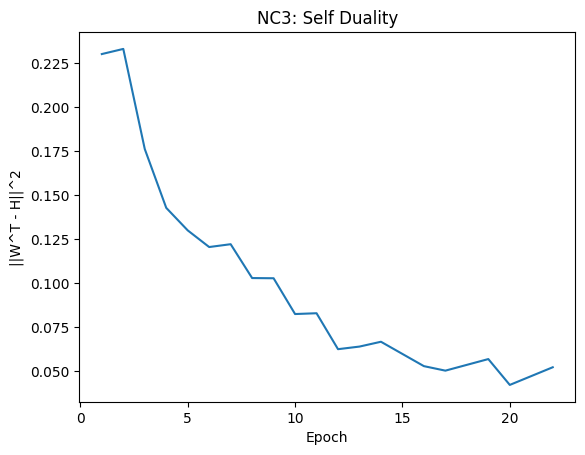

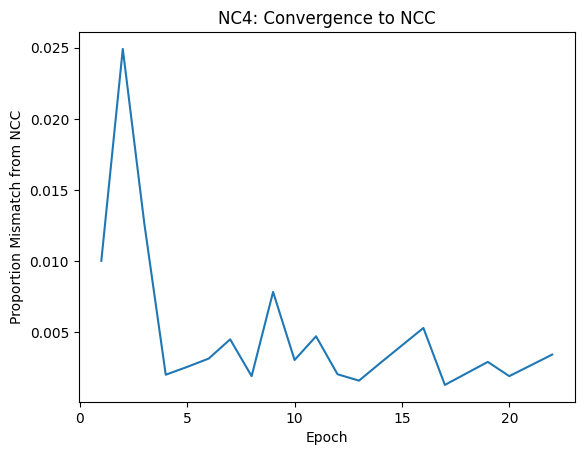

Train		Epoch: 23 [468/469 (100%)] 	Batch Loss: 0.003492 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Train		Epoch: 24 [468/469 (100%)] 	Batch Loss: 0.002823 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.80it/s]
Analysis Cov	Epoch: 24 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.25it/s]


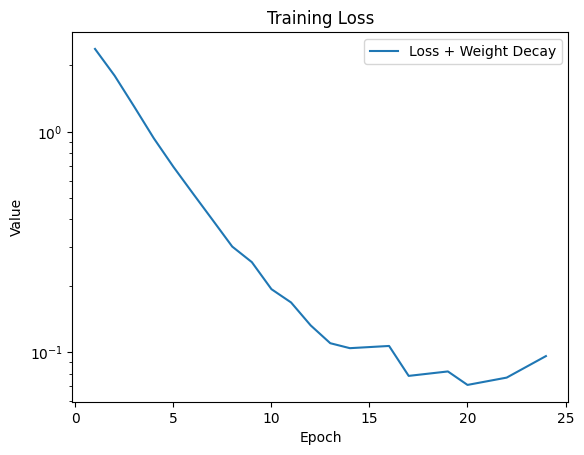

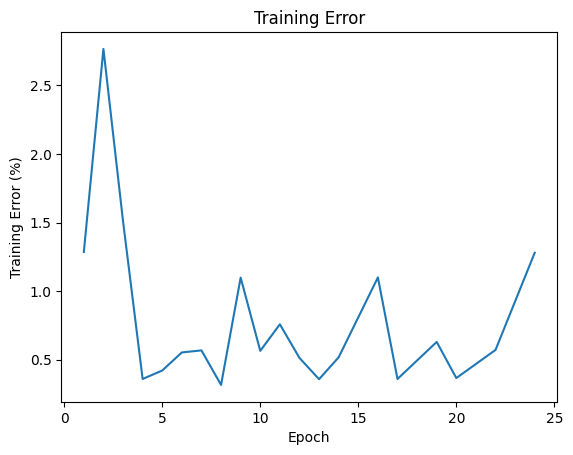

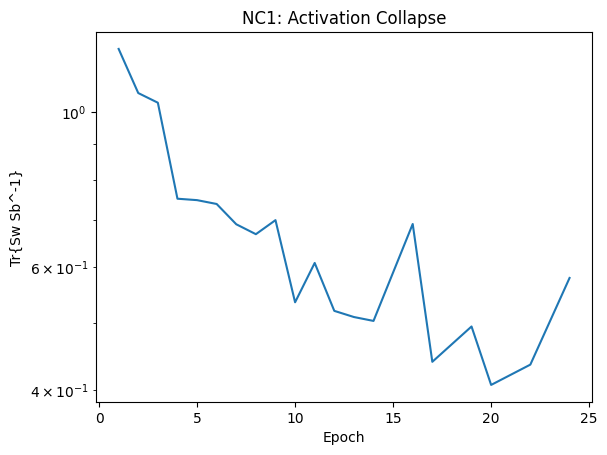

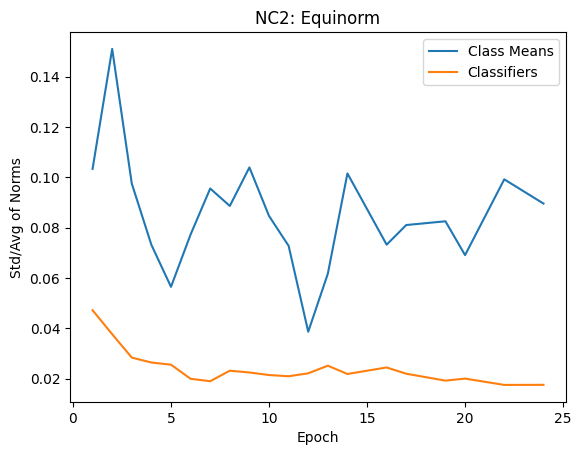

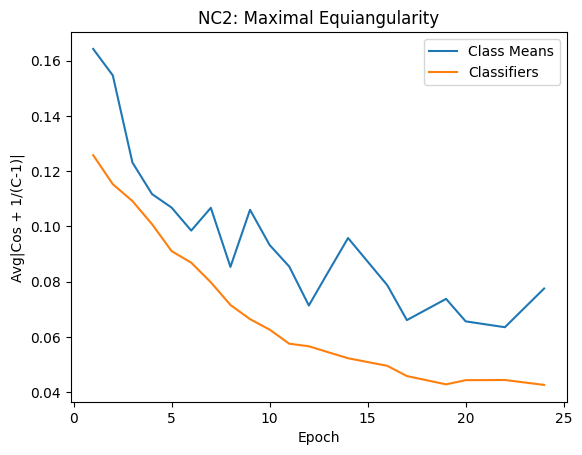

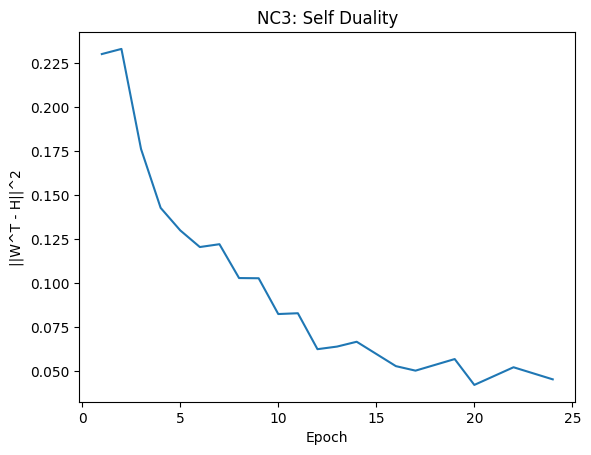

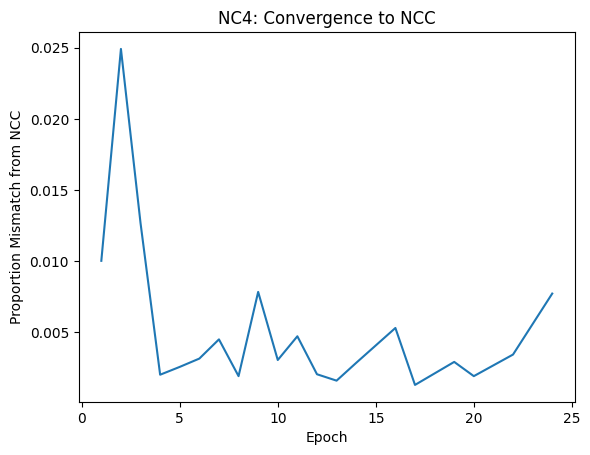

Train		Epoch: 25 [468/469 (100%)] 	Batch Loss: 0.032416 	Batch Accuracy: 0.984375: 100%|█████████▉| 468/469 [00:43<00:00, 10.81it/s]
Train		Epoch: 26 [468/469 (100%)] 	Batch Loss: 0.029187 	Batch Accuracy: 0.976562: 100%|█████████▉| 468/469 [00:43<00:00, 10.81it/s]
Train		Epoch: 27 [468/469 (100%)] 	Batch Loss: 0.019127 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.79it/s]
Analysis Cov	Epoch: 27 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.26it/s]


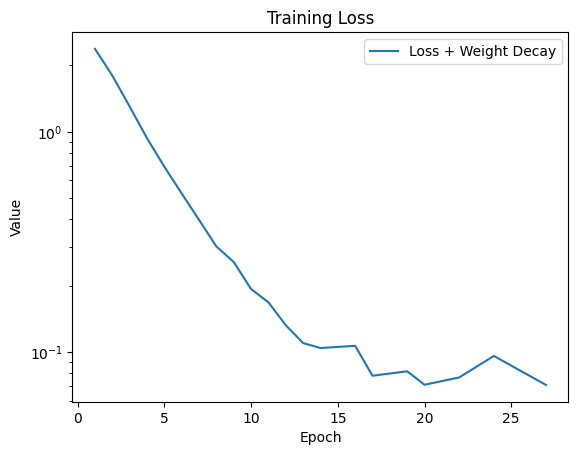

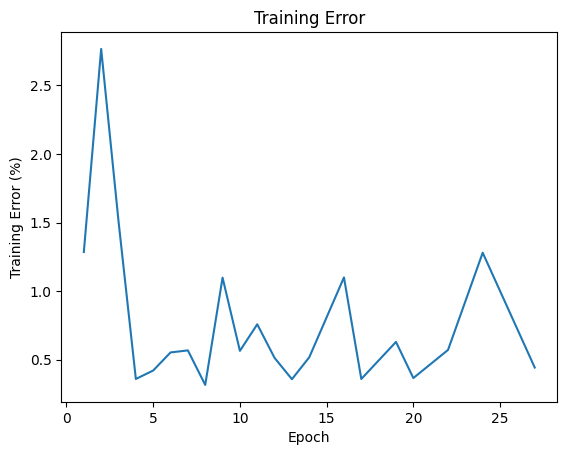

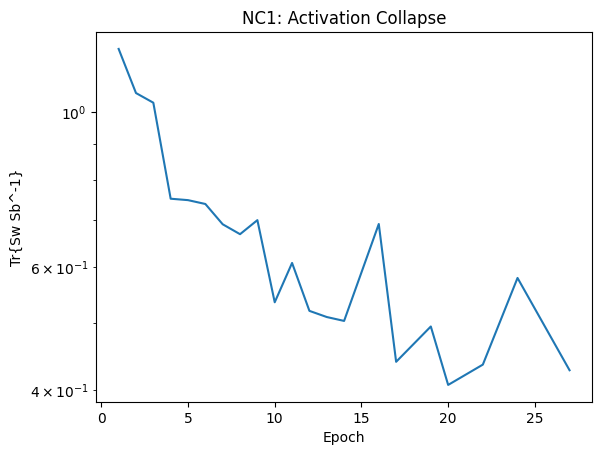

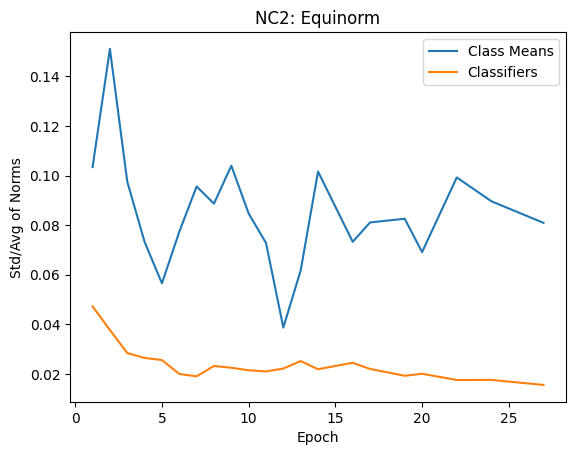

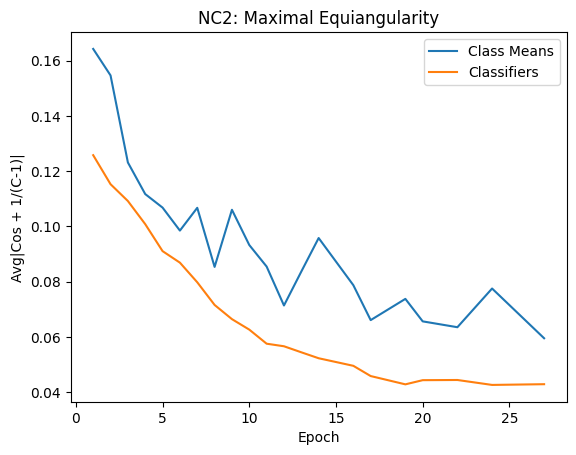

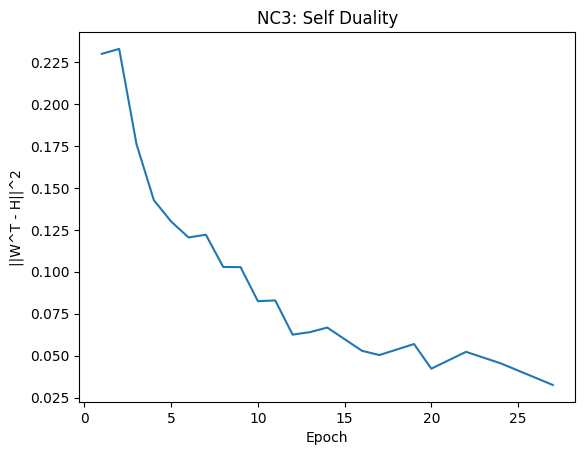

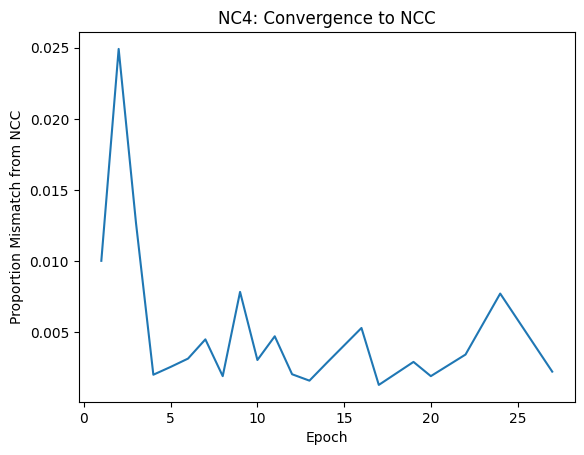

Train		Epoch: 28 [468/469 (100%)] 	Batch Loss: 0.003197 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.74it/s]
Train		Epoch: 29 [468/469 (100%)] 	Batch Loss: 0.036666 	Batch Accuracy: 0.984375: 100%|█████████▉| 468/469 [00:43<00:00, 10.73it/s]
Analysis Cov	Epoch: 29 [469/469 (100%)]: 100%|██████████| 469/469 [00:31<00:00, 15.12it/s]


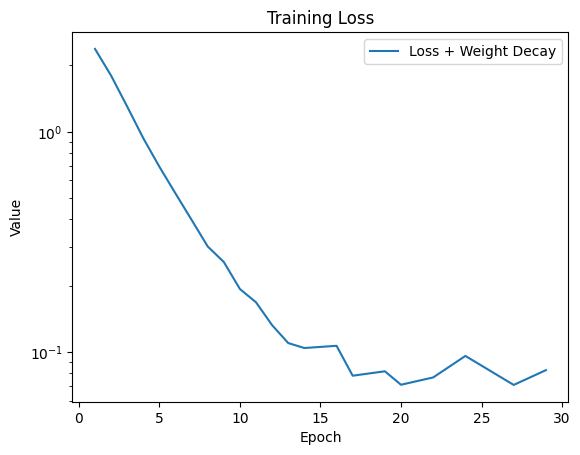

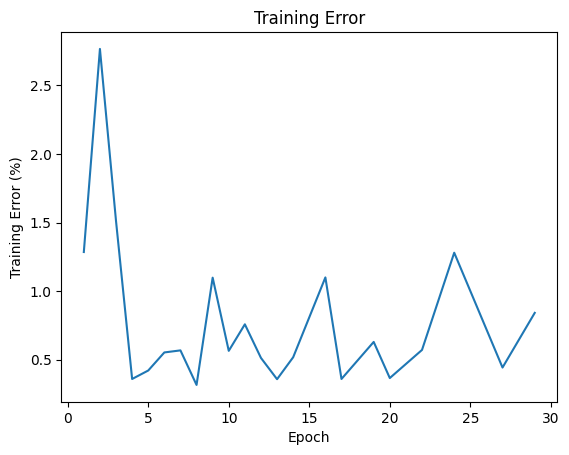

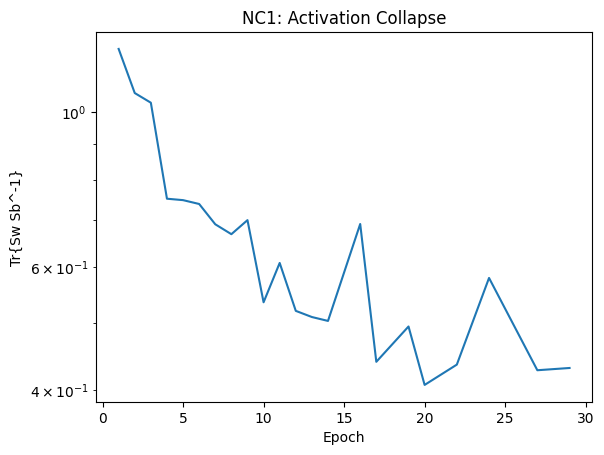

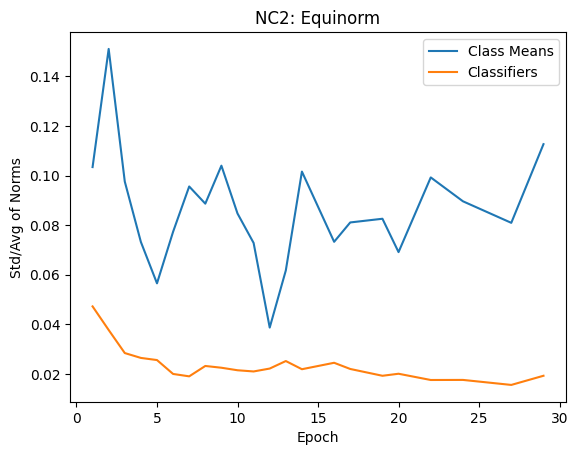

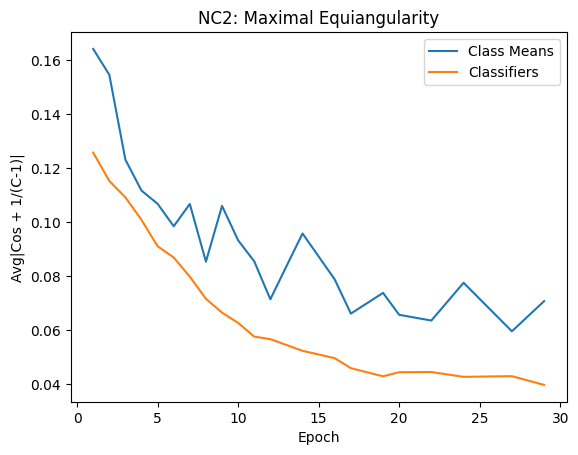

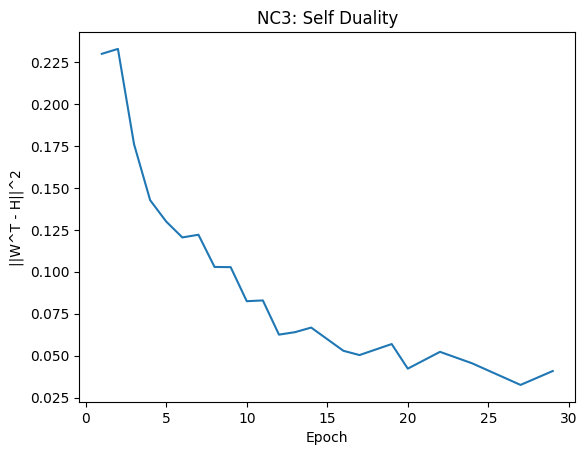

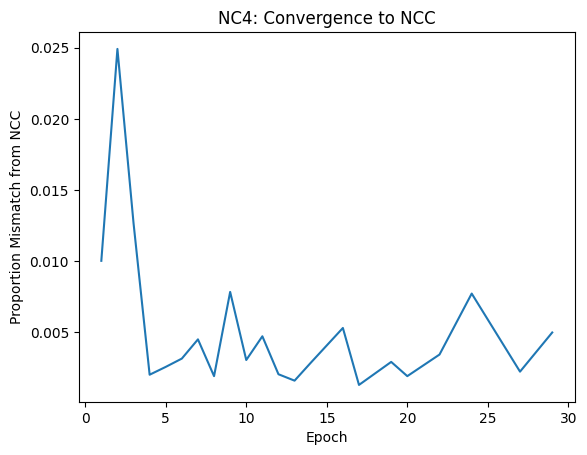

Train		Epoch: 30 [468/469 (100%)] 	Batch Loss: 0.008463 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.78it/s]
Train		Epoch: 31 [468/469 (100%)] 	Batch Loss: 0.008859 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.79it/s]
Train		Epoch: 32 [468/469 (100%)] 	Batch Loss: 0.060526 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.80it/s]
Analysis Cov	Epoch: 32 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.25it/s]


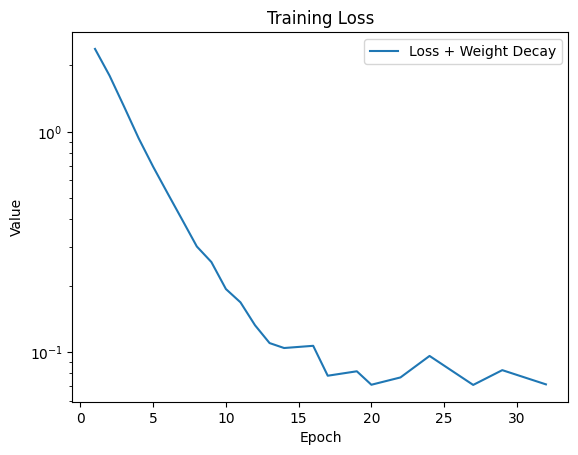

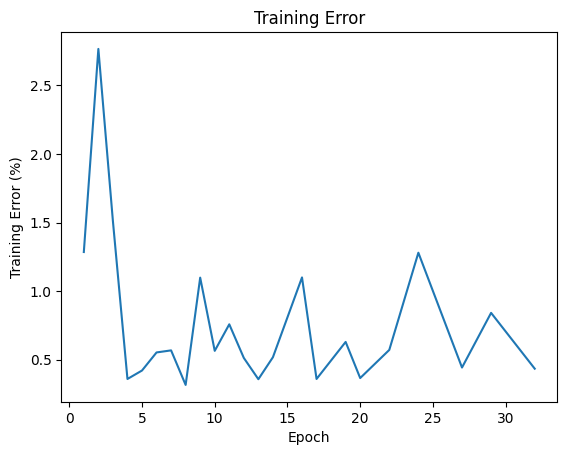

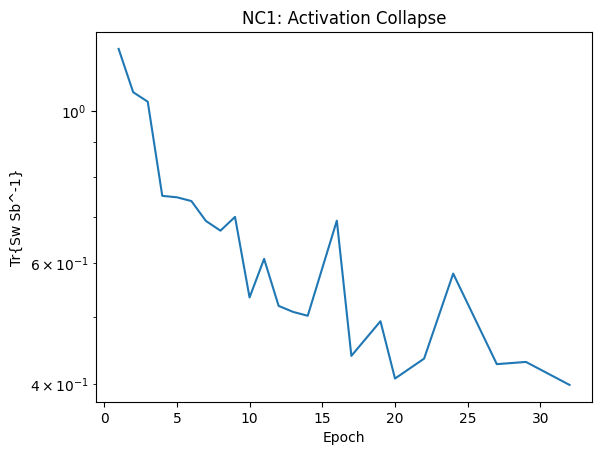

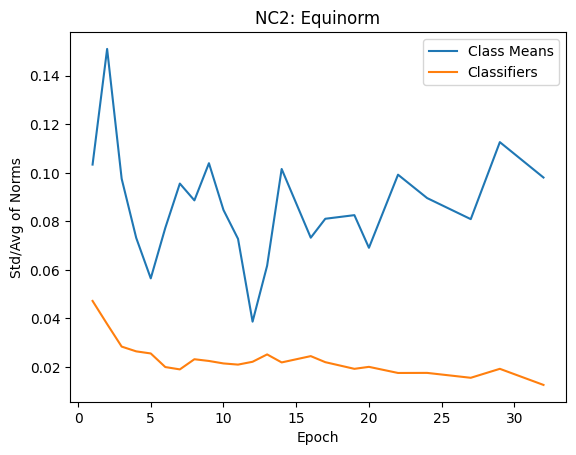

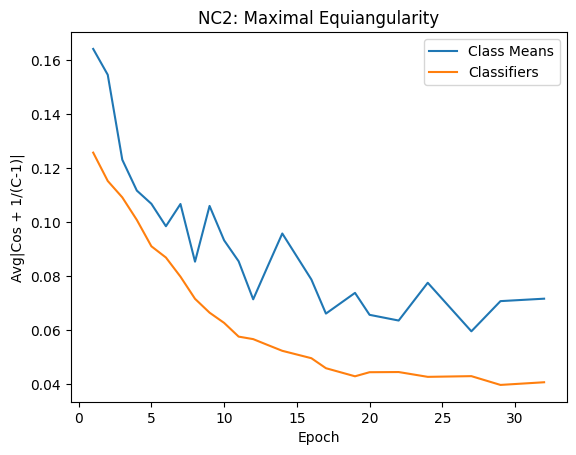

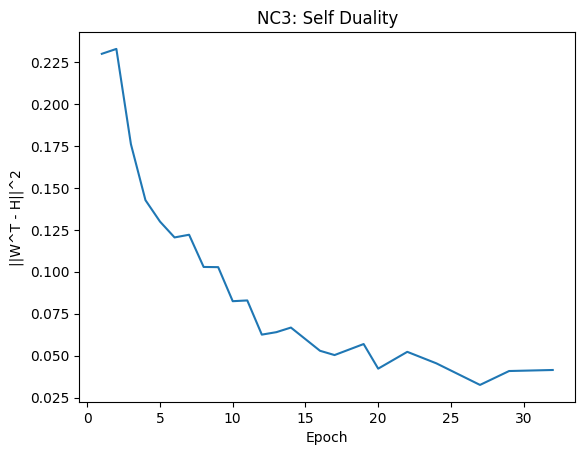

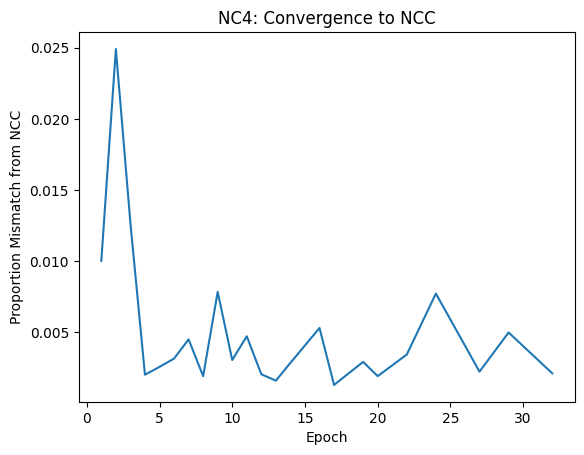

Train		Epoch: 33 [468/469 (100%)] 	Batch Loss: 0.018041 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.77it/s]
Train		Epoch: 34 [468/469 (100%)] 	Batch Loss: 0.025015 	Batch Accuracy: 0.984375: 100%|█████████▉| 468/469 [00:43<00:00, 10.74it/s]
Train		Epoch: 35 [468/469 (100%)] 	Batch Loss: 0.027830 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.79it/s]
Analysis Cov	Epoch: 35 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.27it/s]


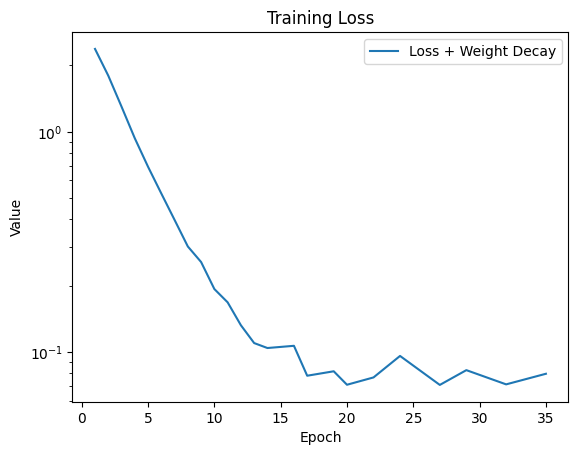

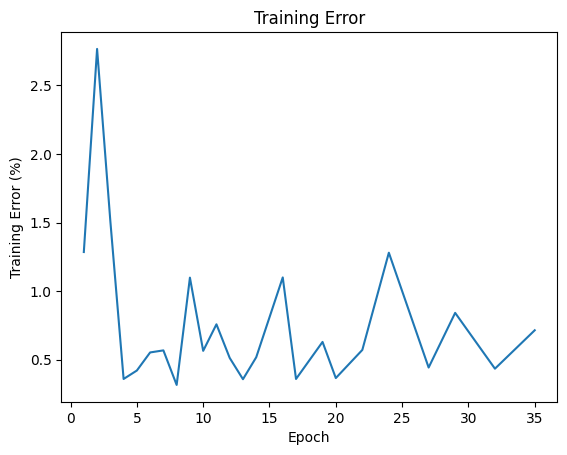

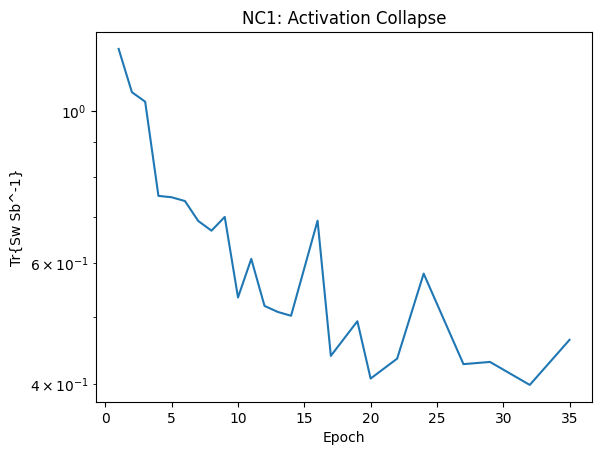

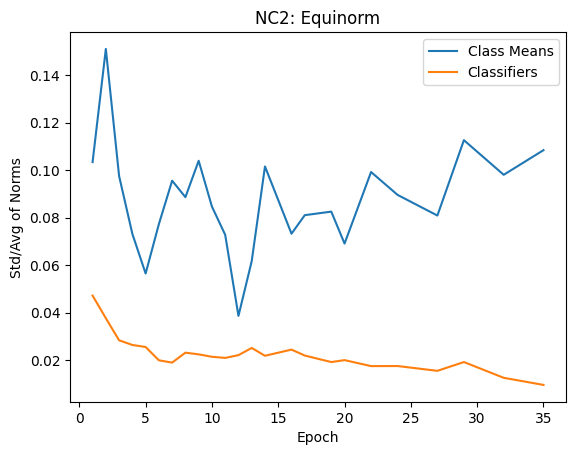

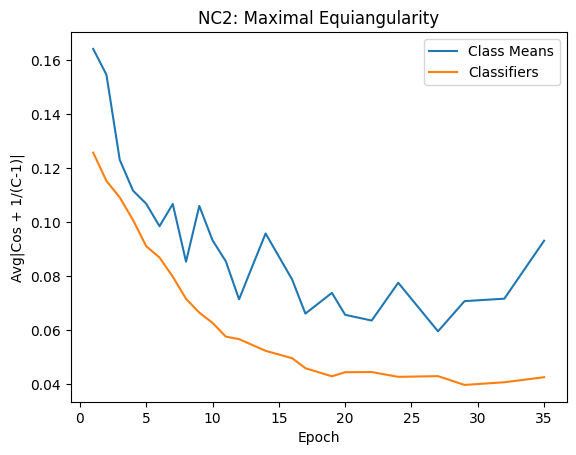

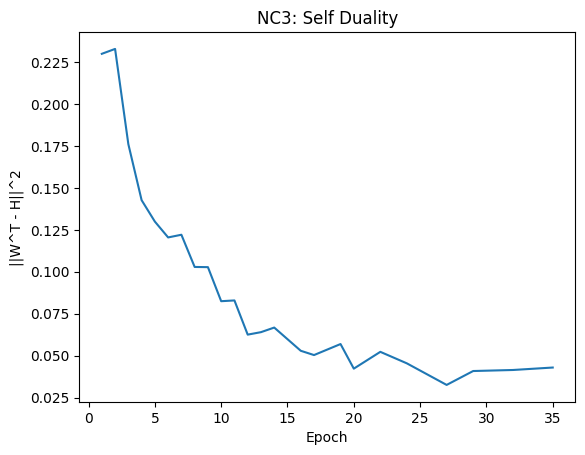

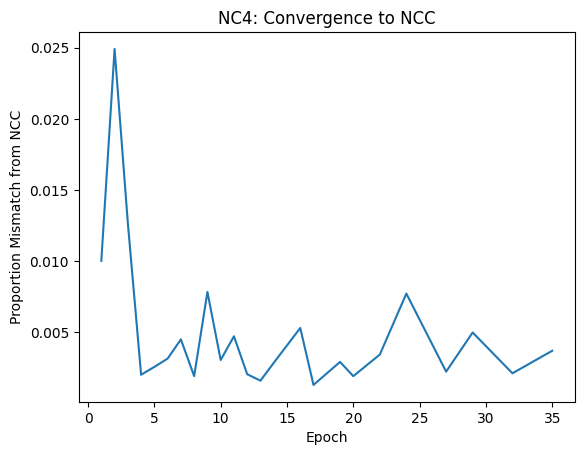

Train		Epoch: 36 [468/469 (100%)] 	Batch Loss: 0.022700 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.75it/s]
Train		Epoch: 37 [468/469 (100%)] 	Batch Loss: 0.005695 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.80it/s]
Train		Epoch: 38 [468/469 (100%)] 	Batch Loss: 0.012650 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.78it/s]
Analysis Cov	Epoch: 38 [469/469 (100%)]: 100%|██████████| 469/469 [00:31<00:00, 15.07it/s]


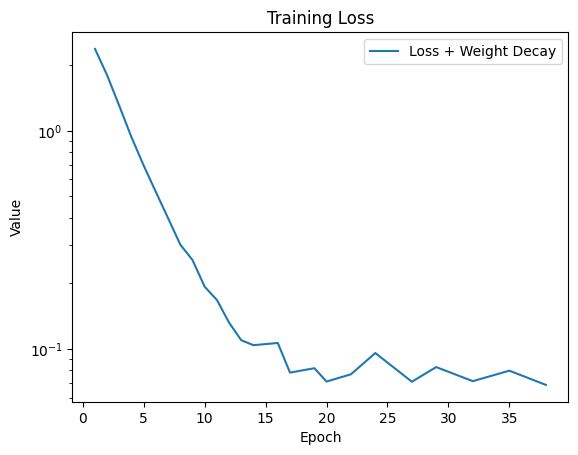

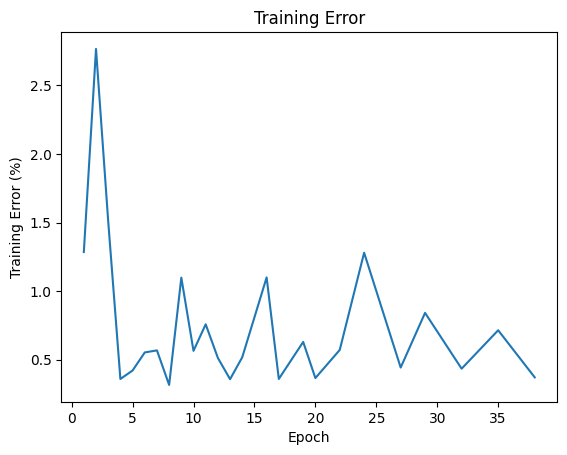

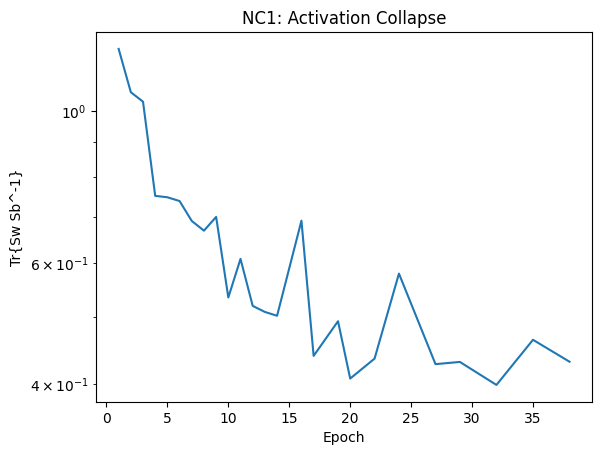

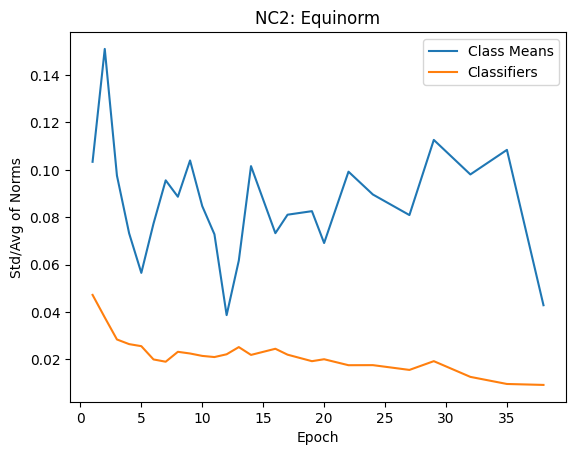

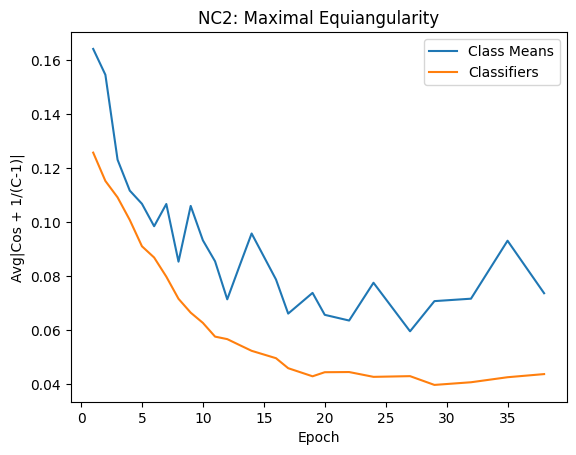

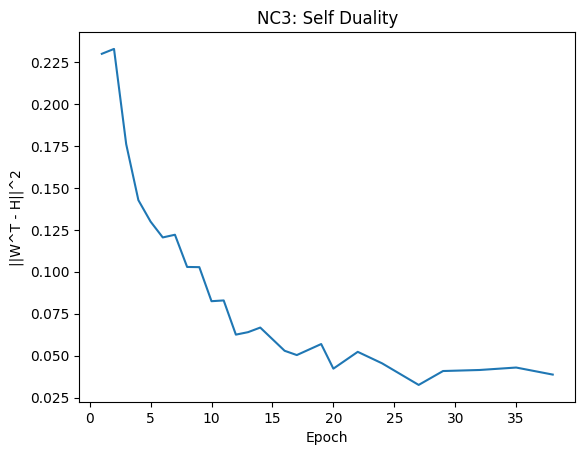

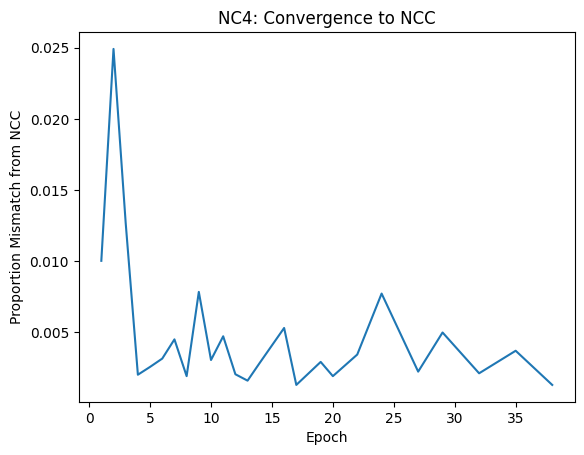

Train		Epoch: 39 [468/469 (100%)] 	Batch Loss: 0.002556 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.80it/s]
Train		Epoch: 40 [468/469 (100%)] 	Batch Loss: 0.005586 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.78it/s]
Train		Epoch: 41 [468/469 (100%)] 	Batch Loss: 0.015874 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.84it/s]
Train		Epoch: 42 [468/469 (100%)] 	Batch Loss: 0.022462 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.79it/s]
Analysis Cov	Epoch: 42 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.30it/s]


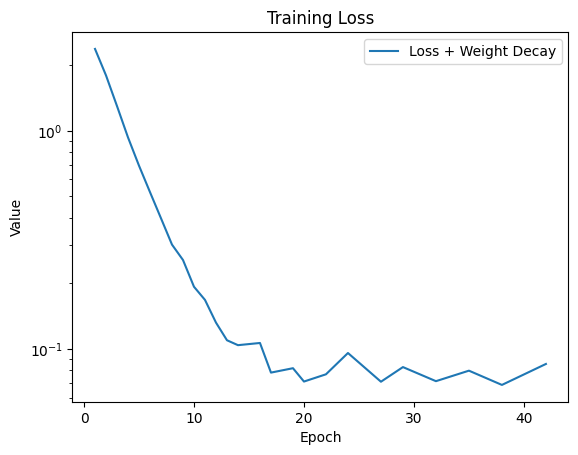

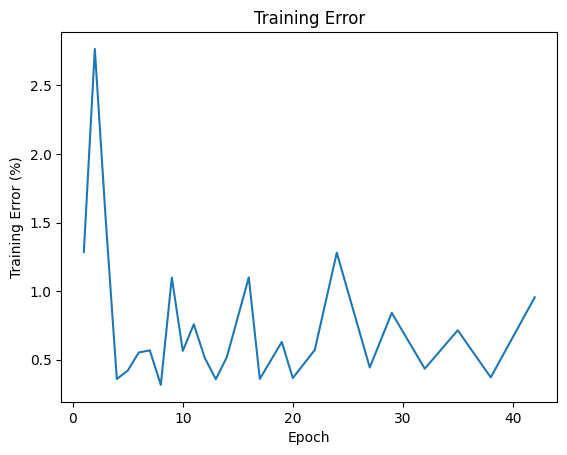

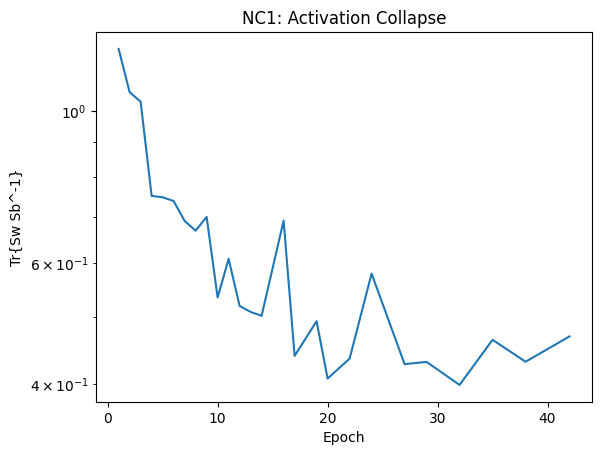

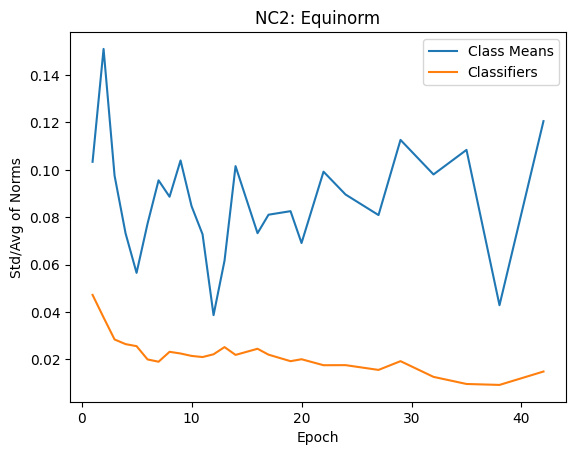

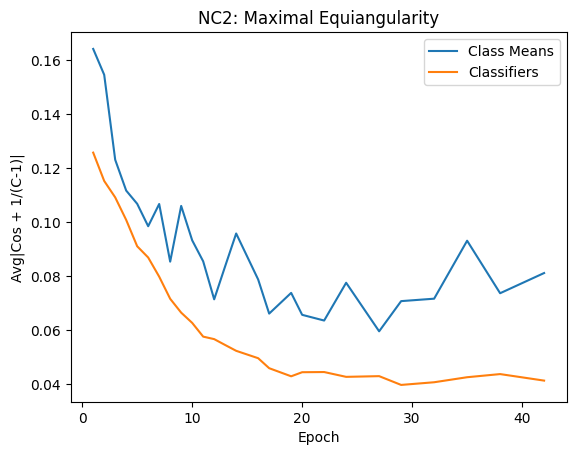

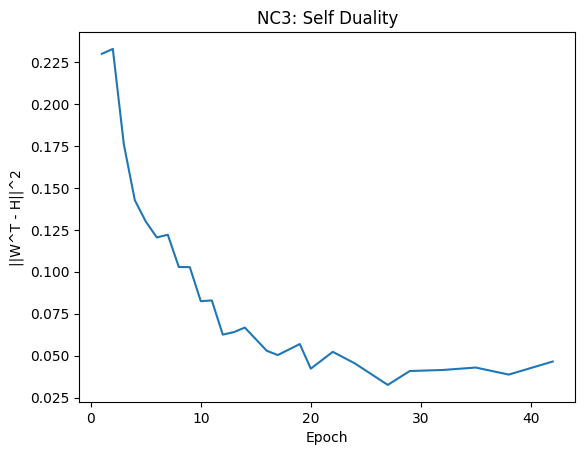

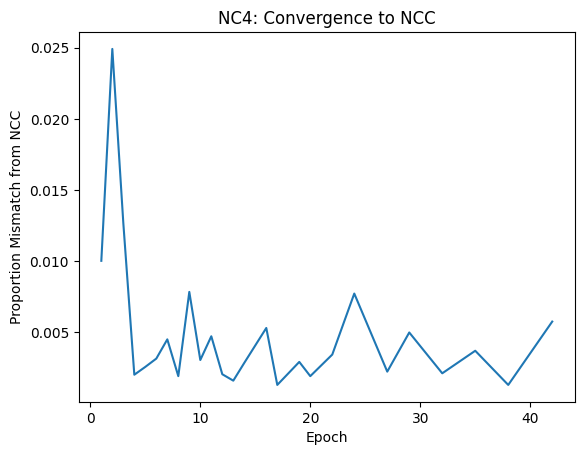

Train		Epoch: 43 [468/469 (100%)] 	Batch Loss: 0.004184 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.67it/s]
Train		Epoch: 44 [468/469 (100%)] 	Batch Loss: 0.002239 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Train		Epoch: 45 [468/469 (100%)] 	Batch Loss: 0.006267 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.79it/s]
Analysis Cov	Epoch: 45 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.25it/s]


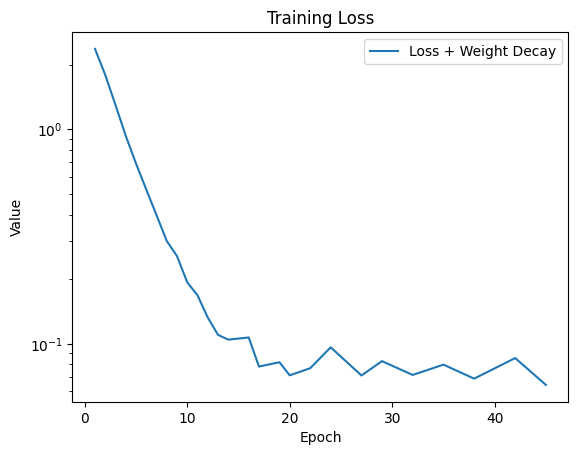

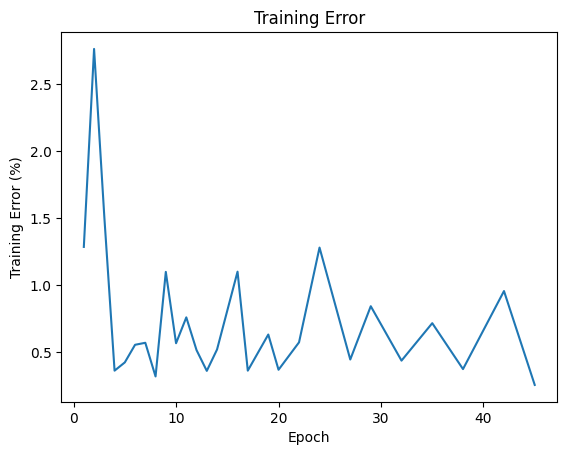

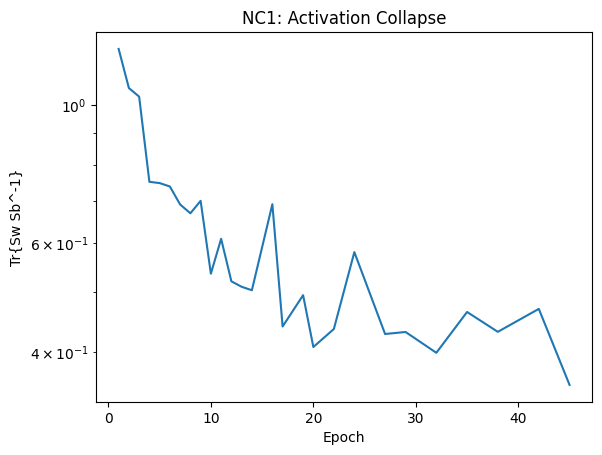

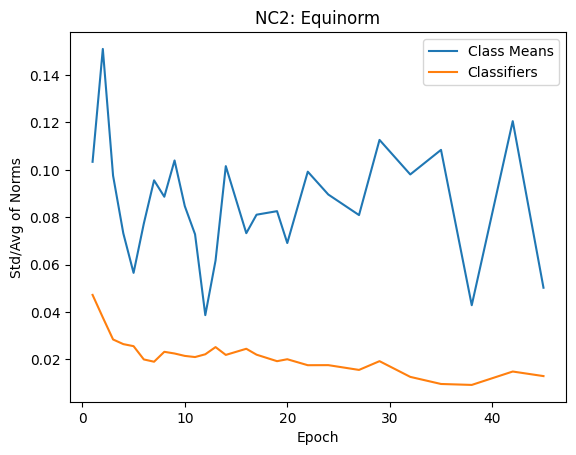

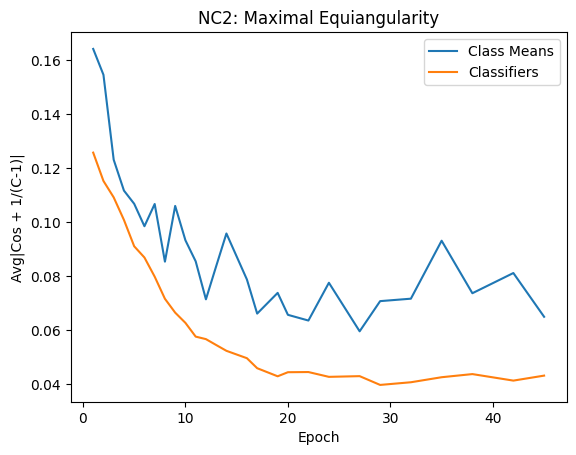

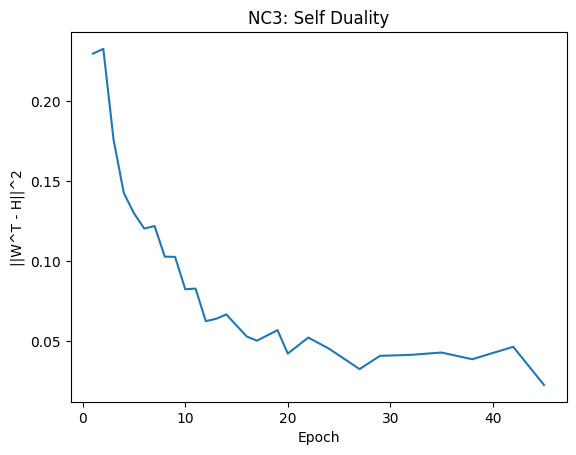

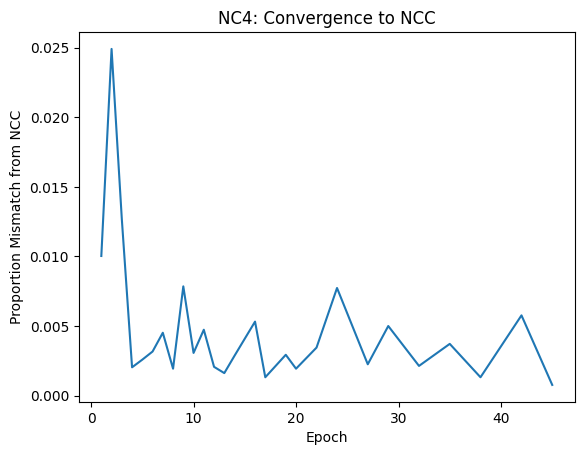

Train		Epoch: 46 [468/469 (100%)] 	Batch Loss: 0.046382 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.79it/s]
Train		Epoch: 47 [468/469 (100%)] 	Batch Loss: 0.006350 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.72it/s]
Train		Epoch: 48 [468/469 (100%)] 	Batch Loss: 0.056609 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.81it/s]
Train		Epoch: 49 [468/469 (100%)] 	Batch Loss: 0.008743 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Train		Epoch: 50 [468/469 (100%)] 	Batch Loss: 0.004398 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.75it/s]
Analysis Cov	Epoch: 50 [469/469 (100%)]: 100%|██████████| 469/469 [00:31<00:00, 15.10it/s]


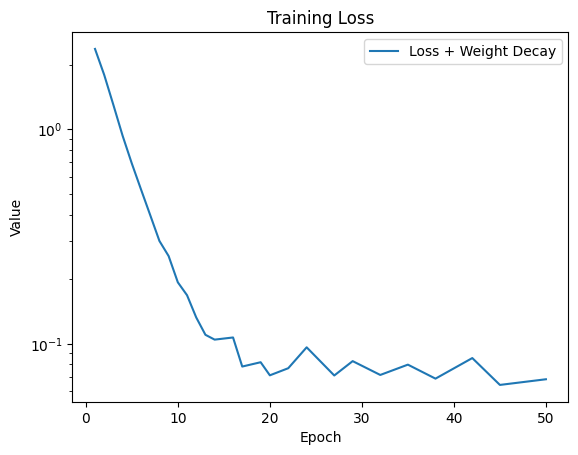

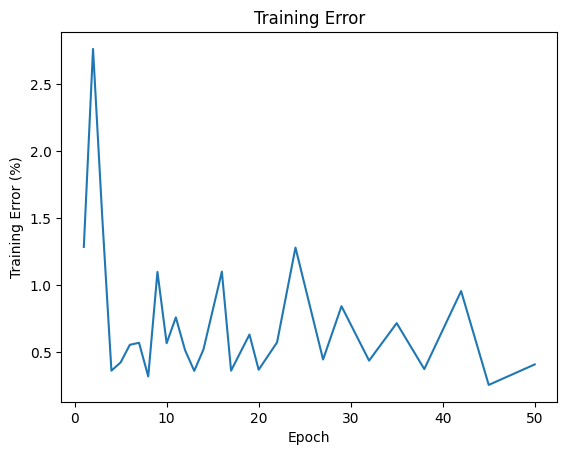

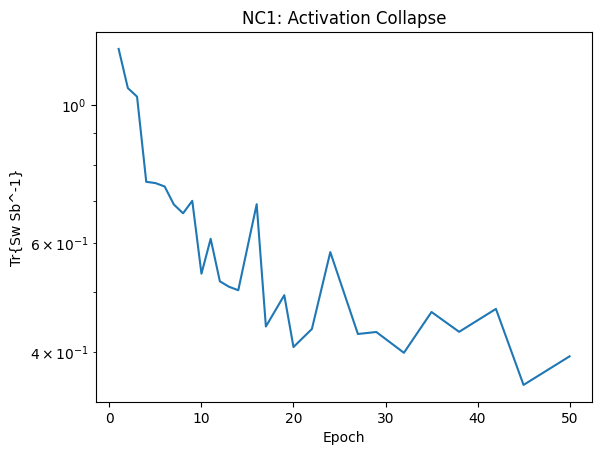

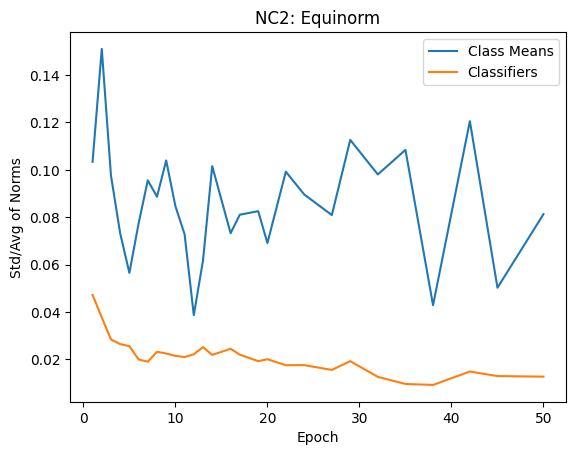

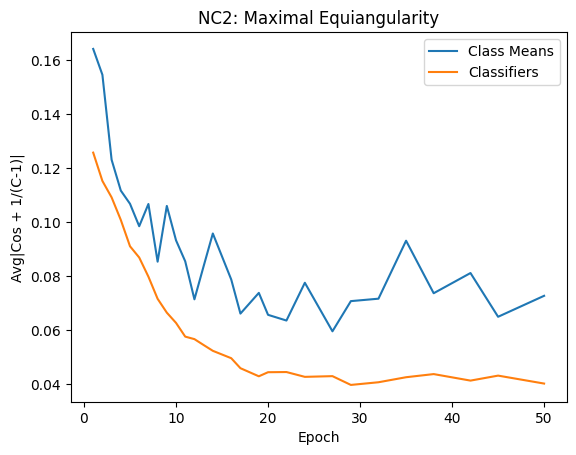

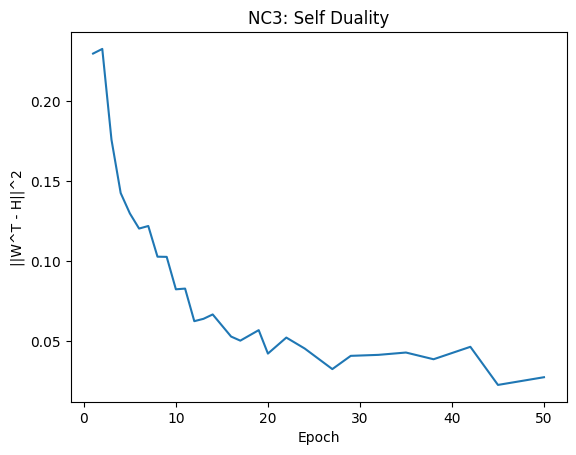

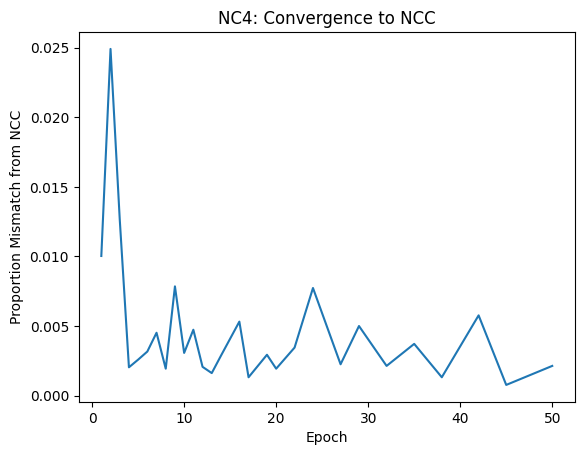

Train		Epoch: 51 [468/469 (100%)] 	Batch Loss: 0.005944 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.69it/s]
Train		Epoch: 52 [468/469 (100%)] 	Batch Loss: 0.038787 	Batch Accuracy: 0.984375: 100%|█████████▉| 468/469 [00:43<00:00, 10.70it/s]
Train		Epoch: 53 [468/469 (100%)] 	Batch Loss: 0.008453 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.69it/s]
Train		Epoch: 54 [468/469 (100%)] 	Batch Loss: 0.008650 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.68it/s]
Analysis Cov	Epoch: 54 [469/469 (100%)]: 100%|██████████| 469/469 [00:31<00:00, 15.08it/s]


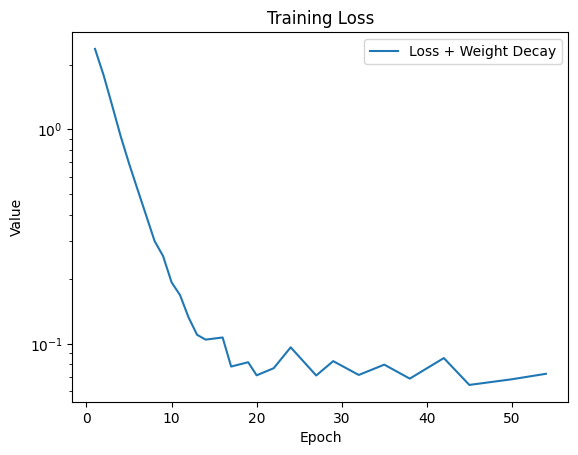

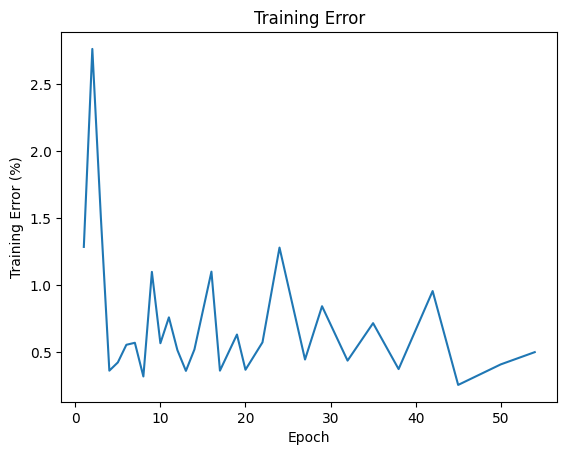

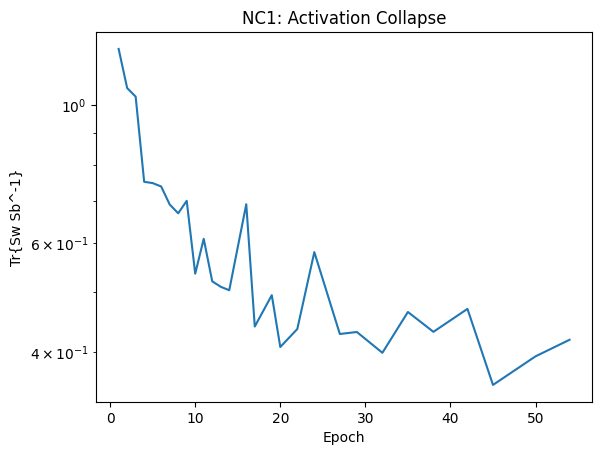

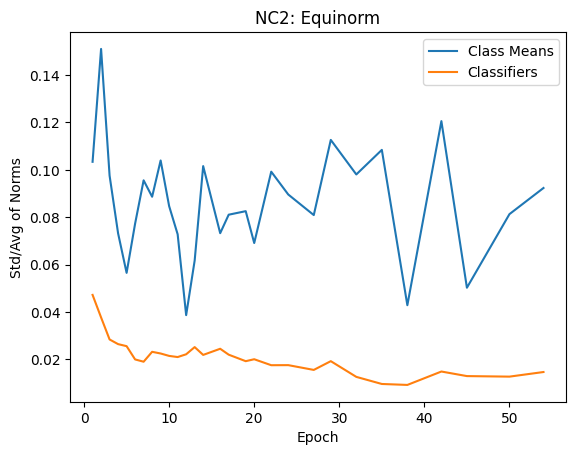

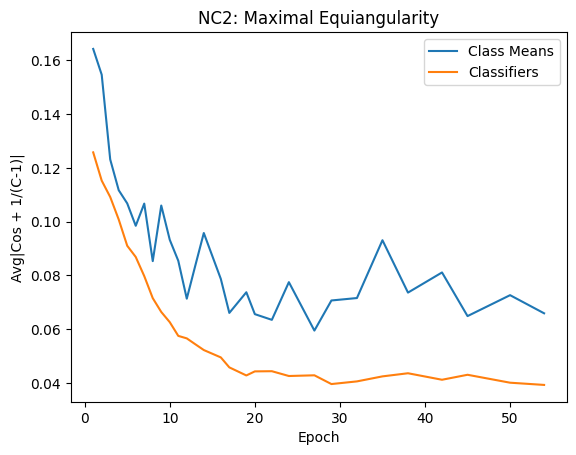

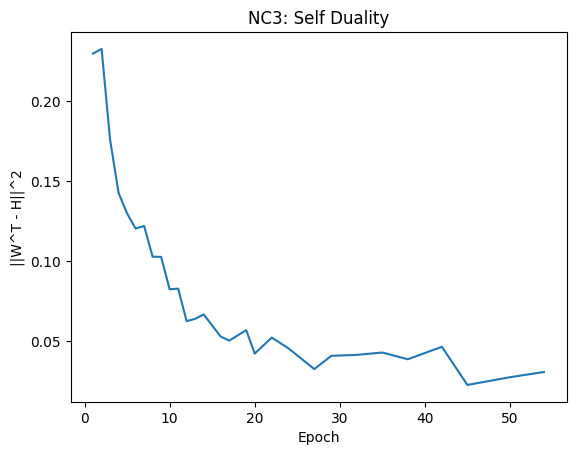

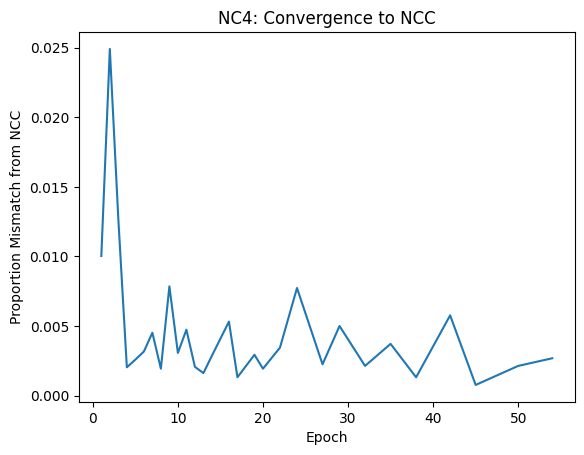

Train		Epoch: 55 [468/469 (100%)] 	Batch Loss: 0.003305 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.71it/s]
Train		Epoch: 56 [468/469 (100%)] 	Batch Loss: 0.053243 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.72it/s]
Train		Epoch: 57 [468/469 (100%)] 	Batch Loss: 0.029022 	Batch Accuracy: 0.984375: 100%|█████████▉| 468/469 [00:43<00:00, 10.75it/s]
Train		Epoch: 58 [468/469 (100%)] 	Batch Loss: 0.020835 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.77it/s]
Train		Epoch: 59 [468/469 (100%)] 	Batch Loss: 0.002078 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Analysis Cov	Epoch: 59 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.17it/s]


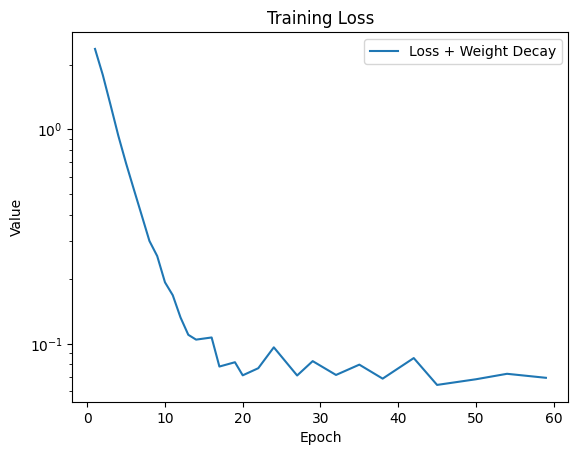

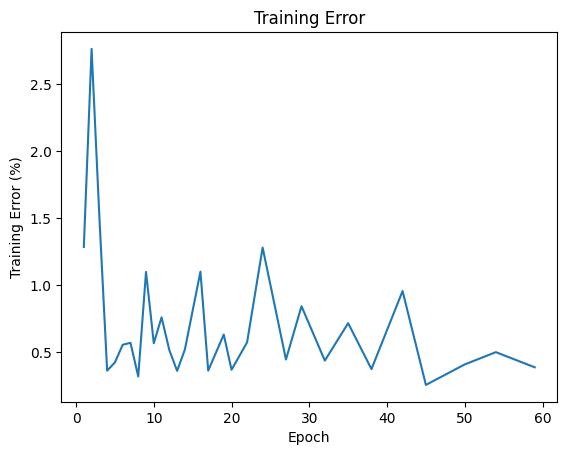

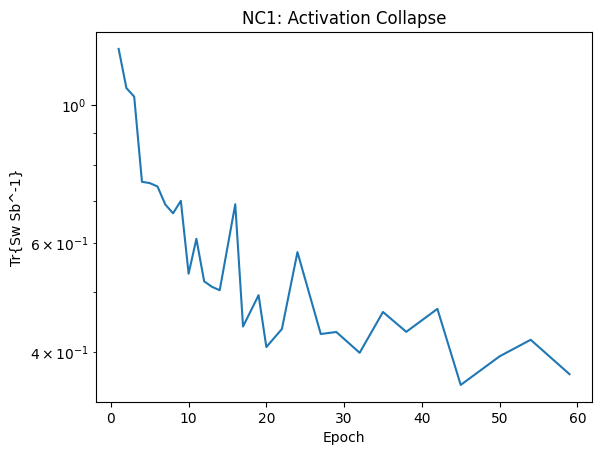

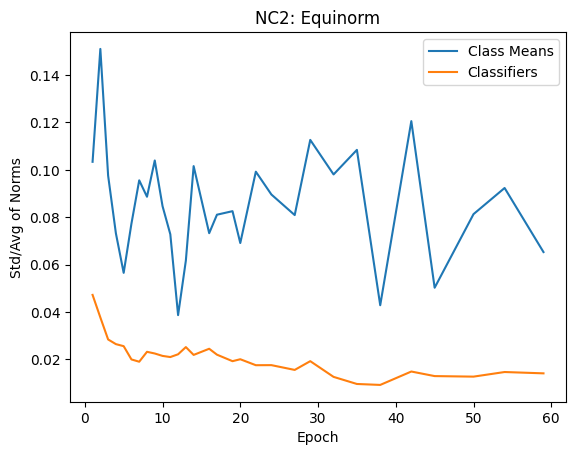

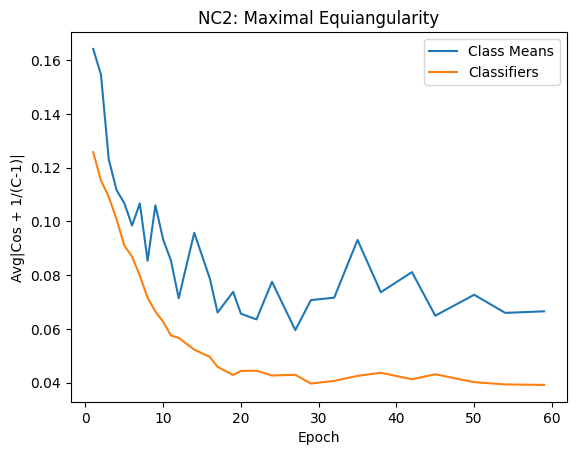

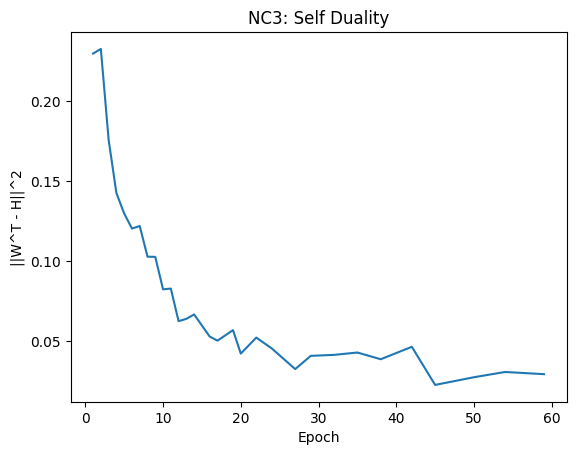

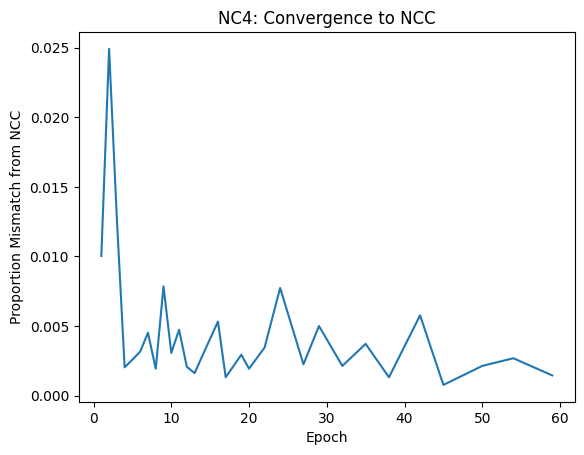

Train		Epoch: 60 [468/469 (100%)] 	Batch Loss: 0.023318 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.79it/s]
Train		Epoch: 61 [468/469 (100%)] 	Batch Loss: 0.002059 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.81it/s]
Train		Epoch: 62 [468/469 (100%)] 	Batch Loss: 0.002439 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.81it/s]
Train		Epoch: 63 [468/469 (100%)] 	Batch Loss: 0.010841 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.78it/s]
Train		Epoch: 64 [468/469 (100%)] 	Batch Loss: 0.002610 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.80it/s]
Train		Epoch: 65 [468/469 (100%)] 	Batch Loss: 0.002941 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.80it/s]
Analysis Cov	Epoch: 65 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.30it/s]


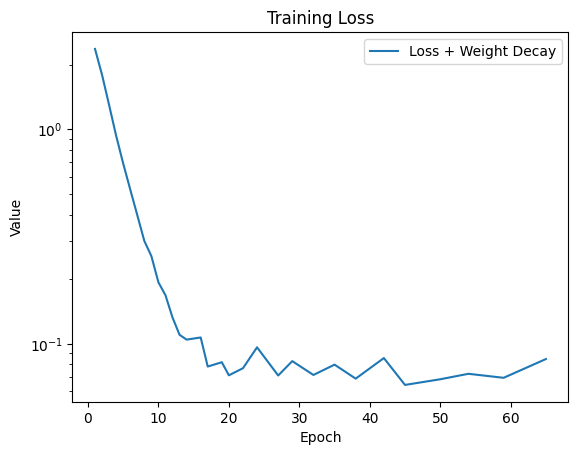

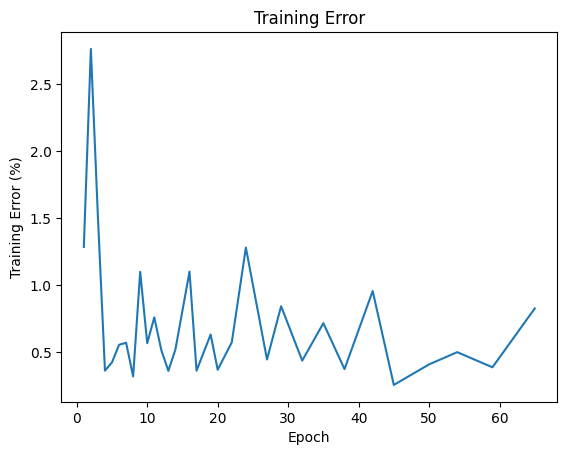

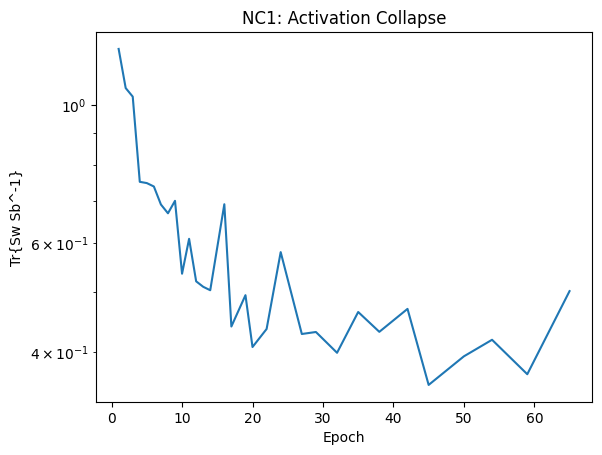

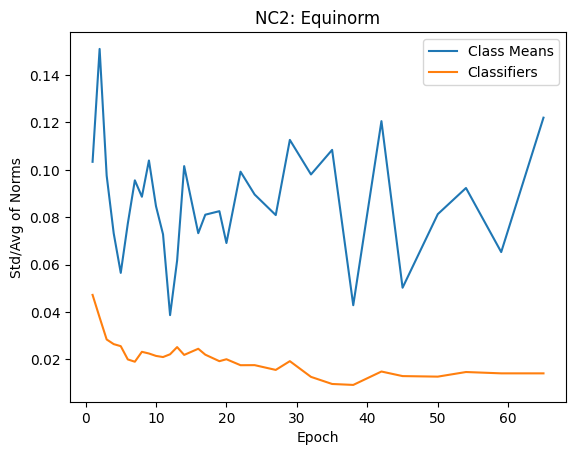

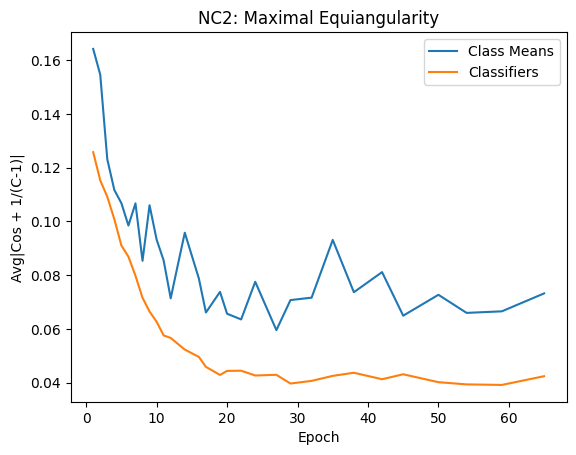

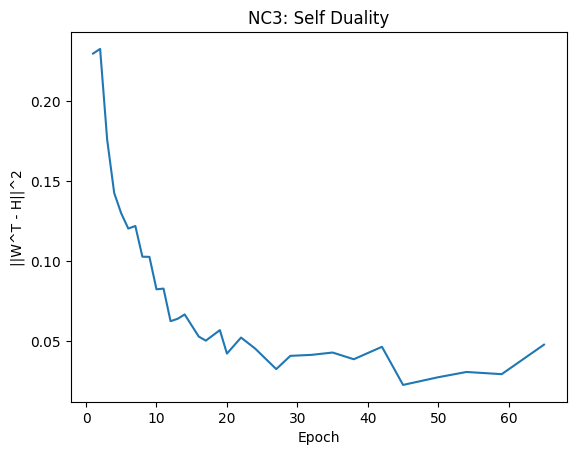

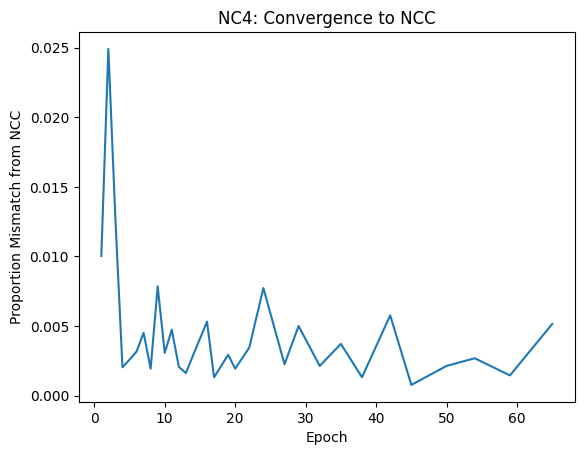

Train		Epoch: 66 [468/469 (100%)] 	Batch Loss: 0.005998 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.79it/s]
Train		Epoch: 67 [468/469 (100%)] 	Batch Loss: 0.064090 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.79it/s]
Train		Epoch: 68 [468/469 (100%)] 	Batch Loss: 0.007428 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.81it/s]
Train		Epoch: 69 [468/469 (100%)] 	Batch Loss: 0.010336 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.80it/s]
Train		Epoch: 70 [468/469 (100%)] 	Batch Loss: 0.004864 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.80it/s]
Train		Epoch: 71 [468/469 (100%)] 	Batch Loss: 0.007408 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.77it/s]
Analysis Cov	Epoch: 71 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.23it/s]


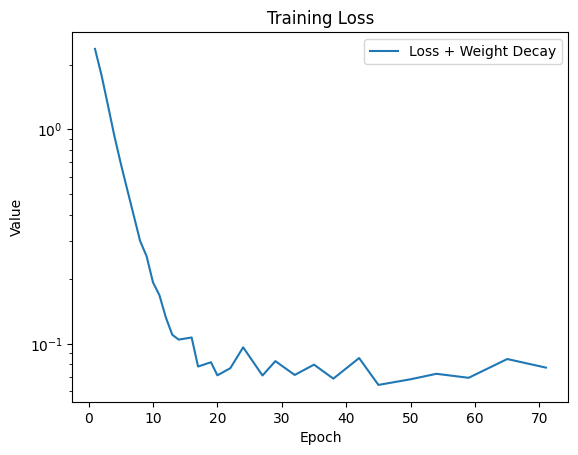

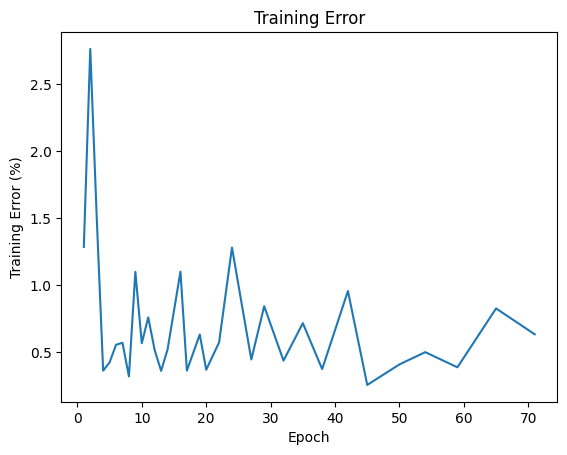

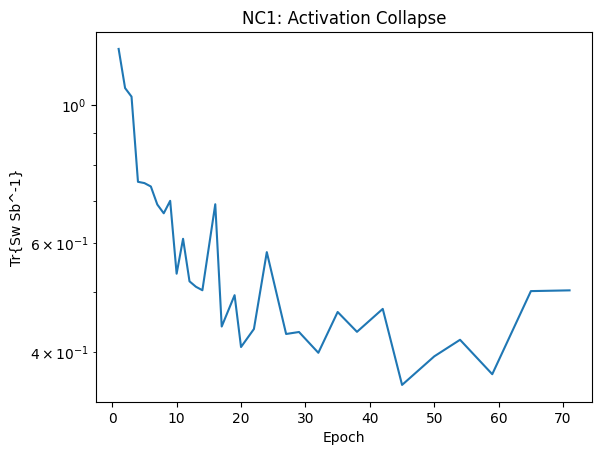

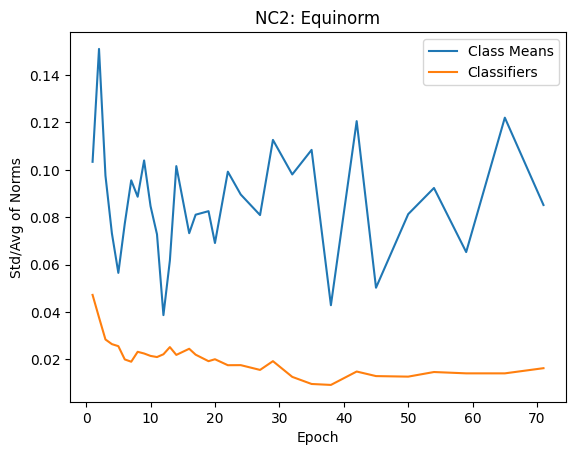

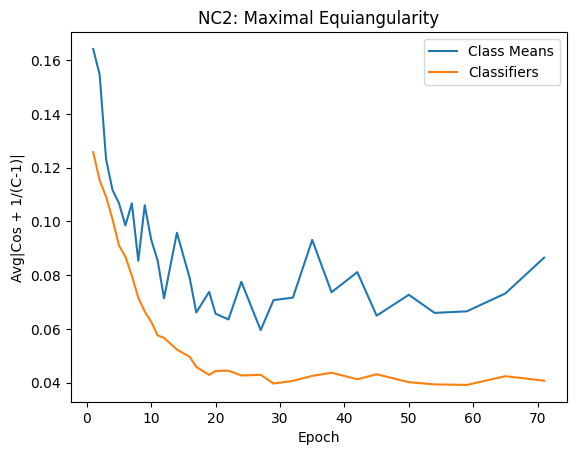

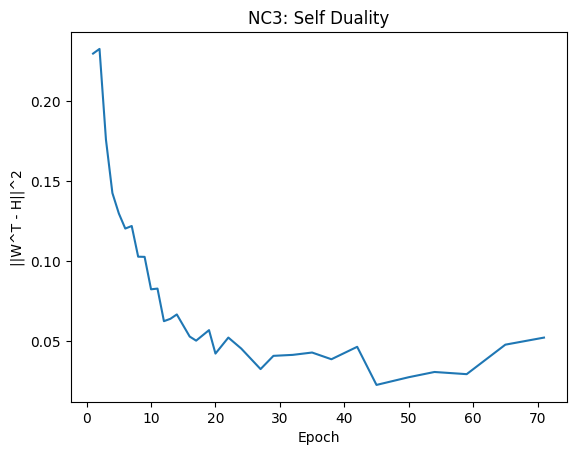

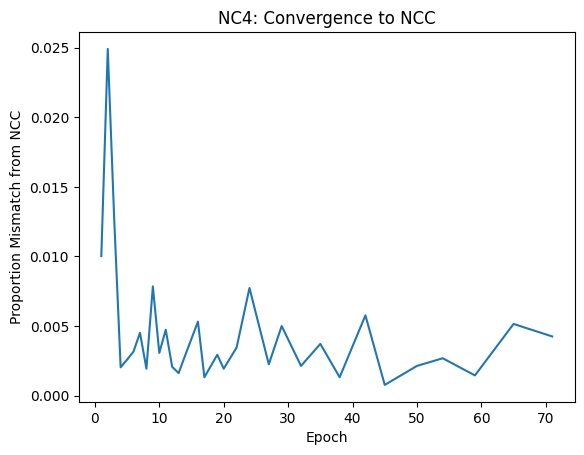

Train		Epoch: 72 [468/469 (100%)] 	Batch Loss: 0.017022 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.79it/s]
Train		Epoch: 73 [468/469 (100%)] 	Batch Loss: 0.008870 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.82it/s]
Train		Epoch: 74 [468/469 (100%)] 	Batch Loss: 0.029815 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.78it/s]
Train		Epoch: 75 [468/469 (100%)] 	Batch Loss: 0.015661 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.79it/s]
Train		Epoch: 76 [468/469 (100%)] 	Batch Loss: 0.020643 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.78it/s]
Train		Epoch: 77 [468/469 (100%)] 	Batch Loss: 0.008342 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.78it/s]
Analysis Cov	Epoch: 77 [469/469 (100%)]: 100%|██████████| 469/469 [00:30<00:00, 15.17it/s]


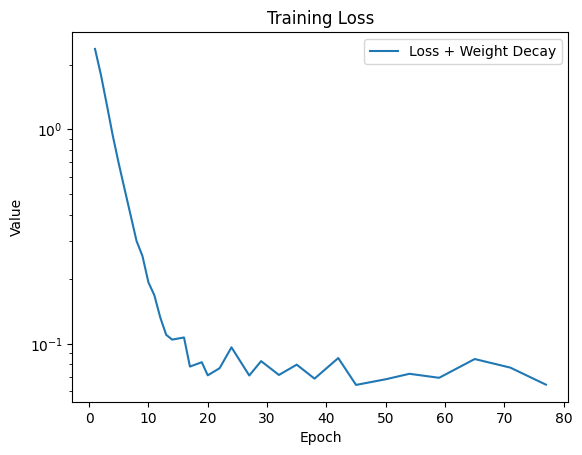

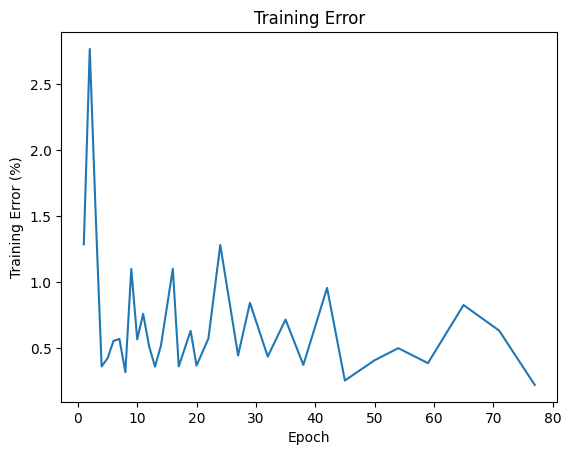

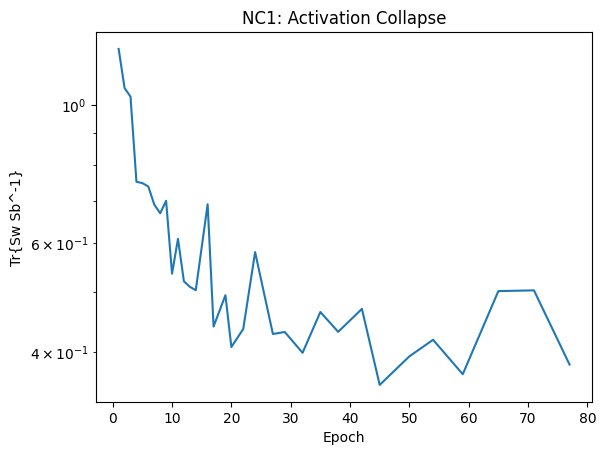

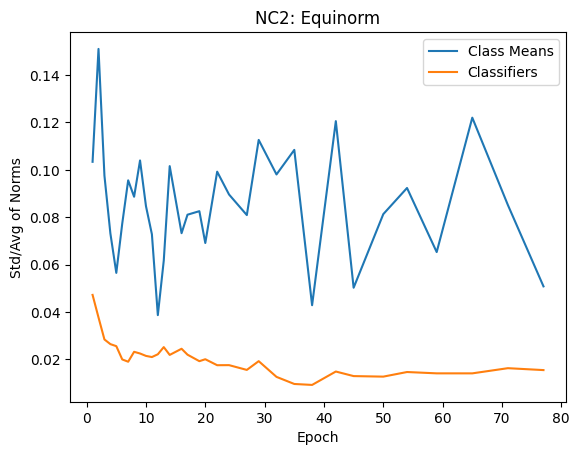

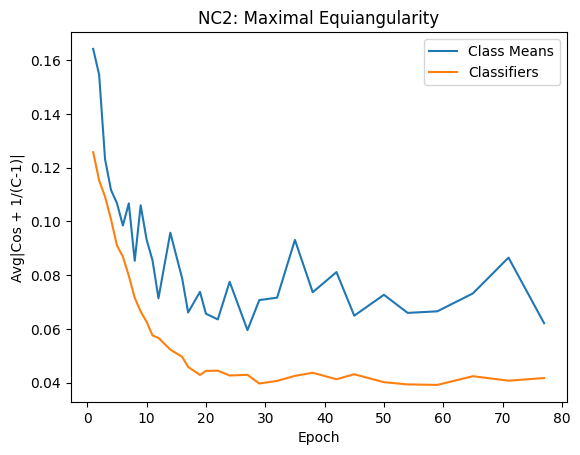

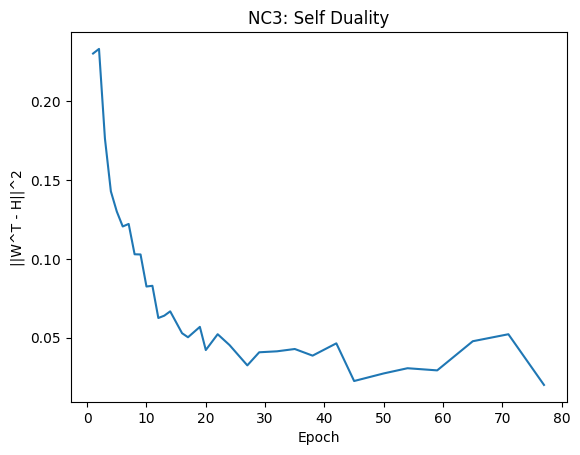

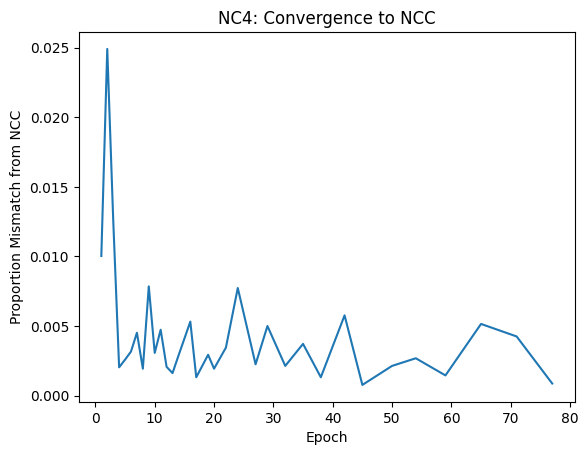

Train		Epoch: 78 [468/469 (100%)] 	Batch Loss: 0.028838 	Batch Accuracy: 0.984375: 100%|█████████▉| 468/469 [00:43<00:00, 10.77it/s]
Train		Epoch: 79 [468/469 (100%)] 	Batch Loss: 0.003725 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.77it/s]
Train		Epoch: 80 [468/469 (100%)] 	Batch Loss: 0.003763 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.81it/s]
Train		Epoch: 81 [468/469 (100%)] 	Batch Loss: 0.065991 	Batch Accuracy: 0.984375: 100%|█████████▉| 468/469 [00:43<00:00, 10.80it/s]
Train		Epoch: 82 [468/469 (100%)] 	Batch Loss: 0.023880 	Batch Accuracy: 0.984375: 100%|█████████▉| 468/469 [00:43<00:00, 10.78it/s]
Train		Epoch: 83 [468/469 (100%)] 	Batch Loss: 0.002020 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.83it/s]
Train		Epoch: 84 [468/469 (100%)] 	Batch Loss: 0.042568 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.80it/s]
Train		Epoch: 85 [468/469 (100%)] 	Batch Loss: 0.010547 	Batch Accura

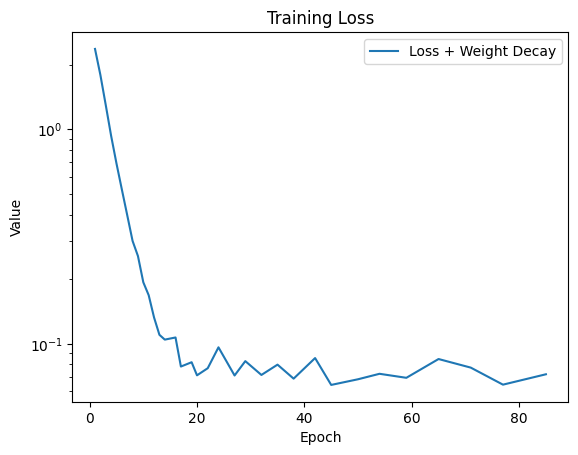

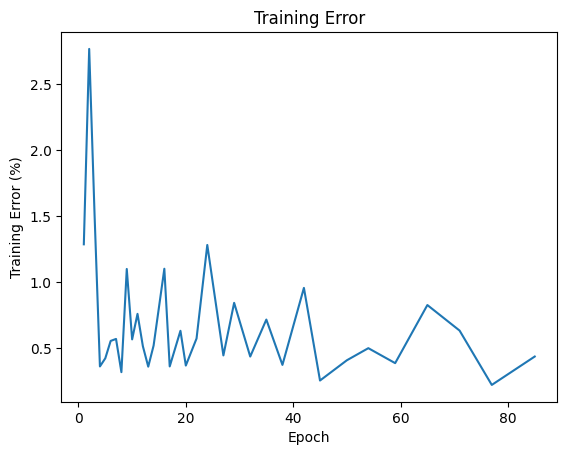

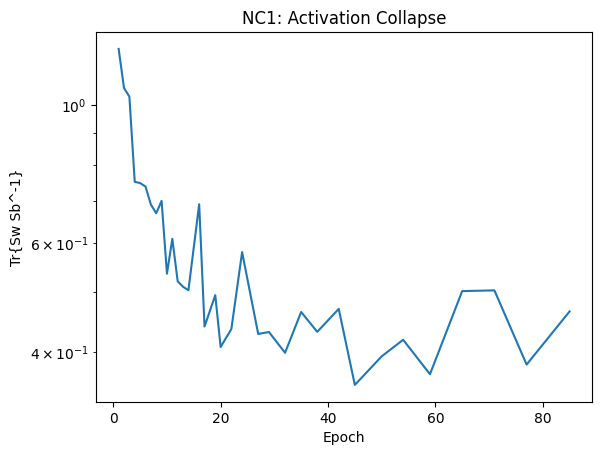

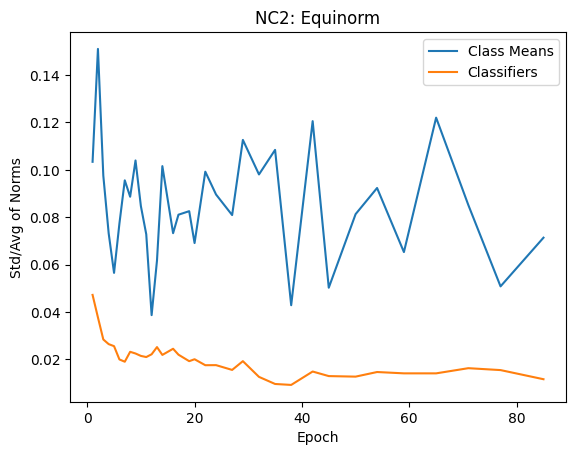

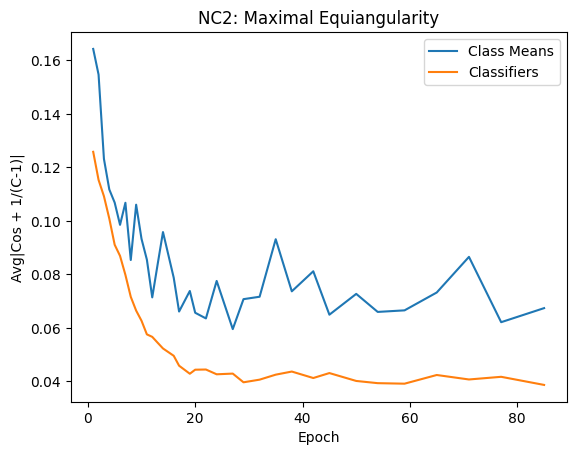

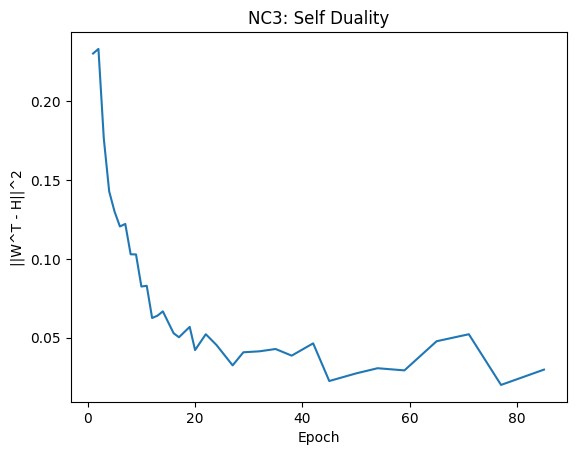

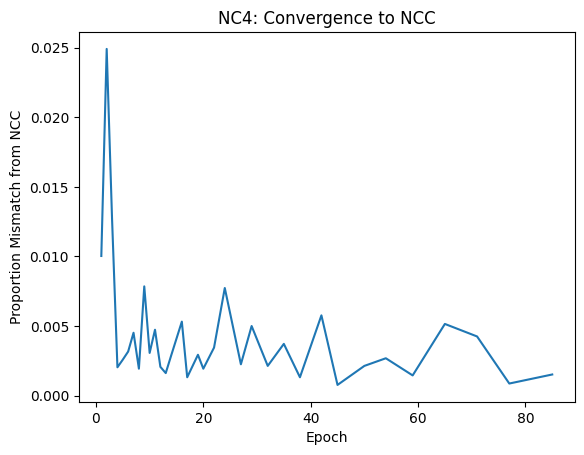

Train		Epoch: 86 [468/469 (100%)] 	Batch Loss: 0.003396 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.78it/s]
Train		Epoch: 87 [468/469 (100%)] 	Batch Loss: 0.029264 	Batch Accuracy: 0.984375: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Train		Epoch: 88 [468/469 (100%)] 	Batch Loss: 0.002110 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.79it/s]
Train		Epoch: 89 [468/469 (100%)] 	Batch Loss: 0.006991 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.69it/s]
Train		Epoch: 90 [468/469 (100%)] 	Batch Loss: 0.062903 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Train		Epoch: 91 [468/469 (100%)] 	Batch Loss: 0.003332 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.72it/s]
Train		Epoch: 92 [468/469 (100%)] 	Batch Loss: 0.039765 	Batch Accuracy: 0.984375: 100%|█████████▉| 468/469 [00:43<00:00, 10.72it/s]
Analysis Cov	Epoch: 92 [469/469 (100%)]: 100%|██████████| 469/469 [00

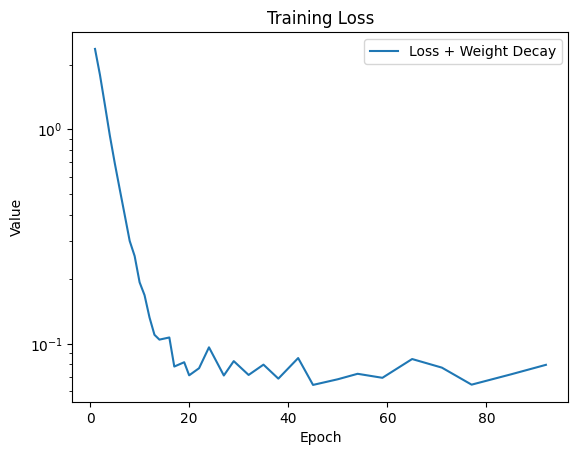

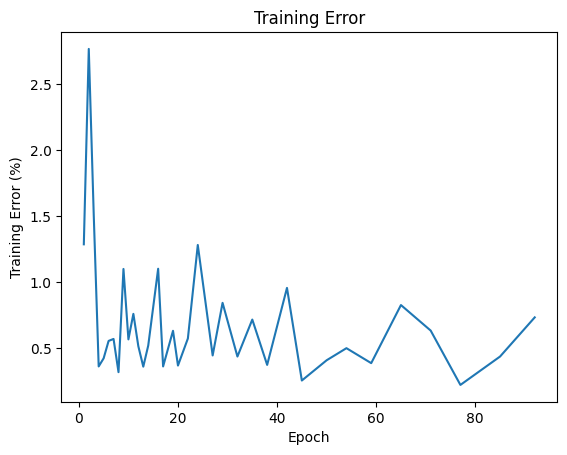

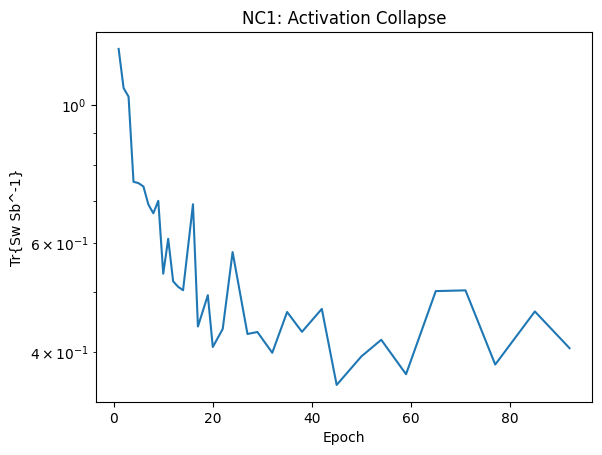

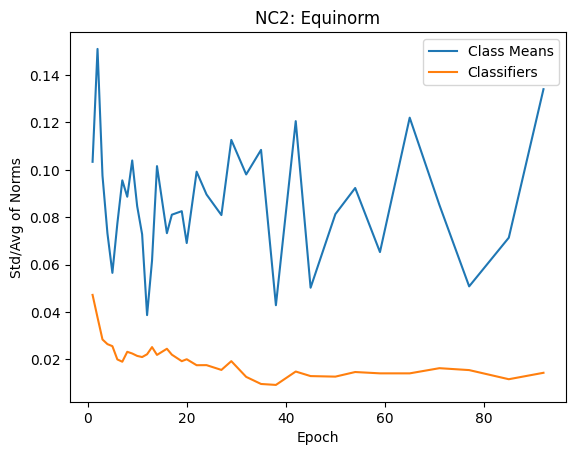

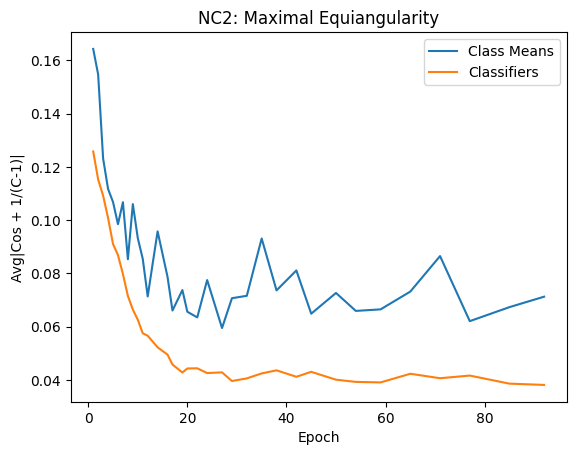

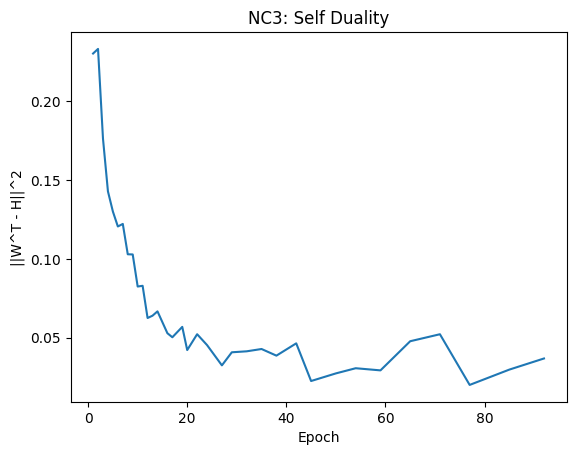

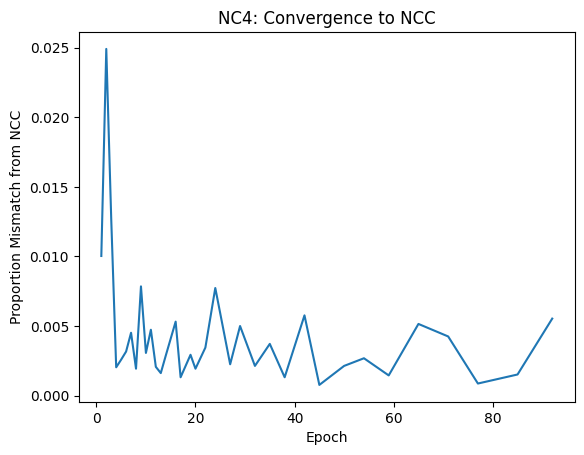

Train		Epoch: 93 [468/469 (100%)] 	Batch Loss: 0.021684 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.75it/s]
Train		Epoch: 94 [468/469 (100%)] 	Batch Loss: 0.003837 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.78it/s]
Train		Epoch: 95 [468/469 (100%)] 	Batch Loss: 0.003131 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.80it/s]
Train		Epoch: 96 [468/469 (100%)] 	Batch Loss: 0.004421 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Train		Epoch: 97 [468/469 (100%)] 	Batch Loss: 0.003187 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.74it/s]
Train		Epoch: 98 [468/469 (100%)] 	Batch Loss: 0.042011 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.72it/s]
Train		Epoch: 99 [468/469 (100%)] 	Batch Loss: 0.038581 	Batch Accuracy: 0.984375: 100%|█████████▉| 468/469 [00:43<00:00, 10.77it/s]
Train		Epoch: 100 [468/469 (100%)] 	Batch Loss: 0.007469 	Batch Accur

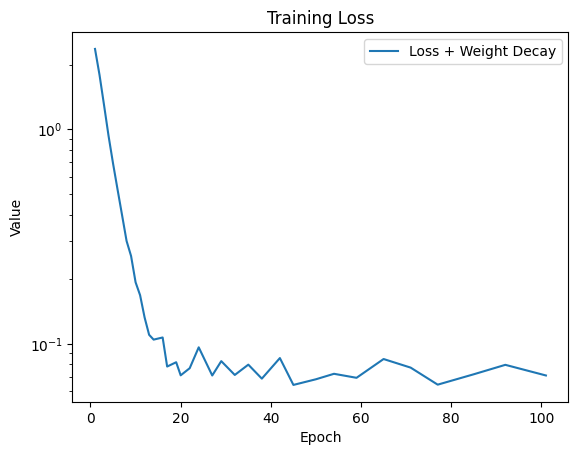

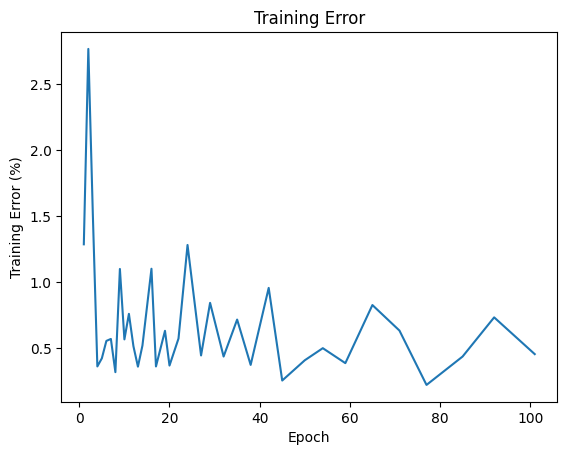

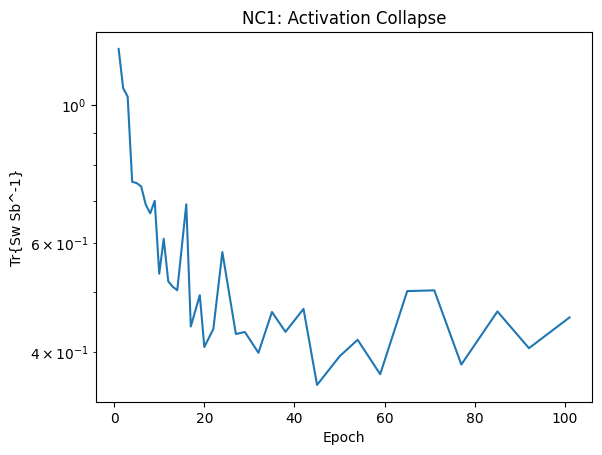

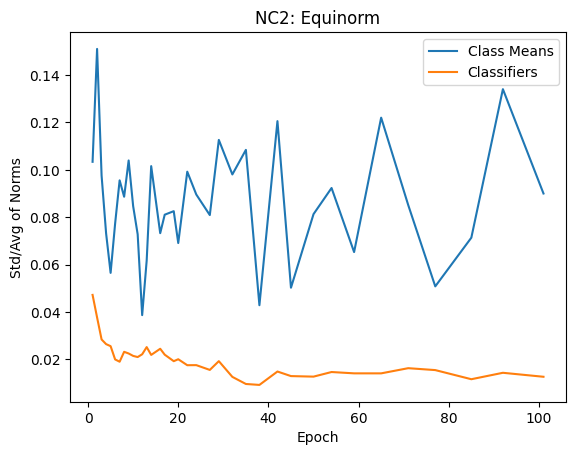

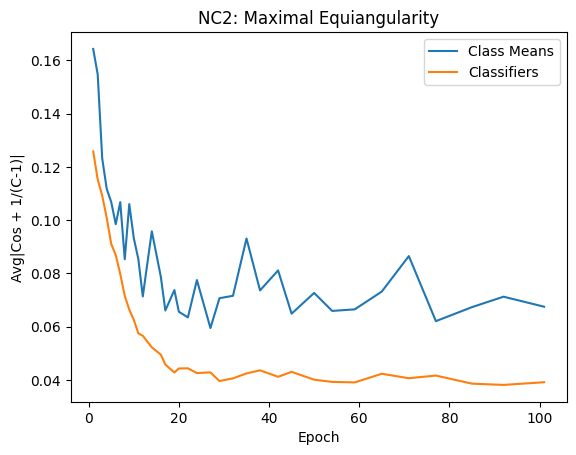

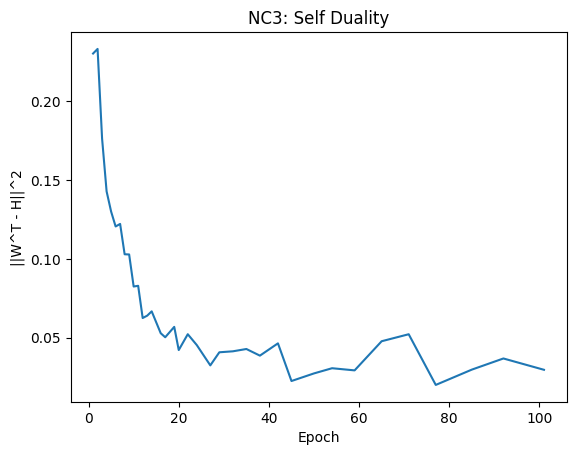

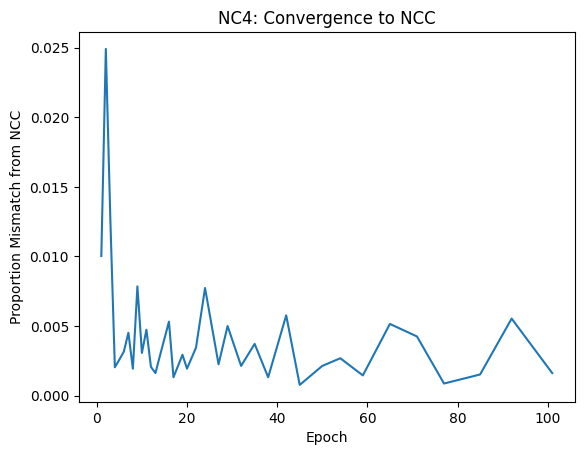

Train		Epoch: 102 [468/469 (100%)] 	Batch Loss: 0.004427 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.64it/s]
Train		Epoch: 103 [468/469 (100%)] 	Batch Loss: 0.020593 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Train		Epoch: 104 [468/469 (100%)] 	Batch Loss: 0.019173 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.75it/s]
Train		Epoch: 105 [468/469 (100%)] 	Batch Loss: 0.002642 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.80it/s]
Train		Epoch: 106 [468/469 (100%)] 	Batch Loss: 0.021668 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.77it/s]
Train		Epoch: 107 [468/469 (100%)] 	Batch Loss: 0.028313 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Train		Epoch: 108 [468/469 (100%)] 	Batch Loss: 0.013328 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Train		Epoch: 109 [468/469 (100%)] 	Batch Loss: 0.022748 	Batc

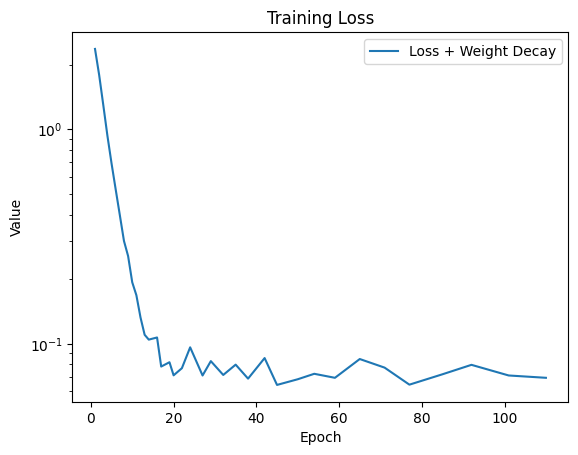

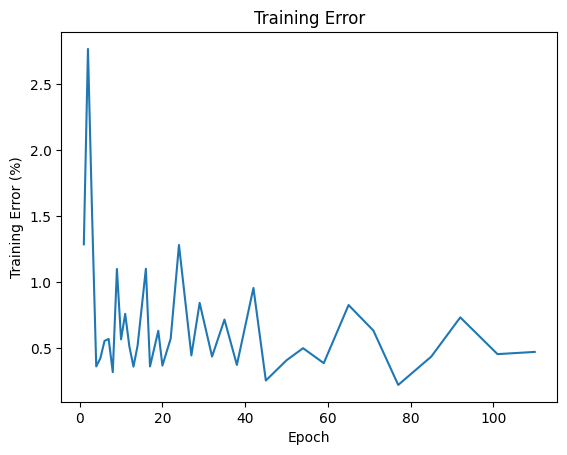

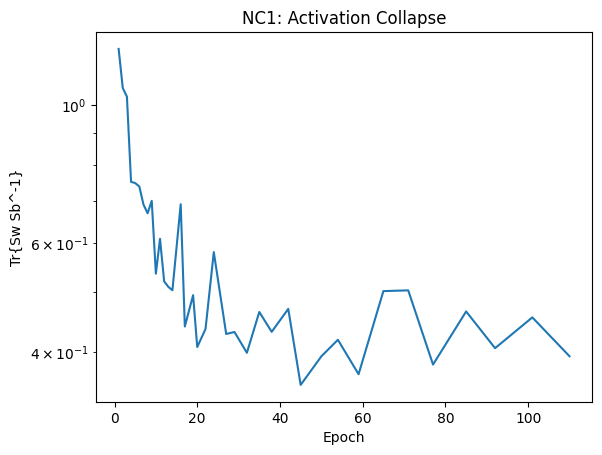

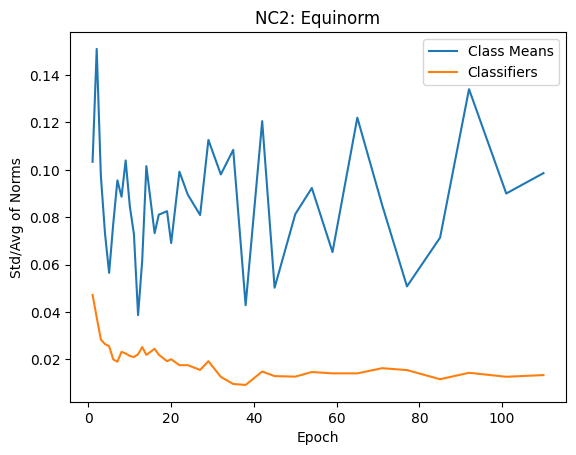

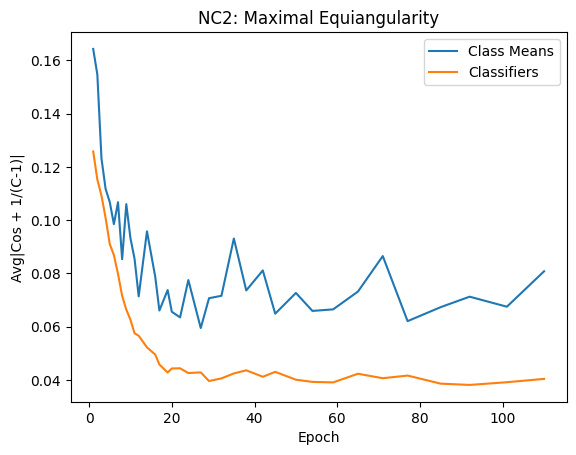

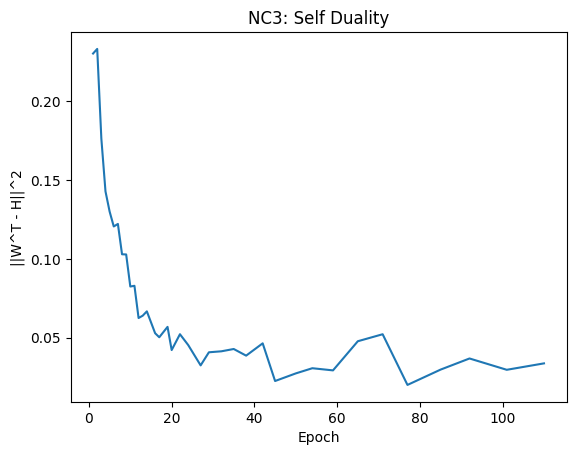

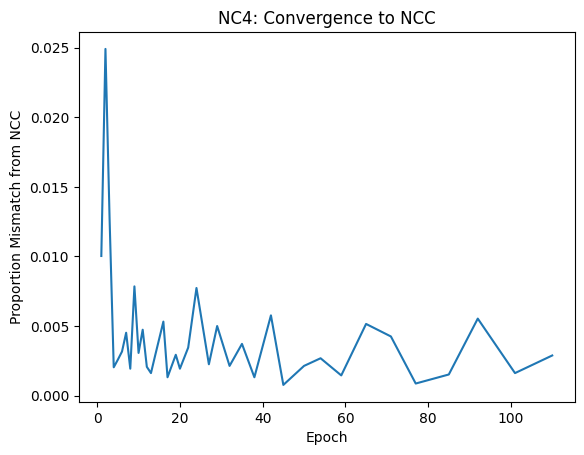

Train		Epoch: 111 [468/469 (100%)] 	Batch Loss: 0.002383 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.61it/s]
Train		Epoch: 112 [468/469 (100%)] 	Batch Loss: 0.001291 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.65it/s]
Train		Epoch: 113 [468/469 (100%)] 	Batch Loss: 0.018899 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.74it/s]
Train		Epoch: 114 [468/469 (100%)] 	Batch Loss: 0.012197 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Train		Epoch: 115 [468/469 (100%)] 	Batch Loss: 0.007204 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.81it/s]
Train		Epoch: 116 [468/469 (100%)] 	Batch Loss: 0.003463 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.81it/s]
Train		Epoch: 117 [468/469 (100%)] 	Batch Loss: 0.001372 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.78it/s]
Train		Epoch: 118 [468/469 (100%)] 	Batch Loss: 0.000629 	Batc

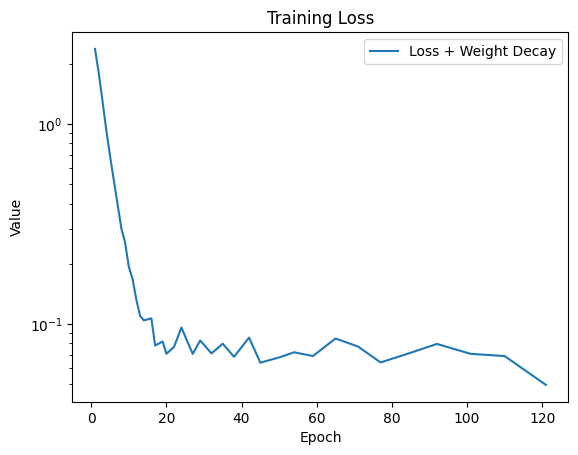

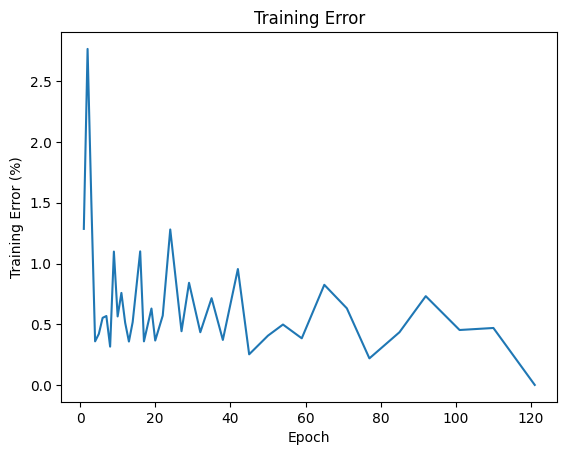

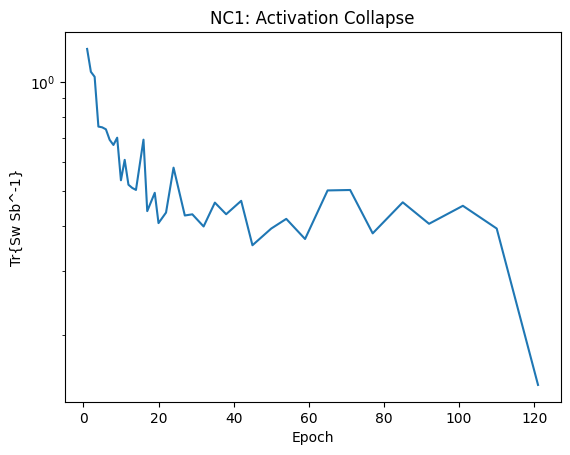

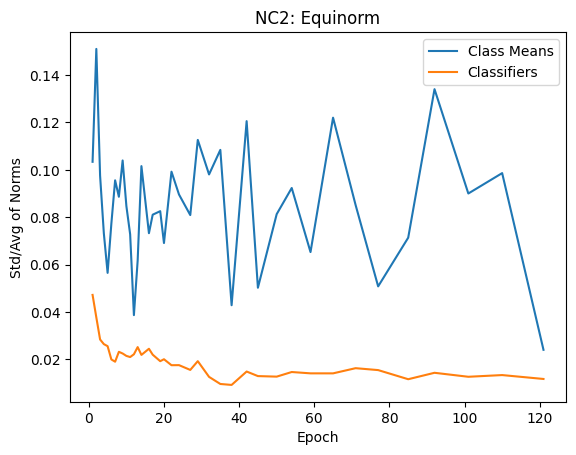

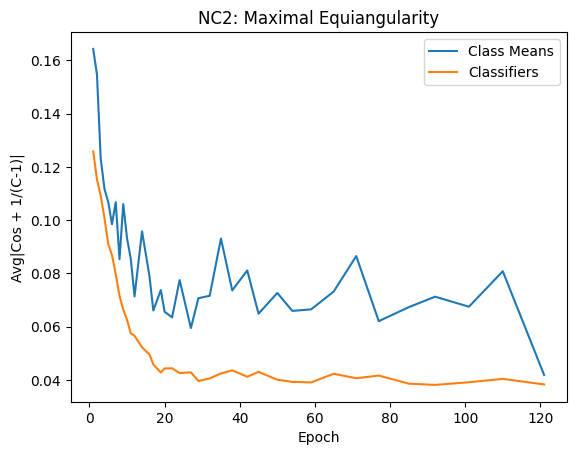

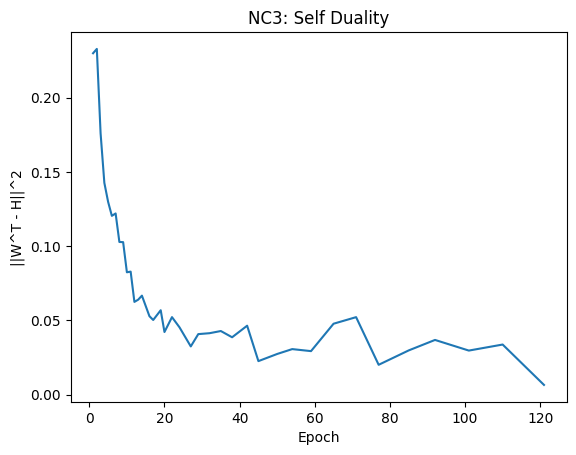

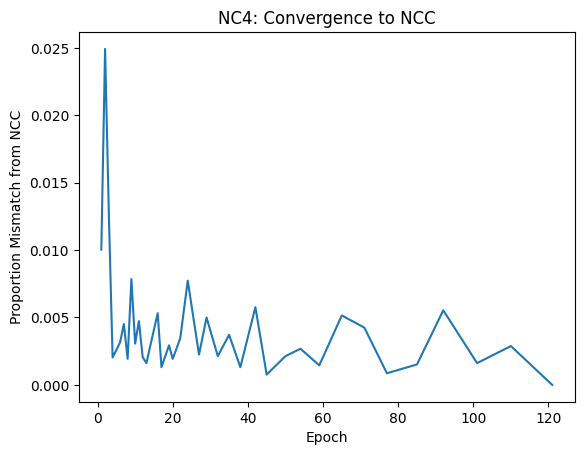

Train		Epoch: 122 [468/469 (100%)] 	Batch Loss: 0.001074 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.77it/s]
Train		Epoch: 123 [468/469 (100%)] 	Batch Loss: 0.001566 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.75it/s]
Train		Epoch: 124 [468/469 (100%)] 	Batch Loss: 0.000663 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Train		Epoch: 125 [468/469 (100%)] 	Batch Loss: 0.000942 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Train		Epoch: 126 [468/469 (100%)] 	Batch Loss: 0.000788 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Train		Epoch: 127 [468/469 (100%)] 	Batch Loss: 0.000914 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.76it/s]
Train		Epoch: 128 [468/469 (100%)] 	Batch Loss: 0.001120 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.73it/s]
Train		Epoch: 129 [468/469 (100%)] 	Batch Loss: 0.000983 	Batc

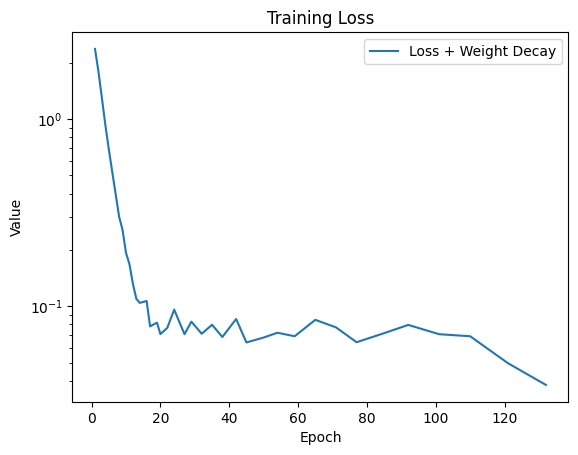

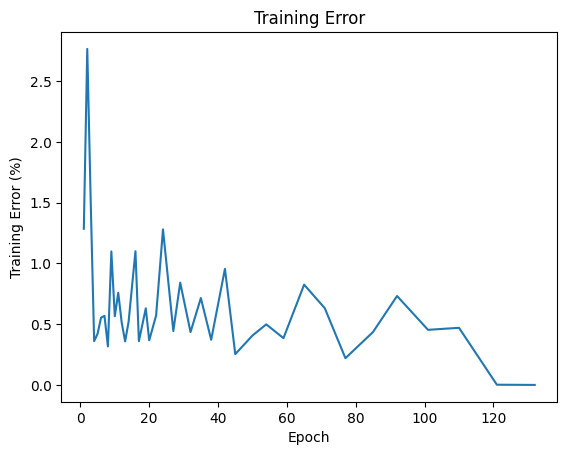

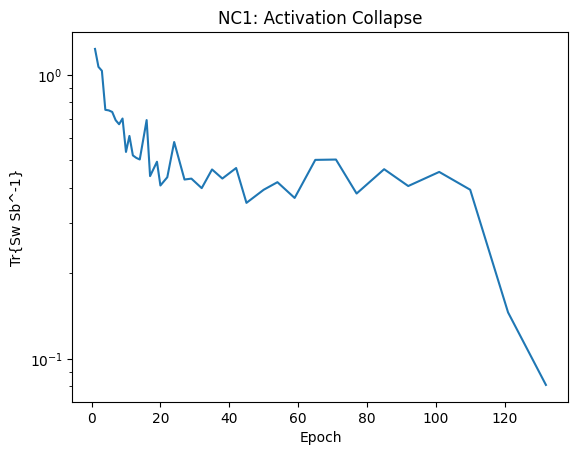

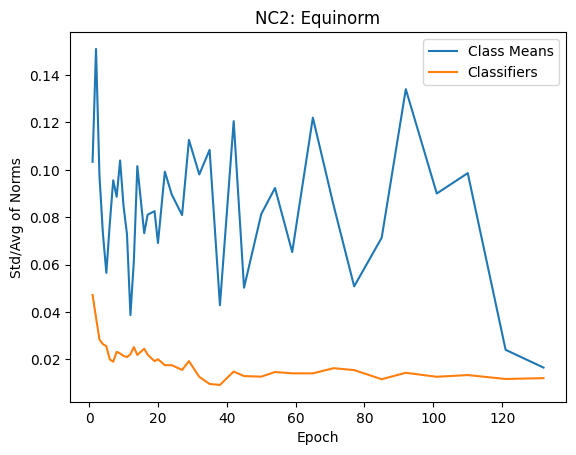

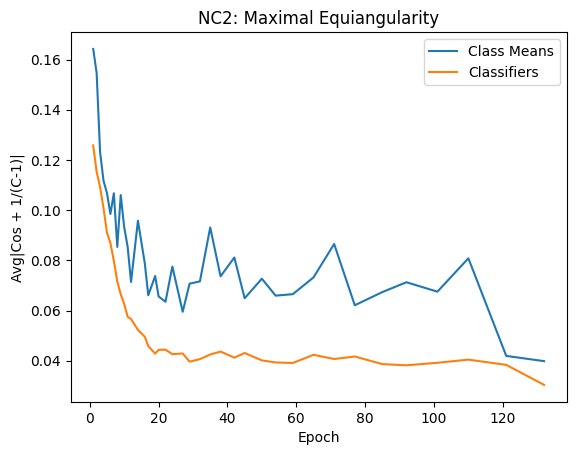

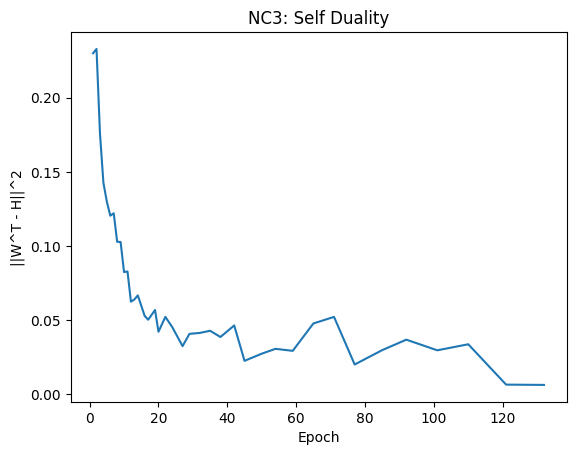

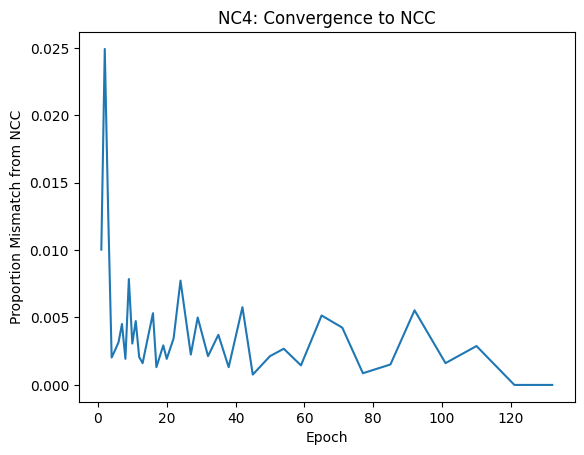

Train		Epoch: 133 [468/469 (100%)] 	Batch Loss: 0.001243 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.75it/s]
Train		Epoch: 134 [468/469 (100%)] 	Batch Loss: 0.000931 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.80it/s]
Train		Epoch: 135 [468/469 (100%)] 	Batch Loss: 0.001158 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.79it/s]
Train		Epoch: 136 [468/469 (100%)] 	Batch Loss: 0.000929 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.80it/s]
Train		Epoch: 137 [468/469 (100%)] 	Batch Loss: 0.001129 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.78it/s]
Train		Epoch: 138 [468/469 (100%)] 	Batch Loss: 0.007247 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.77it/s]
Train		Epoch: 139 [468/469 (100%)] 	Batch Loss: 0.001107 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.78it/s]
Train		Epoch: 140 [468/469 (100%)] 	Batch Loss: 0.000929 	Batc

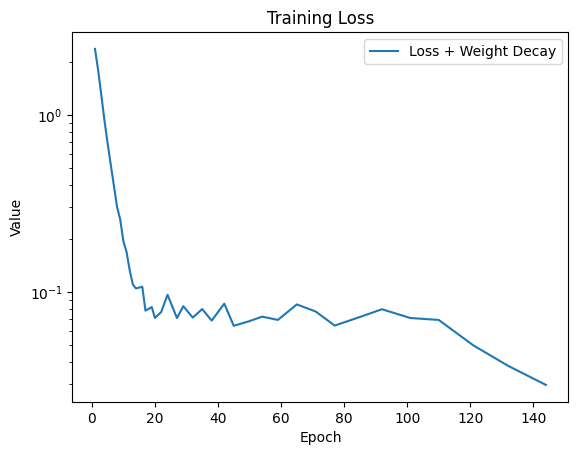

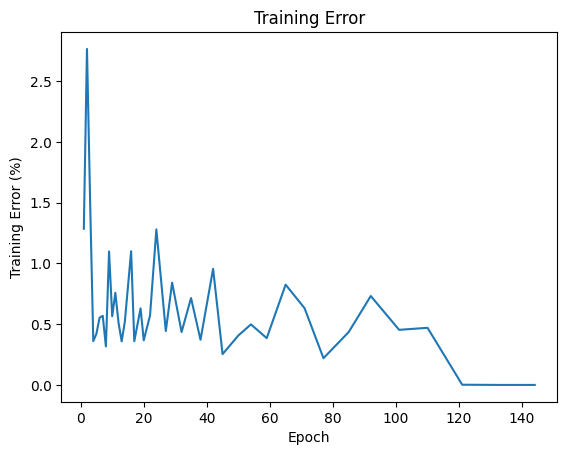

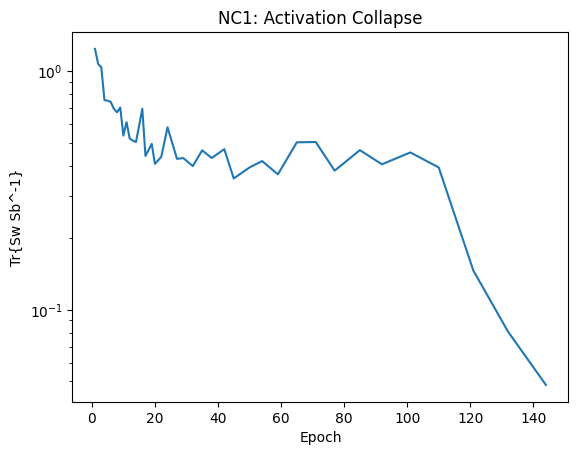

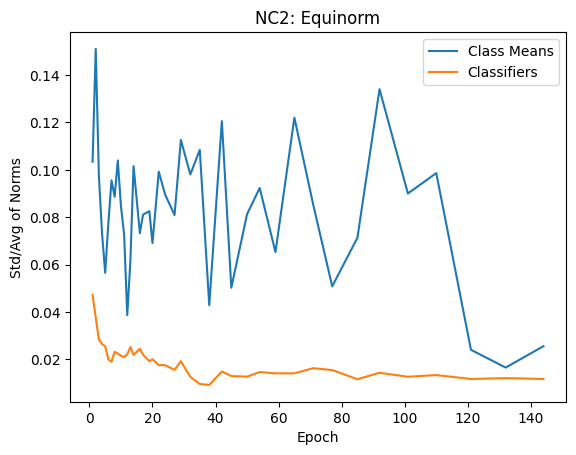

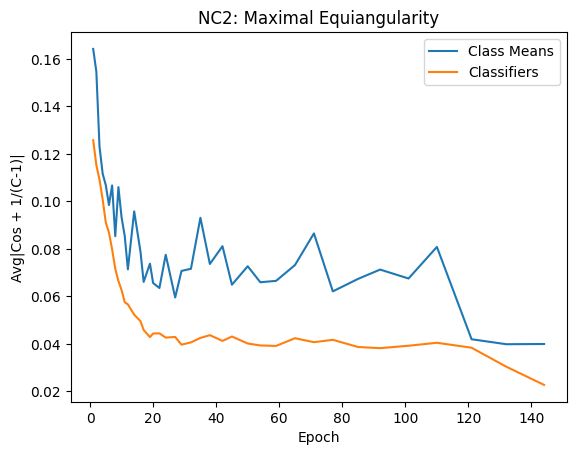

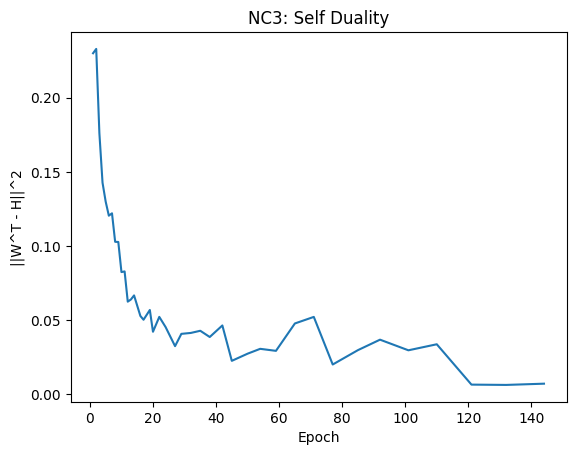

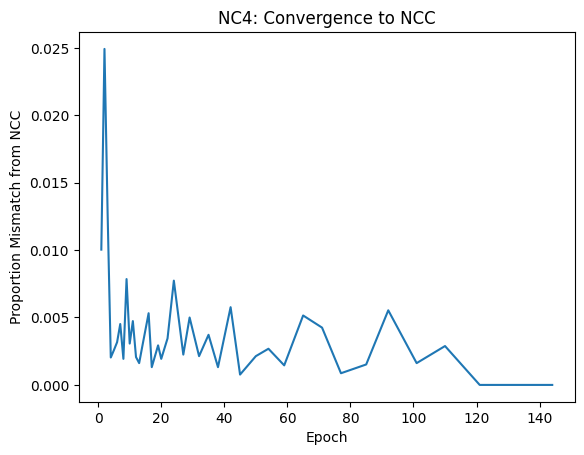

Train		Epoch: 145 [468/469 (100%)] 	Batch Loss: 0.000983 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.82it/s]
Train		Epoch: 146 [468/469 (100%)] 	Batch Loss: 0.001111 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.85it/s]
Train		Epoch: 147 [468/469 (100%)] 	Batch Loss: 0.001009 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.78it/s]
Train		Epoch: 148 [468/469 (100%)] 	Batch Loss: 0.001133 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.80it/s]
Train		Epoch: 149 [468/469 (100%)] 	Batch Loss: 0.001022 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.81it/s]
Train		Epoch: 150 [468/469 (100%)] 	Batch Loss: 0.001673 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.74it/s]
Train		Epoch: 151 [468/469 (100%)] 	Batch Loss: 0.001149 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.81it/s]
Train		Epoch: 152 [468/469 (100%)] 	Batch Loss: 0.001073 	Batc

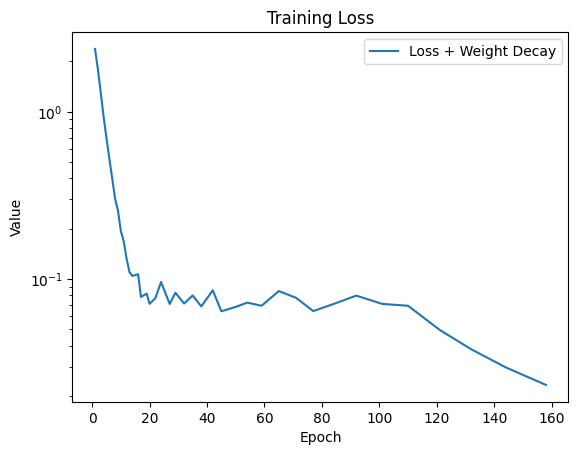

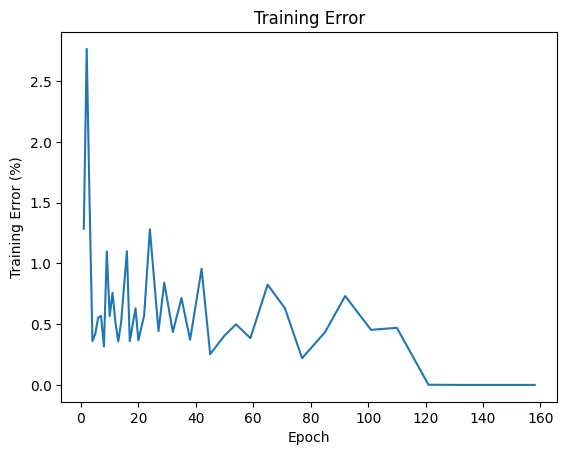

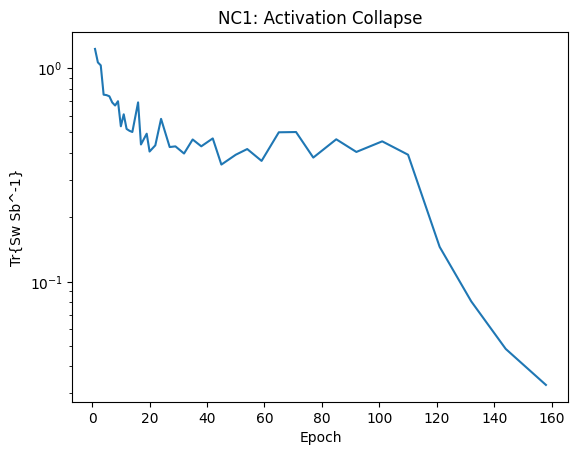

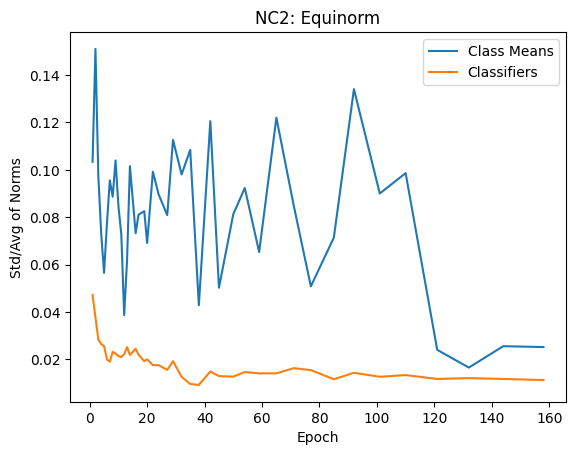

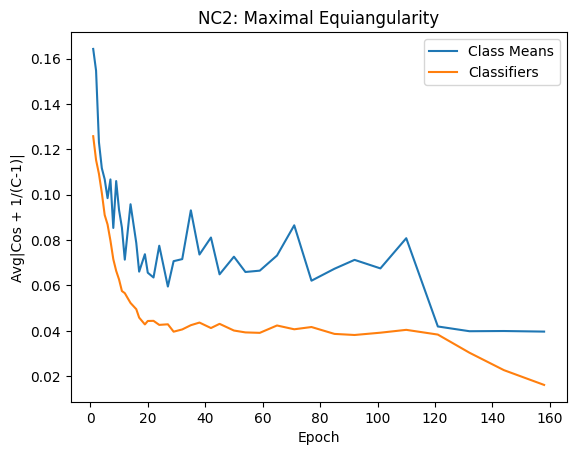

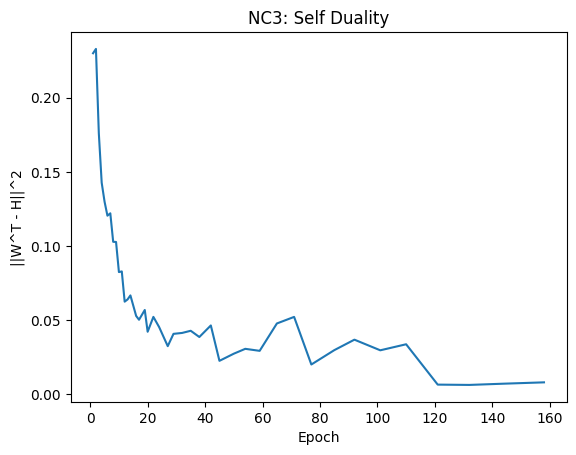

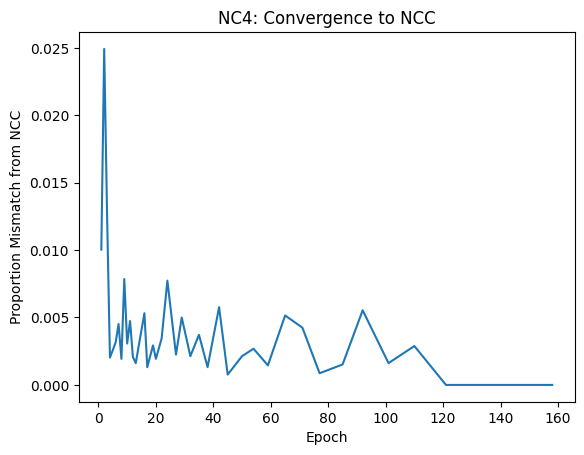

Train		Epoch: 159 [468/469 (100%)] 	Batch Loss: 0.001075 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.74it/s]
Train		Epoch: 160 [468/469 (100%)] 	Batch Loss: 0.000918 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.81it/s]
Train		Epoch: 161 [468/469 (100%)] 	Batch Loss: 0.001210 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.79it/s]
Train		Epoch: 162 [468/469 (100%)] 	Batch Loss: 0.001192 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.78it/s]
Train		Epoch: 163 [468/469 (100%)] 	Batch Loss: 0.000814 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.80it/s]
Train		Epoch: 164 [468/469 (100%)] 	Batch Loss: 0.001170 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.78it/s]
Train		Epoch: 165 [468/469 (100%)] 	Batch Loss: 0.000961 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.79it/s]
Train		Epoch: 166 [468/469 (100%)] 	Batch Loss: 0.000984 	Batc

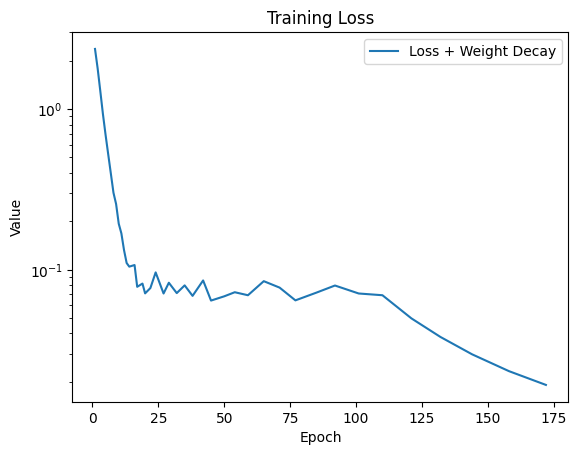

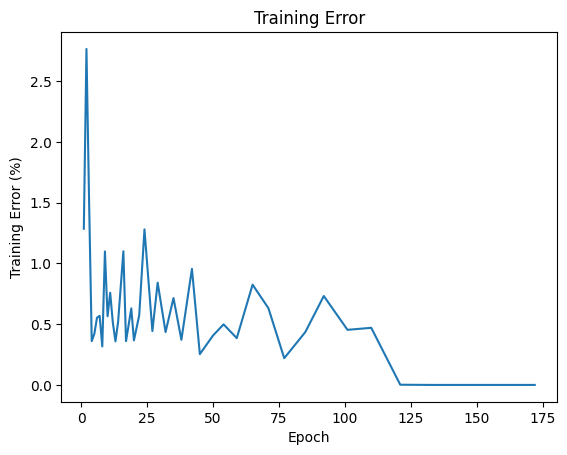

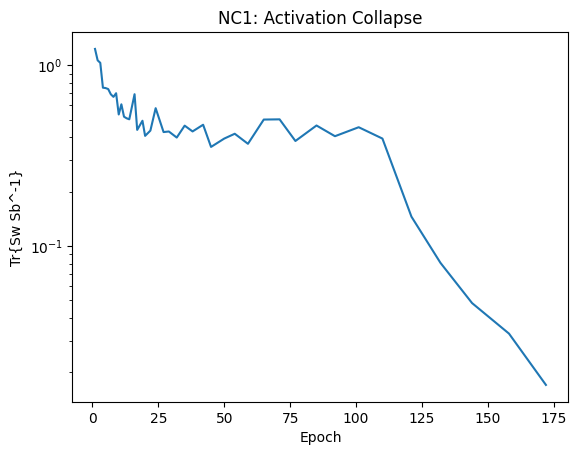

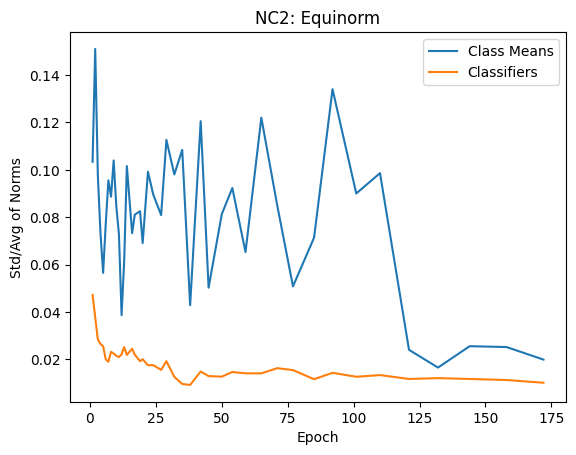

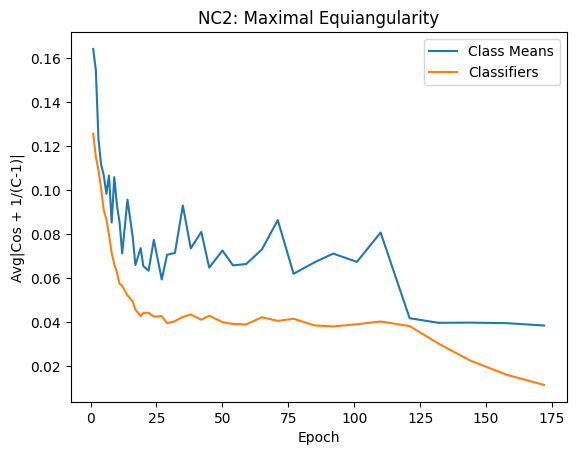

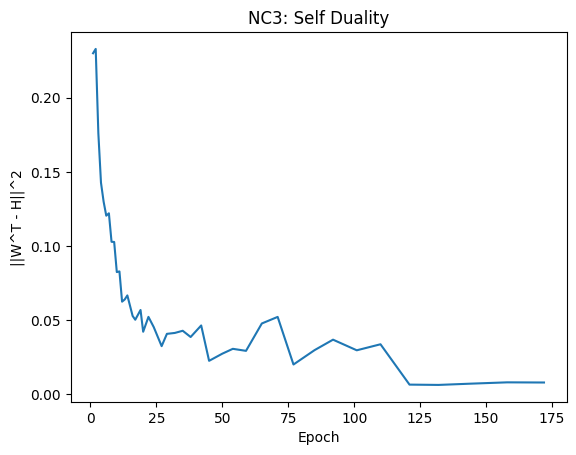

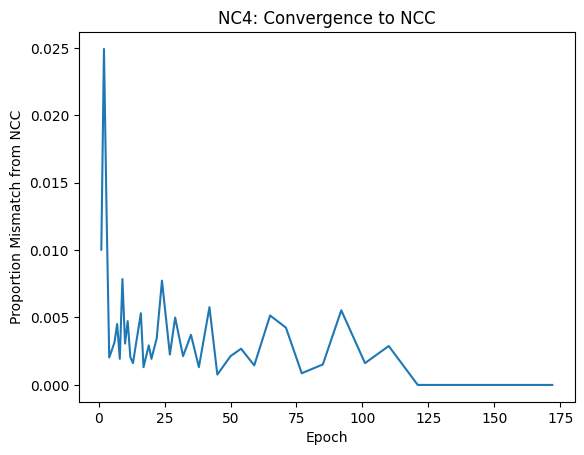

Train		Epoch: 173 [468/469 (100%)] 	Batch Loss: 0.001201 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.82it/s]
Train		Epoch: 174 [468/469 (100%)] 	Batch Loss: 0.000869 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.81it/s]
Train		Epoch: 175 [468/469 (100%)] 	Batch Loss: 0.000968 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.77it/s]
Train		Epoch: 176 [468/469 (100%)] 	Batch Loss: 0.000846 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.77it/s]
Train		Epoch: 177 [468/469 (100%)] 	Batch Loss: 0.000934 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.83it/s]
Train		Epoch: 178 [468/469 (100%)] 	Batch Loss: 0.001838 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.78it/s]
Train		Epoch: 179 [468/469 (100%)] 	Batch Loss: 0.001915 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.81it/s]
Train		Epoch: 180 [468/469 (100%)] 	Batch Loss: 0.002214 	Batc

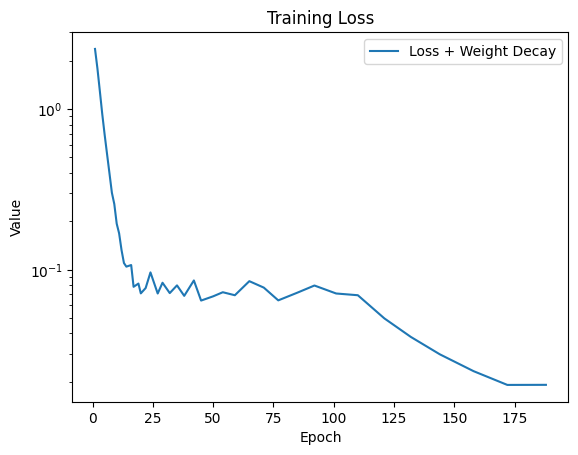

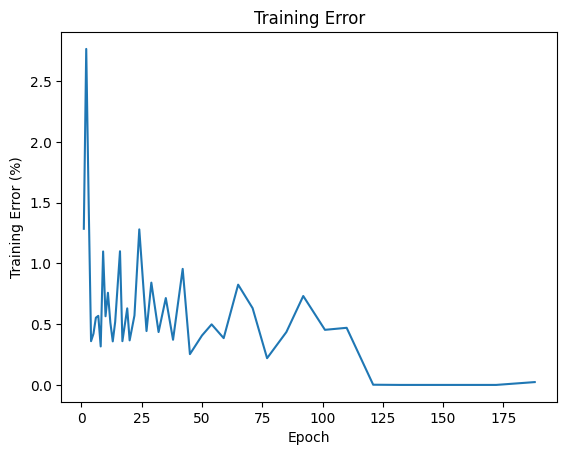

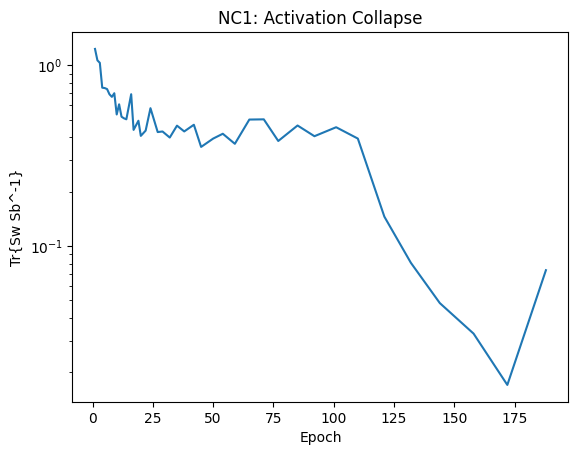

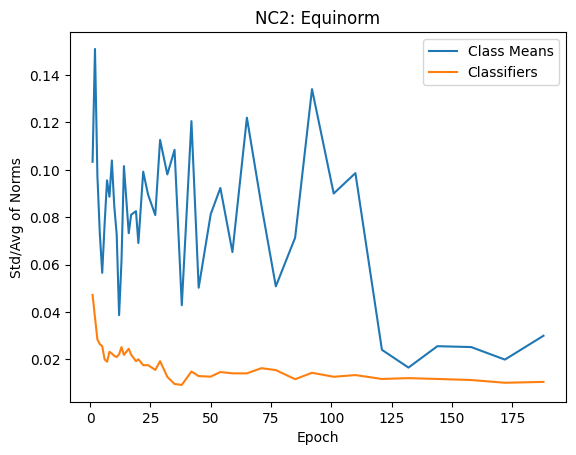

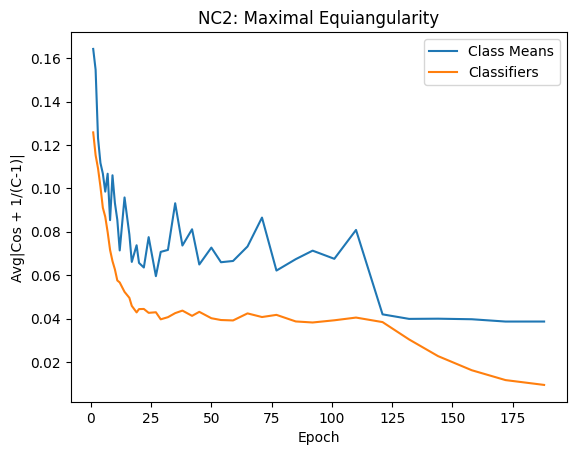

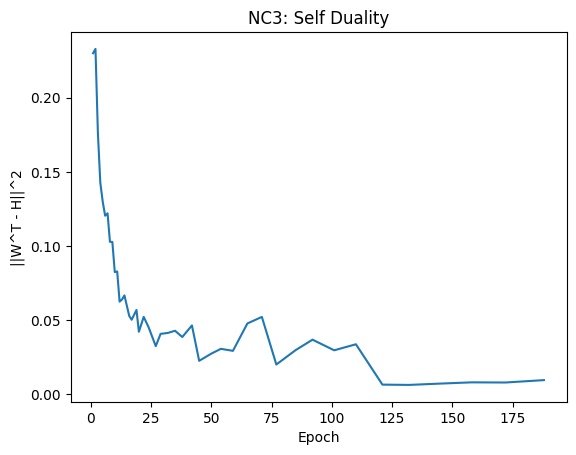

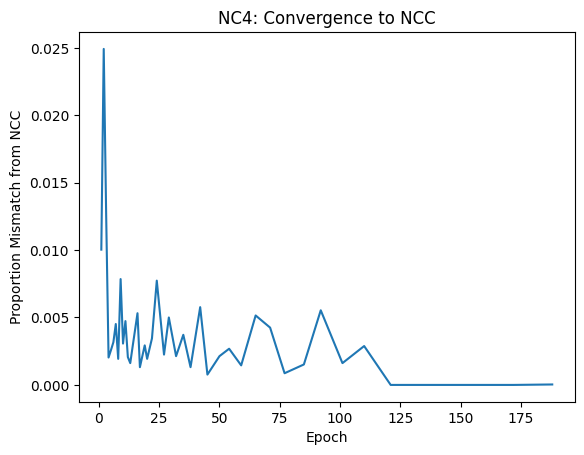

Train		Epoch: 189 [468/469 (100%)] 	Batch Loss: 0.001322 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.54it/s]
Train		Epoch: 190 [468/469 (100%)] 	Batch Loss: 0.001210 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.64it/s]
Train		Epoch: 191 [468/469 (100%)] 	Batch Loss: 0.001513 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.63it/s]
Train		Epoch: 192 [468/469 (100%)] 	Batch Loss: 0.000876 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.57it/s]
Train		Epoch: 193 [468/469 (100%)] 	Batch Loss: 0.000747 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.60it/s]
Train		Epoch: 194 [468/469 (100%)] 	Batch Loss: 0.000798 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.64it/s]
Train		Epoch: 195 [468/469 (100%)] 	Batch Loss: 0.000822 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.64it/s]
Train		Epoch: 196 [468/469 (100%)] 	Batch Loss: 0.000703 	Batc

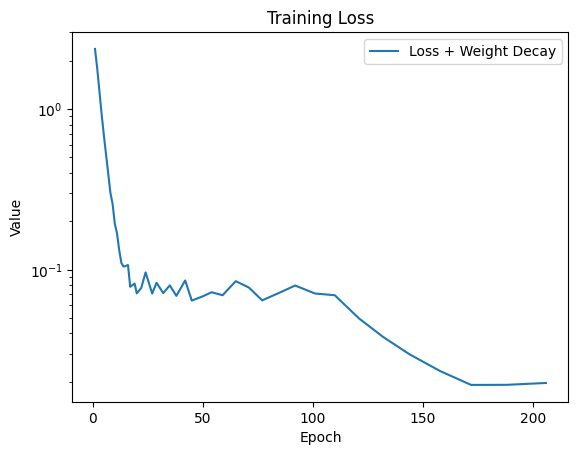

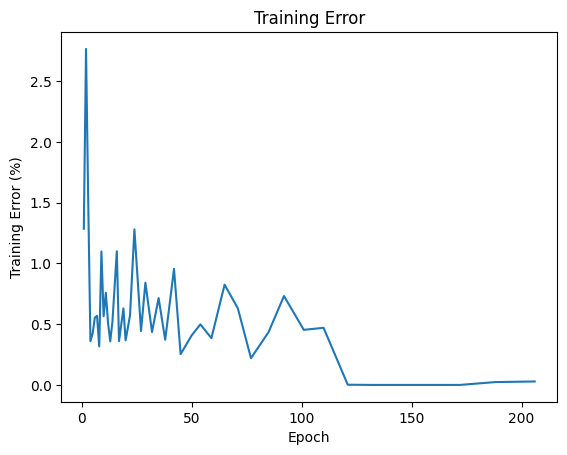

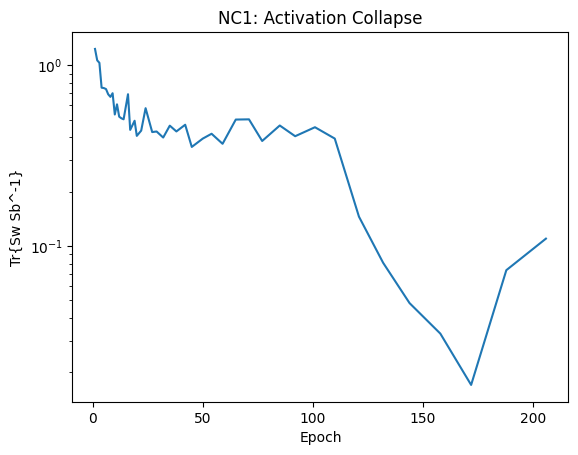

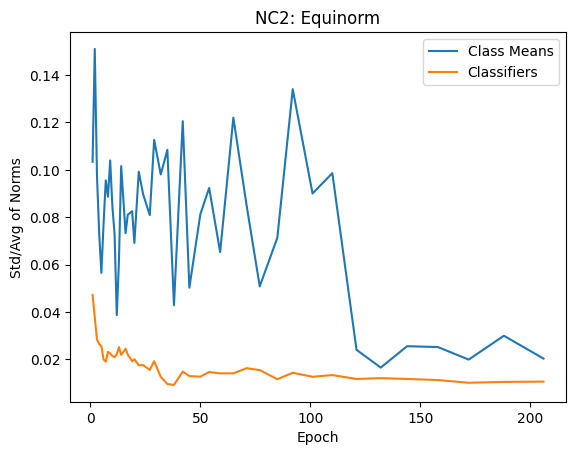

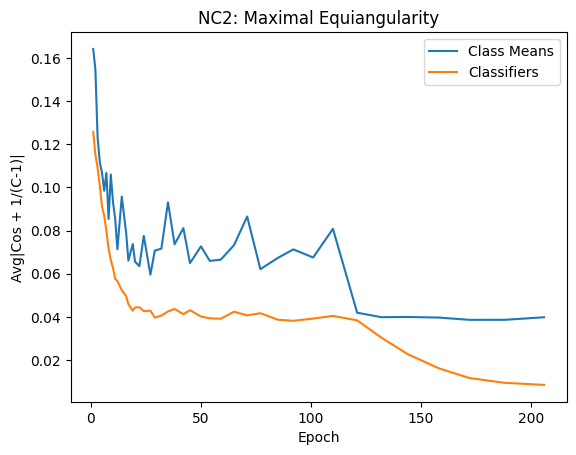

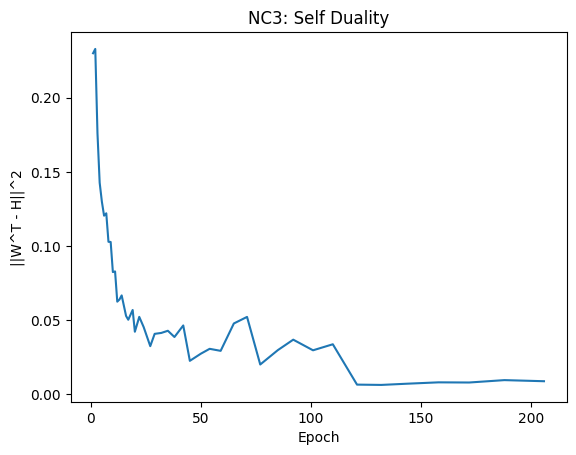

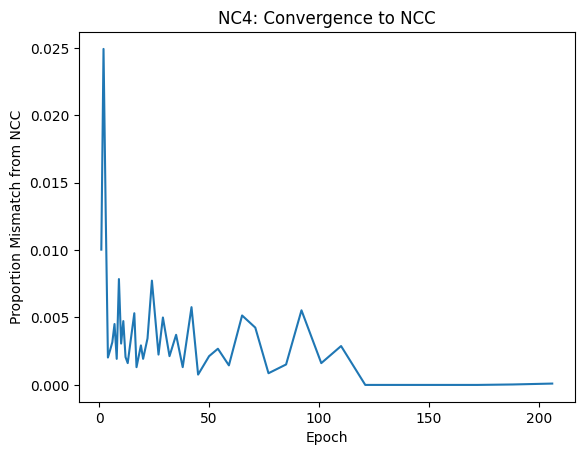

Train		Epoch: 207 [468/469 (100%)] 	Batch Loss: 0.001494 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.60it/s]
Train		Epoch: 208 [468/469 (100%)] 	Batch Loss: 0.001991 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.63it/s]
Train		Epoch: 209 [468/469 (100%)] 	Batch Loss: 0.001508 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.61it/s]
Train		Epoch: 210 [468/469 (100%)] 	Batch Loss: 0.001174 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.61it/s]
Train		Epoch: 211 [468/469 (100%)] 	Batch Loss: 0.000899 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.64it/s]
Train		Epoch: 212 [468/469 (100%)] 	Batch Loss: 0.000793 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.65it/s]
Train		Epoch: 213 [468/469 (100%)] 	Batch Loss: 0.001348 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.60it/s]
Train		Epoch: 214 [468/469 (100%)] 	Batch Loss: 0.000845 	Batc

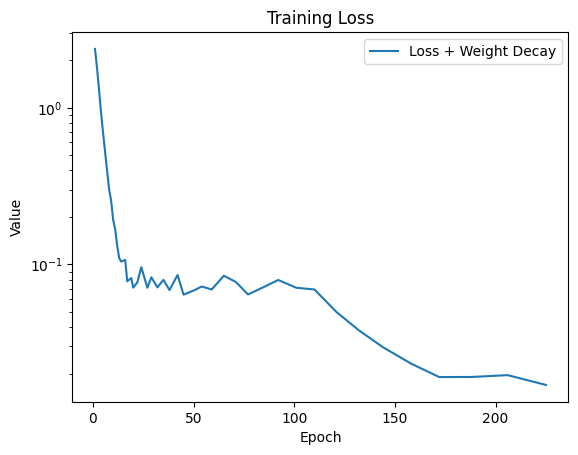

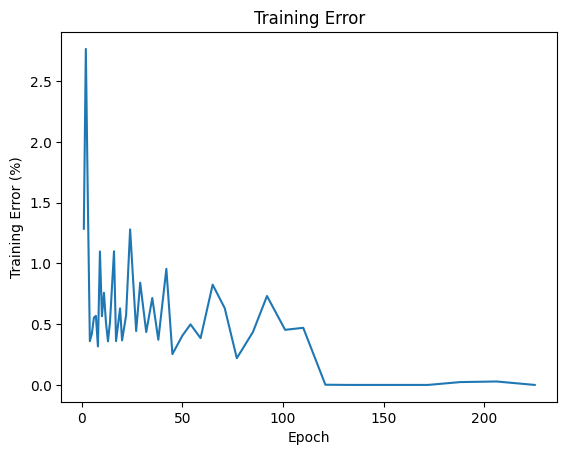

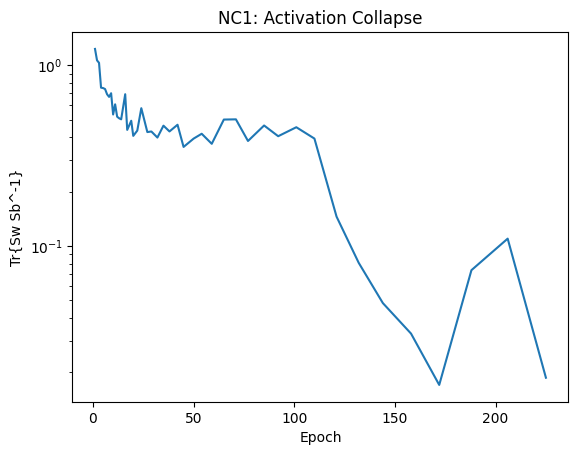

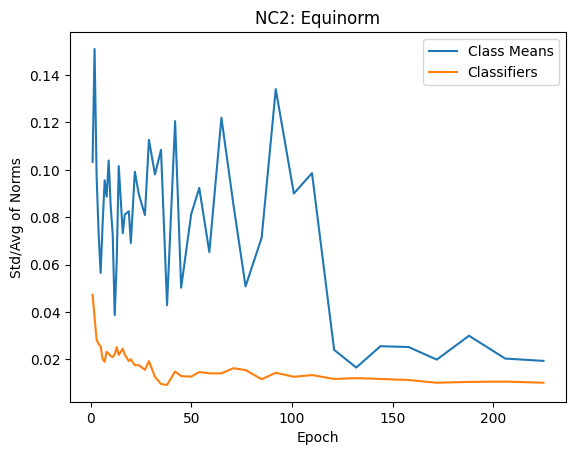

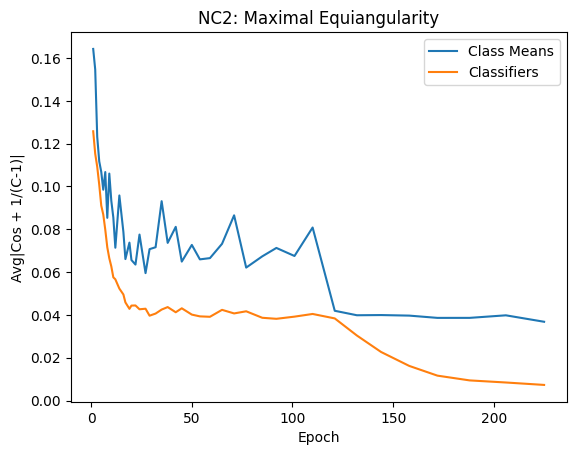

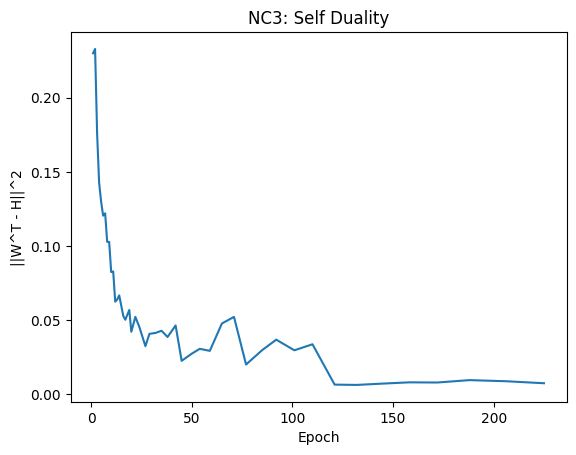

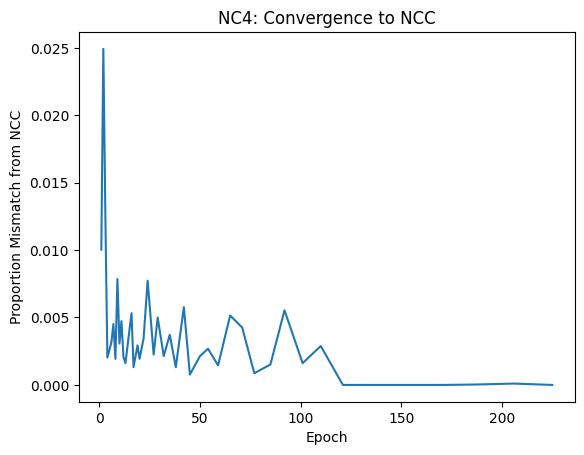

Train		Epoch: 226 [468/469 (100%)] 	Batch Loss: 0.000689 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.65it/s]
Train		Epoch: 227 [468/469 (100%)] 	Batch Loss: 0.000767 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.60it/s]
Train		Epoch: 228 [468/469 (100%)] 	Batch Loss: 0.000879 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.65it/s]
Train		Epoch: 229 [468/469 (100%)] 	Batch Loss: 0.001086 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.64it/s]
Train		Epoch: 230 [468/469 (100%)] 	Batch Loss: 0.000866 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.67it/s]
Train		Epoch: 231 [468/469 (100%)] 	Batch Loss: 0.016495 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.65it/s]
Train		Epoch: 232 [468/469 (100%)] 	Batch Loss: 0.014757 	Batch Accuracy: 0.992188: 100%|█████████▉| 468/469 [00:43<00:00, 10.65it/s]
Train		Epoch: 233 [468/469 (100%)] 	Batch Loss: 0.001339 	Batc

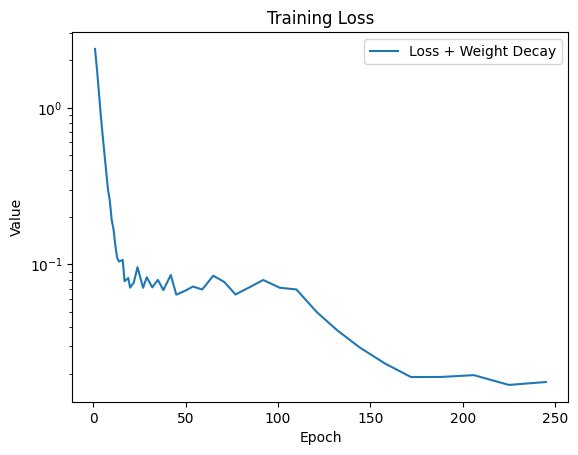

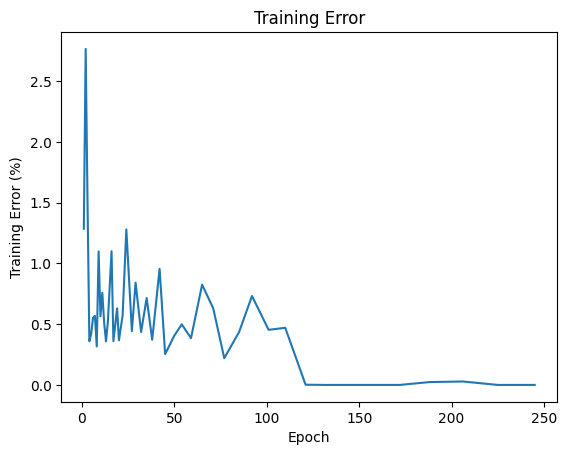

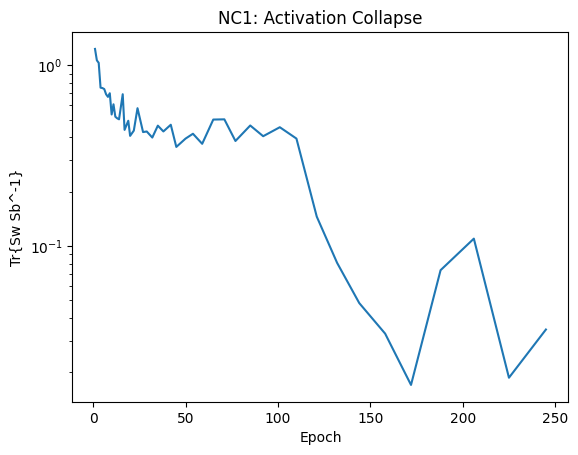

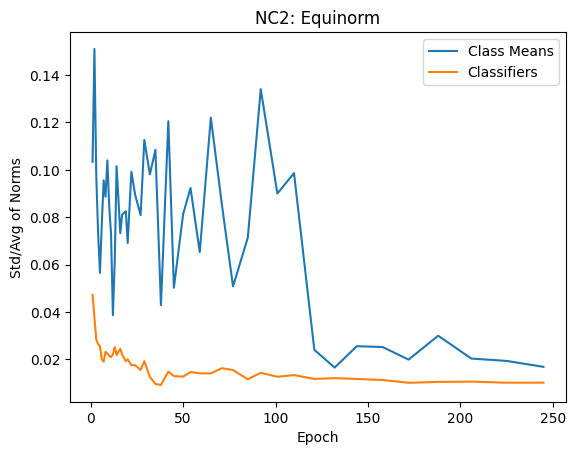

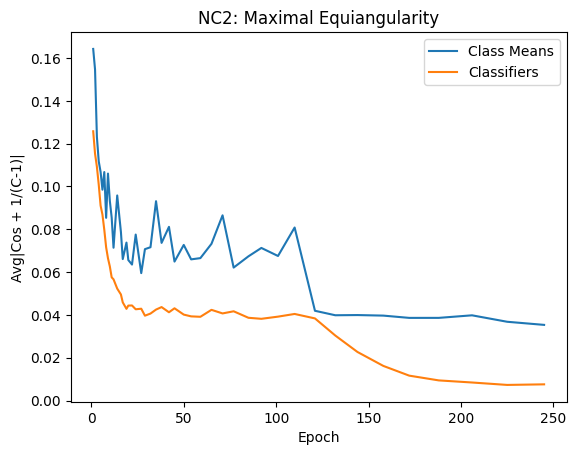

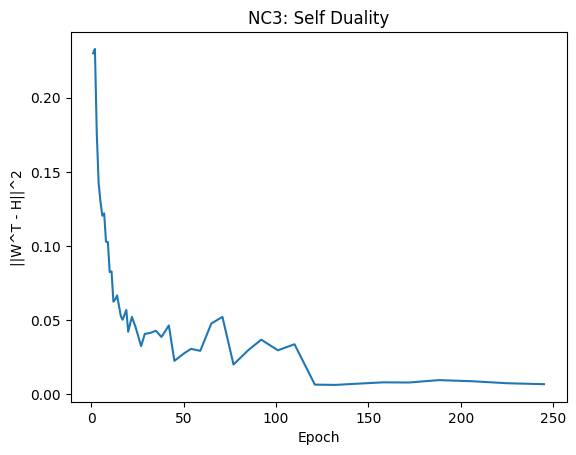

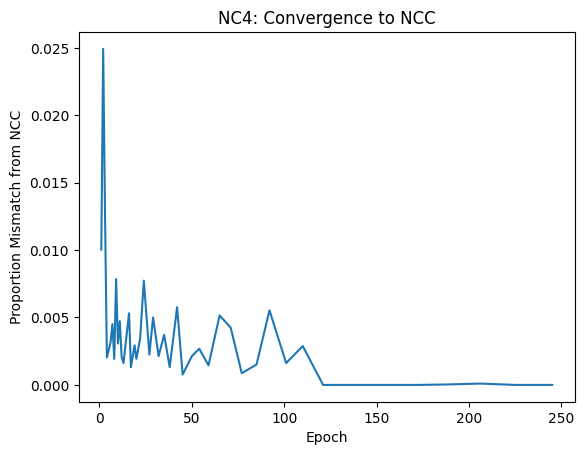

Train		Epoch: 246 [468/469 (100%)] 	Batch Loss: 0.000883 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.61it/s]
Train		Epoch: 247 [468/469 (100%)] 	Batch Loss: 0.000949 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.62it/s]
Train		Epoch: 248 [468/469 (100%)] 	Batch Loss: 0.001010 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.61it/s]
Train		Epoch: 249 [468/469 (100%)] 	Batch Loss: 0.000909 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.61it/s]
Train		Epoch: 250 [468/469 (100%)] 	Batch Loss: 0.000880 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.63it/s]
Train		Epoch: 251 [468/469 (100%)] 	Batch Loss: 0.000973 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.64it/s]
Train		Epoch: 252 [468/469 (100%)] 	Batch Loss: 0.000540 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.58it/s]
Train		Epoch: 253 [468/469 (100%)] 	Batch Loss: 0.001200 	Batc

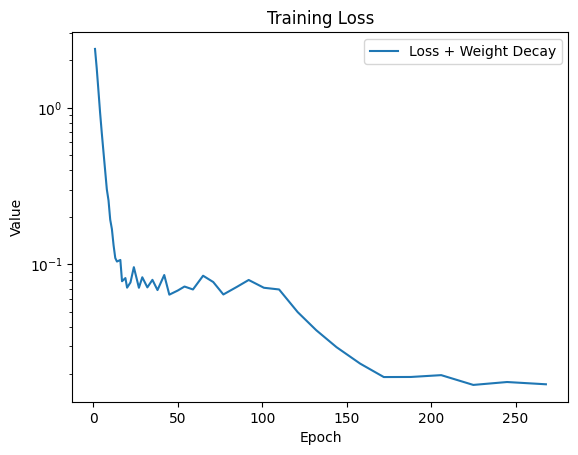

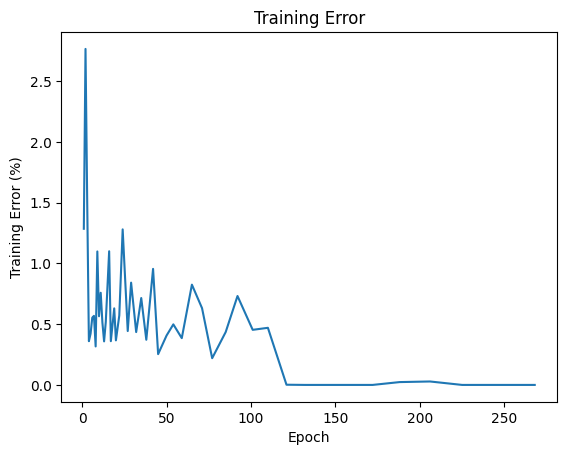

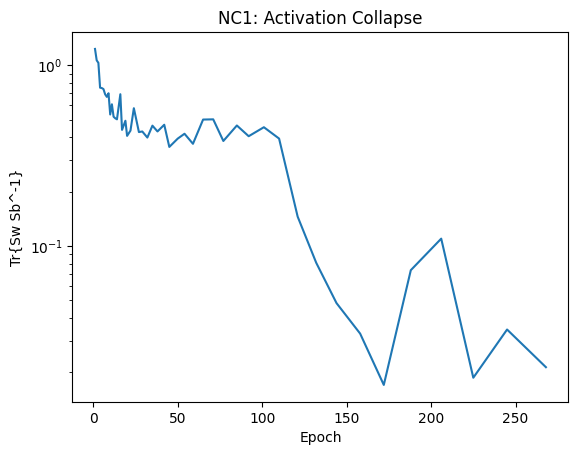

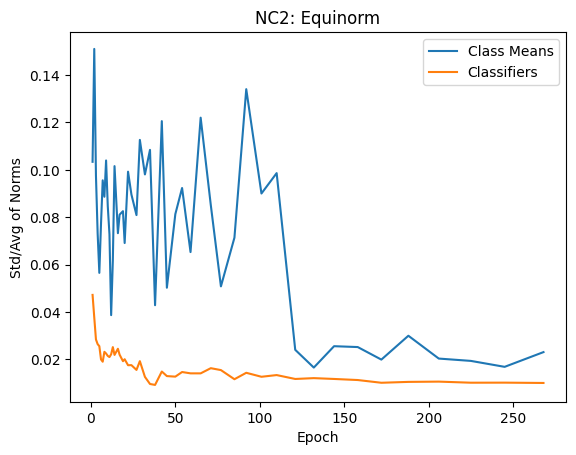

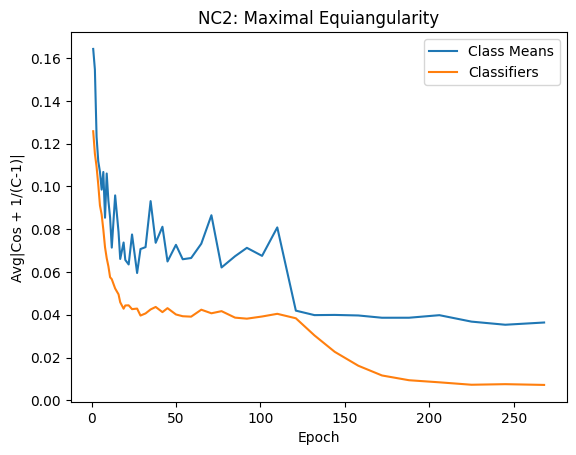

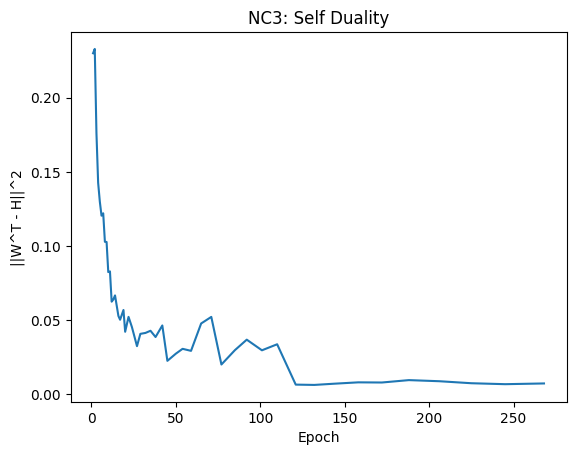

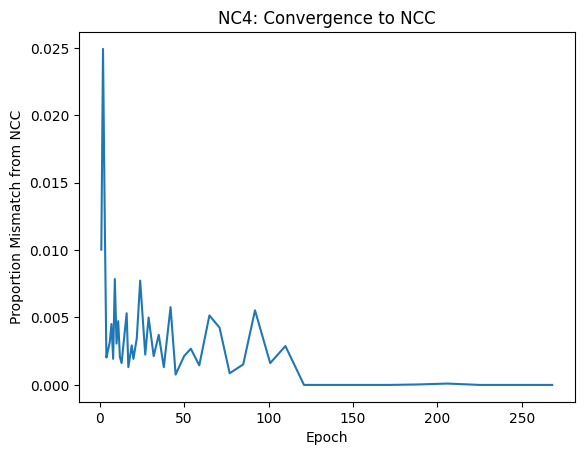

Train		Epoch: 269 [468/469 (100%)] 	Batch Loss: 0.002063 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.63it/s]
Train		Epoch: 270 [468/469 (100%)] 	Batch Loss: 0.000890 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.60it/s]
Train		Epoch: 271 [468/469 (100%)] 	Batch Loss: 0.000884 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.65it/s]
Train		Epoch: 272 [468/469 (100%)] 	Batch Loss: 0.000872 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.66it/s]
Train		Epoch: 273 [468/469 (100%)] 	Batch Loss: 0.000785 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.64it/s]
Train		Epoch: 274 [468/469 (100%)] 	Batch Loss: 0.001023 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.65it/s]
Train		Epoch: 275 [468/469 (100%)] 	Batch Loss: 0.000999 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.67it/s]
Train		Epoch: 276 [468/469 (100%)] 	Batch Loss: 0.000787 	Batc

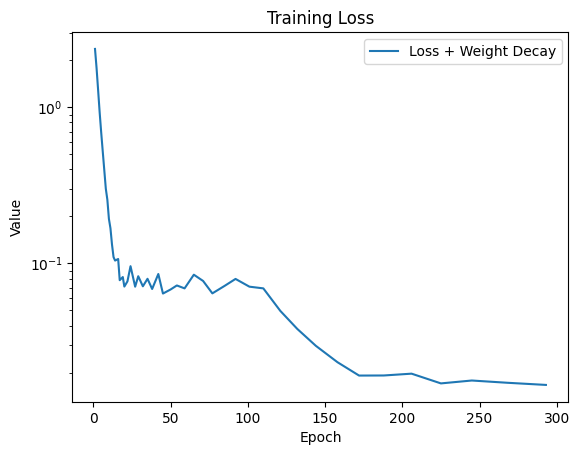

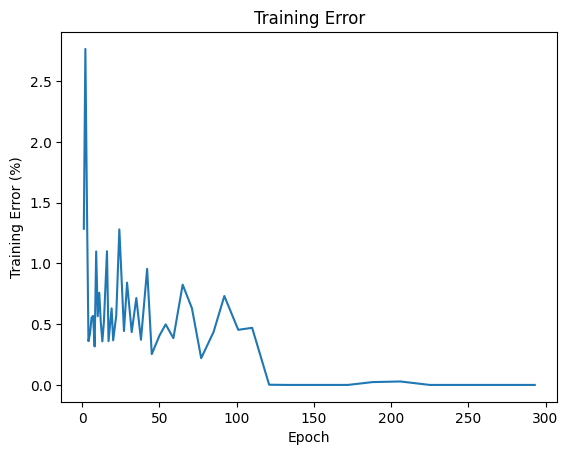

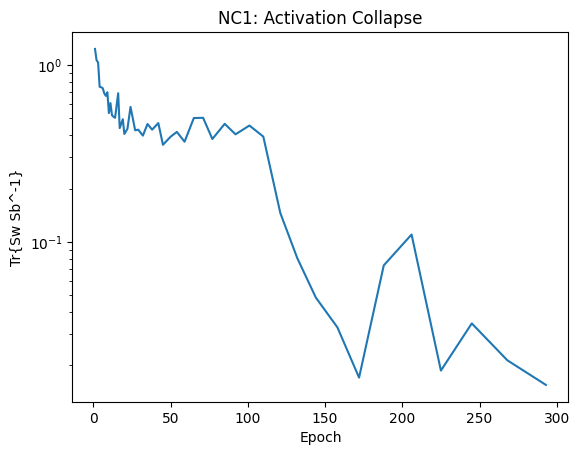

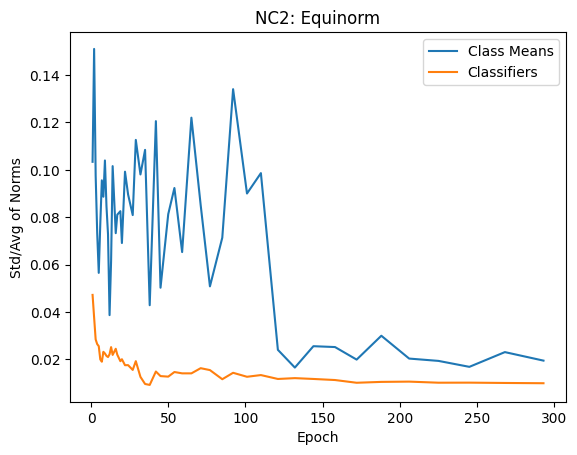

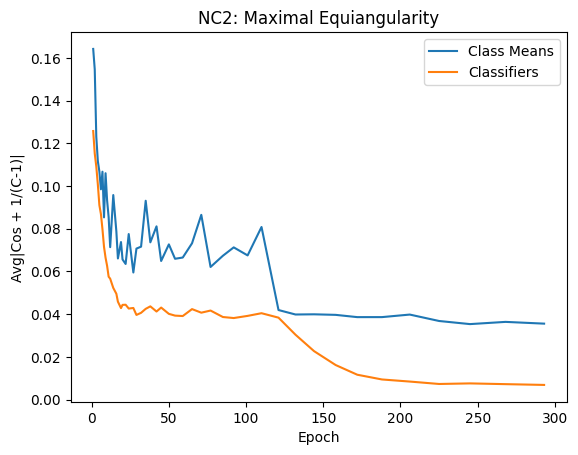

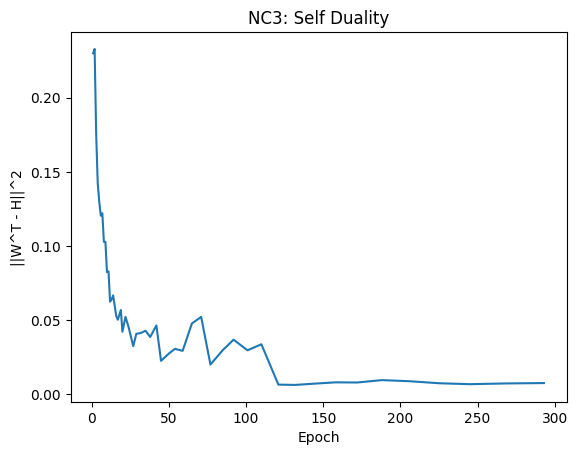

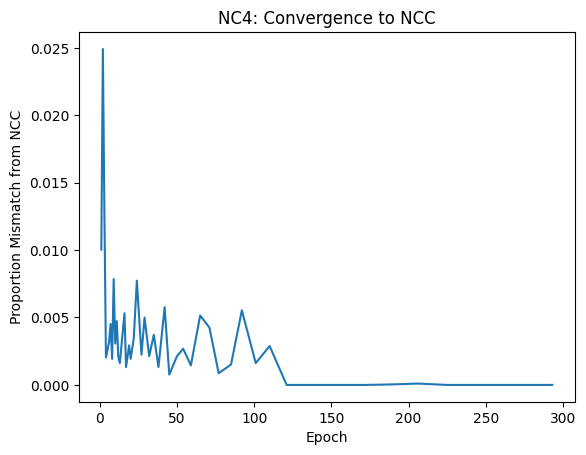

Train		Epoch: 294 [468/469 (100%)] 	Batch Loss: 0.000770 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.65it/s]
Train		Epoch: 295 [468/469 (100%)] 	Batch Loss: 0.000703 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.60it/s]
Train		Epoch: 296 [468/469 (100%)] 	Batch Loss: 0.000859 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.64it/s]
Train		Epoch: 297 [468/469 (100%)] 	Batch Loss: 0.001282 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.61it/s]
Train		Epoch: 298 [468/469 (100%)] 	Batch Loss: 0.000842 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.61it/s]
Train		Epoch: 299 [468/469 (100%)] 	Batch Loss: 0.000951 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.63it/s]
Train		Epoch: 300 [468/469 (100%)] 	Batch Loss: 0.000745 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.64it/s]
Train		Epoch: 301 [468/469 (100%)] 	Batch Loss: 0.000675 	Batc

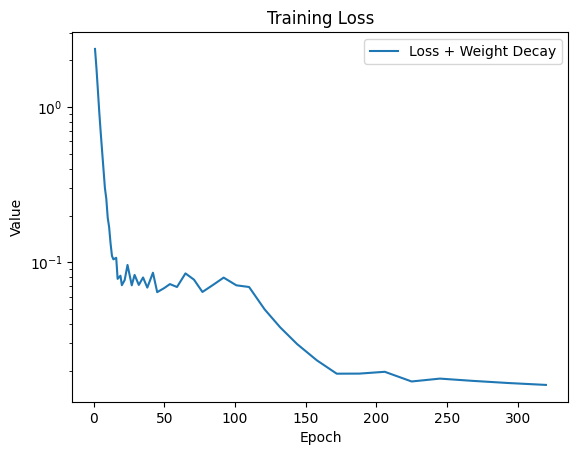

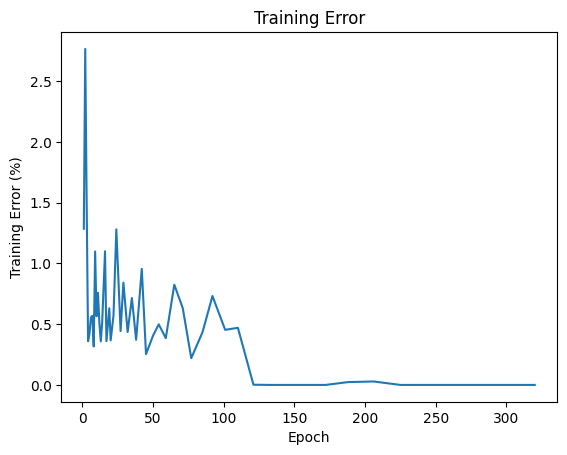

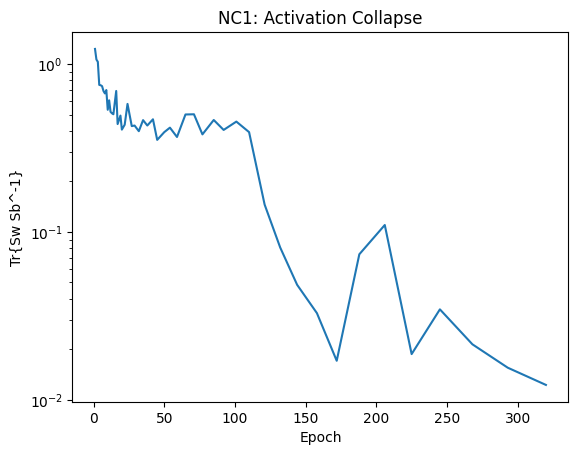

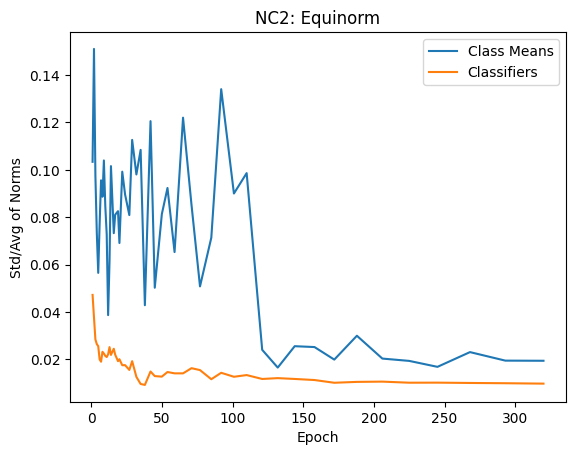

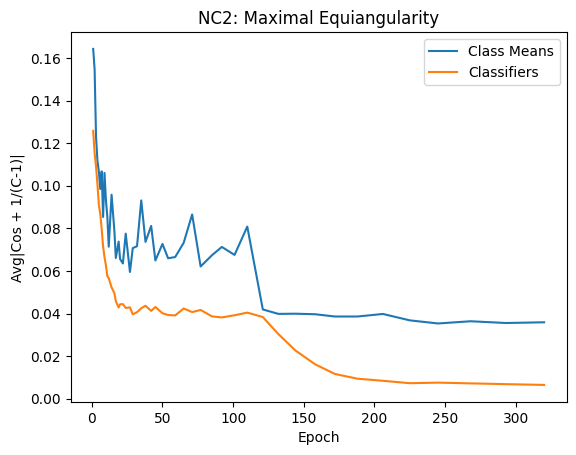

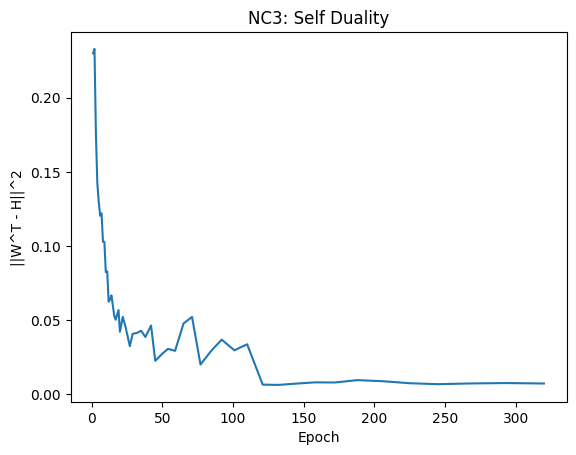

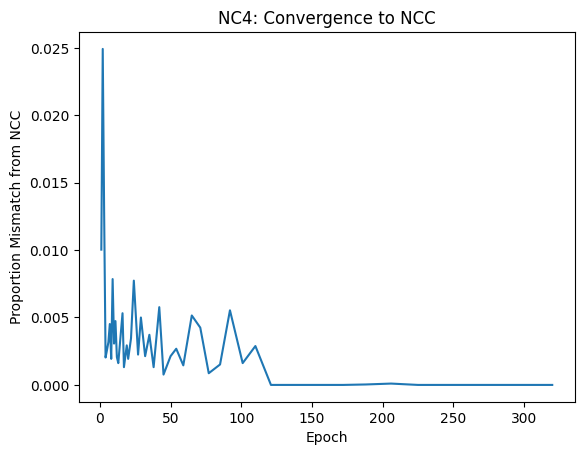

Train		Epoch: 321 [468/469 (100%)] 	Batch Loss: 0.000825 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.65it/s]
Train		Epoch: 322 [468/469 (100%)] 	Batch Loss: 0.000904 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.64it/s]
Train		Epoch: 323 [468/469 (100%)] 	Batch Loss: 0.000833 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.61it/s]
Train		Epoch: 324 [468/469 (100%)] 	Batch Loss: 0.000762 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.68it/s]
Train		Epoch: 325 [468/469 (100%)] 	Batch Loss: 0.000853 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.66it/s]
Train		Epoch: 326 [468/469 (100%)] 	Batch Loss: 0.000921 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:44<00:00, 10.63it/s]
Train		Epoch: 327 [468/469 (100%)] 	Batch Loss: 0.000881 	Batch Accuracy: 1.000000: 100%|█████████▉| 468/469 [00:43<00:00, 10.64it/s]
Train		Epoch: 328 [468/469 (100%)] 	Batch Loss: 0.001052 	Batc

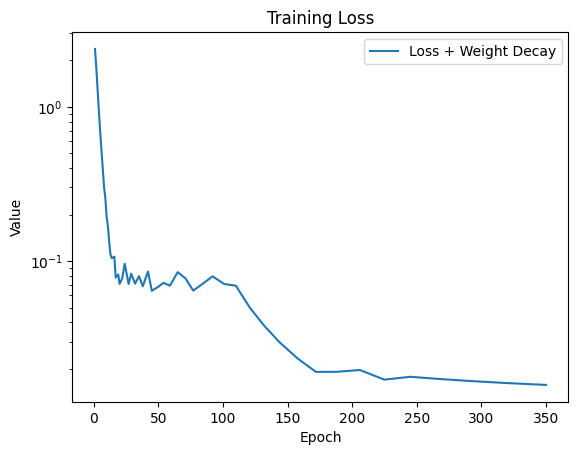

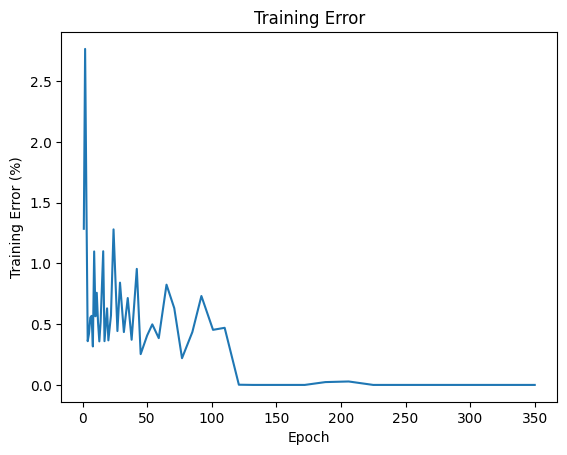

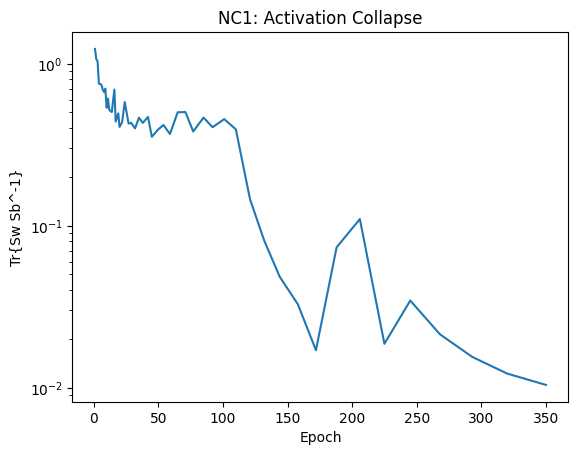

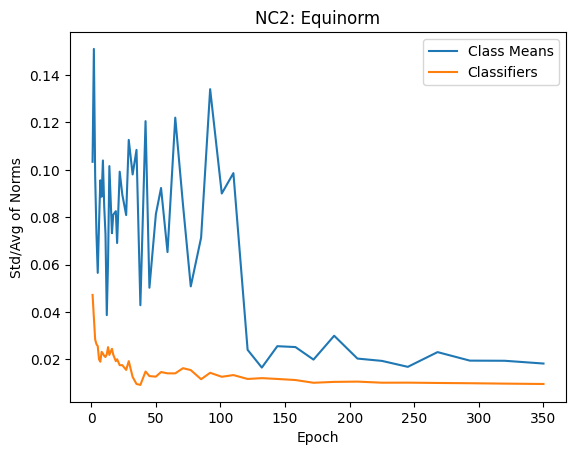

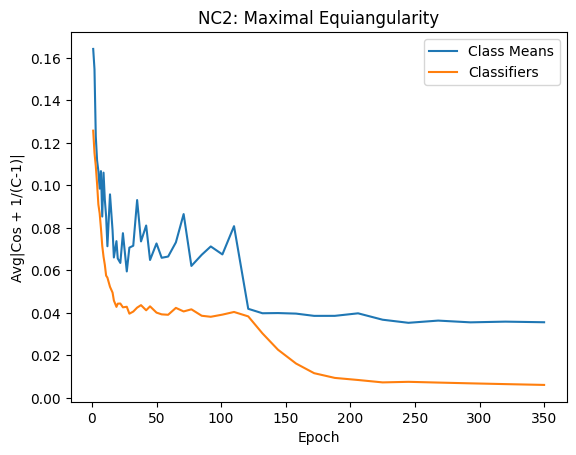

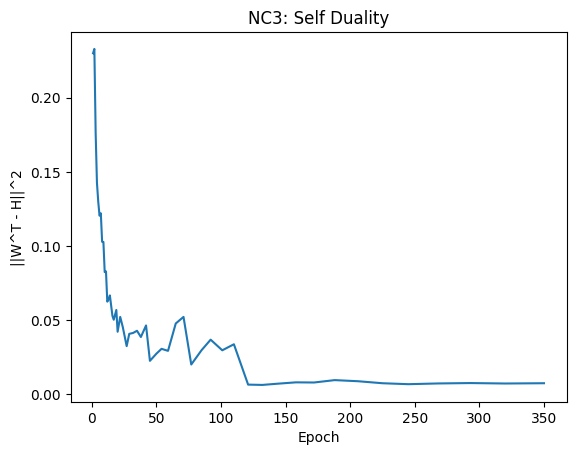

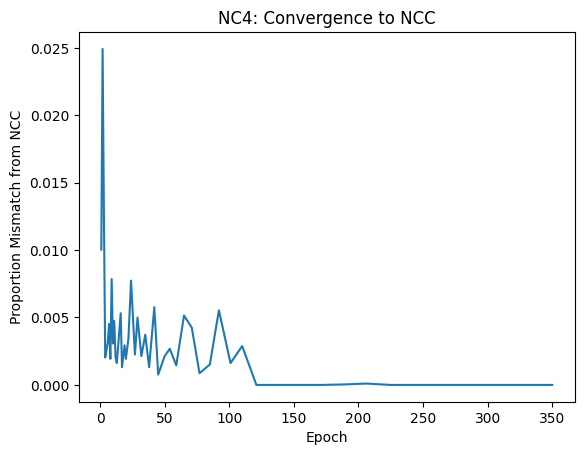

In [4]:
model = models.resnet18(pretrained=False, num_classes=C)
model.conv1 = nn.Conv2d(input_ch, model.conv1.weight.shape[0], 3, 1, 1, bias=False) # Small dataset filter size used by He et al. (2015)
model.maxpool = nn.MaxPool2d(kernel_size=1, stride=1, padding=0)
model = model.to(device)

class features:
    pass

def hook(self, input, output):
    features.value = input[0].clone()

# register hook that saves last-layer input into features
classifier = model.fc
classifier.register_forward_hook(hook)

transform = transforms.Compose([transforms.Pad((padded_im_size - im_size)//2),
                                transforms.ToTensor(),
                                transforms.Normalize(0.1307,0.3081)])

train_loader = torch.utils.data.DataLoader(
    datasets.MNIST('../data', train=True, download=True, transform=transform),
    batch_size=batch_size, shuffle=True)

analysis_loader = torch.utils.data.DataLoader(
    datasets.MNIST('../data', train=True, download=True, transform=transform),
    batch_size=batch_size, shuffle=True)

if loss_name == 'CrossEntropyLoss':
  criterion = nn.CrossEntropyLoss()
  criterion_summed = nn.CrossEntropyLoss(reduction='sum')
elif loss_name == 'MSELoss':
  criterion = nn.MSELoss()
  criterion_summed = nn.MSELoss(reduction='sum')

optimizer = optim.SGD(model.parameters(),
                      lr=lr,
                      momentum=momentum,
                      weight_decay=weight_decay)

lr_scheduler = optim.lr_scheduler.MultiStepLR(optimizer,
                                              milestones=epochs_lr_decay,
                                              gamma=lr_decay)

class graphs:
  def __init__(self):
    self.accuracy     = []
    self.loss         = []
    self.reg_loss     = []

    # NC1
    self.Sw_invSb     = []

    # NC2
    self.norm_M_CoV   = []
    self.norm_W_CoV   = []
    self.cos_M        = []
    self.cos_W        = []

    # NC3
    self.W_M_dist     = []
    
    # NC4
    self.NCC_mismatch = []

    # Decomposition
    self.MSE_wd_features = []
    self.LNC1 = []
    self.LNC23 = []
    self.Lperp = []
graphs = graphs()

cur_epochs = []
for epoch in range(1, epochs + 1):
    train(model, criterion, device, C, train_loader, optimizer, epoch)
    lr_scheduler.step()
    
    if epoch in epoch_list:
        cur_epochs.append(epoch)
        analysis(graphs, model, criterion_summed, device, C, analysis_loader)
        
        plt.figure(1)
        plt.semilogy(cur_epochs, graphs.reg_loss)
        plt.legend(['Loss + Weight Decay'])
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.title('Training Loss')

        plt.figure(2)
        plt.plot(cur_epochs, 100*(1 - np.array(graphs.accuracy)))
        plt.xlabel('Epoch')
        plt.ylabel('Training Error (%)')
        plt.title('Training Error')

        plt.figure(3)
        plt.semilogy(cur_epochs, graphs.Sw_invSb)
        plt.xlabel('Epoch')
        plt.ylabel('Tr{Sw Sb^-1}')
        plt.title('NC1: Activation Collapse')

        plt.figure(4)
        plt.plot(cur_epochs, graphs.norm_M_CoV)
        plt.plot(cur_epochs, graphs.norm_W_CoV)
        plt.legend(['Class Means','Classifiers'])
        plt.xlabel('Epoch')
        plt.ylabel('Std/Avg of Norms')
        plt.title('NC2: Equinorm')
        
        plt.figure(5)
        plt.plot(cur_epochs, graphs.cos_M)
        plt.plot(cur_epochs, graphs.cos_W)
        plt.legend(['Class Means','Classifiers'])
        plt.xlabel('Epoch')
        plt.ylabel('Avg|Cos + 1/(C-1)|')
        plt.title('NC2: Maximal Equiangularity')

        plt.figure(6)
        plt.plot(cur_epochs,graphs.W_M_dist)
        plt.xlabel('Epoch')
        plt.ylabel('||W^T - H||^2')
        plt.title('NC3: Self Duality')

        plt.figure(7)
        plt.plot(cur_epochs,graphs.NCC_mismatch)
        plt.xlabel('Epoch')
        plt.ylabel('Proportion Mismatch from NCC')
        plt.title('NC4: Convergence to NCC')

        # Plot decomposition of MSE loss
        if loss_name == 'MSELoss':
          plt.figure(8)
          plt.semilogy(cur_epochs, graphs.MSE_wd_features)
          plt.semilogy(cur_epochs, graphs.LNC1)
          plt.semilogy(cur_epochs, graphs.LNC23)
          plt.semilogy(cur_epochs, graphs.Lperp)
          plt.legend(['MSE+wd', 'LNC1', 'LNC2/3', 'Lperp'])
          plt.xlabel('Epoch')
          plt.ylabel('Value')
          plt.title('Decomposition of MSE')

        plt.show()